# Continuous Control

---

In this notebook, you will learn how to use the Unity ML-Agents environment for the second project of the [Deep Reinforcement Learning Nanodegree](https://www.udacity.com/course/deep-reinforcement-learning-nanodegree--nd893) program.

### 1. Start the Environment

We begin by importing the necessary packages.  If the code cell below returns an error, please revisit the project instructions to double-check that you have installed [Unity ML-Agents](https://github.com/Unity-Technologies/ml-agents/blob/master/docs/Installation.md) and [NumPy](http://www.numpy.org/).

In [1]:
from unityagents import UnityEnvironment
import numpy as np

Next, we will start the environment!  **_Before running the code cell below_**, change the `file_name` parameter to match the location of the Unity environment that you downloaded.

- **Mac**: `"path/to/Reacher.app"`
- **Windows** (x86): `"path/to/Reacher_Windows_x86/Reacher.exe"`
- **Windows** (x86_64): `"path/to/Reacher_Windows_x86_64/Reacher.exe"`
- **Linux** (x86): `"path/to/Reacher_Linux/Reacher.x86"`
- **Linux** (x86_64): `"path/to/Reacher_Linux/Reacher.x86_64"`
- **Linux** (x86, headless): `"path/to/Reacher_Linux_NoVis/Reacher.x86"`
- **Linux** (x86_64, headless): `"path/to/Reacher_Linux_NoVis/Reacher.x86_64"`

For instance, if you are using a Mac, then you downloaded `Reacher.app`.  If this file is in the same folder as the notebook, then the line below should appear as follows:
```
env = UnityEnvironment(file_name="Reacher.app")
```

In [2]:
env = UnityEnvironment(file_name='Reacher.app')

INFO:unityagents:
'Academy' started successfully!
Unity Academy name: Academy
        Number of Brains: 1
        Number of External Brains : 1
        Lesson number : 0
        Reset Parameters :
		goal_speed -> 1.0
		goal_size -> 5.0
Unity brain name: ReacherBrain
        Number of Visual Observations (per agent): 0
        Vector Observation space type: continuous
        Vector Observation space size (per agent): 33
        Number of stacked Vector Observation: 1
        Vector Action space type: continuous
        Vector Action space size (per agent): 4
        Vector Action descriptions: , , , 


Environments contain **_brains_** which are responsible for deciding the actions of their associated agents. Here we check for the first brain available, and set it as the default brain we will be controlling from Python.

In [3]:
# Examine environment parameters
print(str(env))
# get the default brain
brain_name = env.brain_names[0]
brain = env.brains[brain_name]

Unity Academy name: Academy
        Number of Brains: 1
        Number of External Brains : 1
        Lesson number : 0
        Reset Parameters :
		goal_speed -> 1.0
		goal_size -> 5.0
Unity brain name: ReacherBrain
        Number of Visual Observations (per agent): 0
        Vector Observation space type: continuous
        Vector Observation space size (per agent): 33
        Number of stacked Vector Observation: 1
        Vector Action space type: continuous
        Vector Action space size (per agent): 4
        Vector Action descriptions: , , , 


### 2. Examine the State and Action Spaces

In this environment, a double-jointed arm can move to target locations. A reward of `+0.1` is provided for each step that the agent's hand is in the goal location. Thus, the goal of your agent is to maintain its position at the target location for as many time steps as possible.

The observation space consists of `33` variables corresponding to position, rotation, velocity, and angular velocities of the arm.  Each action is a vector with four numbers, corresponding to torque applicable to two joints.  Every entry in the action vector must be a number between `-1` and `1`.

Run the code cell below to print some information about the environment.

In [4]:
# reset the environment
env_info = env.reset(train_mode=True)[brain_name]

# number of agents
num_agents = len(env_info.agents)
print('Number of agents:', num_agents)

# size of each action
action_size = brain.vector_action_space_size
print('Size of each action:', action_size)

# examine the state space 
states = env_info.vector_observations
state_size = states.shape[1]
print('There are {} agents. Each observes a state with length: {}'.format(states.shape[0], state_size))
print('The state for the first agent looks like:', states[0])


# Reset the environment
env_info = env.reset(train_mode=True)[brain_name]

# Examine the state space for the default brain
print("Agent state looks like: \n{}".format(env_info.vector_observations[0]))

# Examine the observation space for the default brain
for observation in env_info.visual_observations:
    print("Agent observations look like:")
    if observation.shape[3] == 3:
        plt.imshow(observation[0,:,:,:])
    else:
        plt.imshow(observation[0,:,:,0])

Number of agents: 20
Size of each action: 4
There are 20 agents. Each observes a state with length: 33
The state for the first agent looks like: [ 0.00000000e+00 -4.00000000e+00  0.00000000e+00  1.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -4.37113883e-08  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.00000000e+01  0.00000000e+00
  1.00000000e+00 -0.00000000e+00 -0.00000000e+00 -4.37113883e-08
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  5.75471878e+00 -1.00000000e+00
  5.55726624e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00
 -1.68164849e-01]
Agent state looks like: 
[ 0.00000000e+00 -4.00000000e+00  0.00000000e+00  1.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -4.37113883e-08  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.00000000e+01  0.00000000e+00
  1.00000000e+00 -0.00000000e+00

### 3. Take Random Actions in the Environment

In the next code cell, you will learn how to use the Python API to control the agent and receive feedback from the environment.

Once this cell is executed, you will watch the agent's performance, if it selects an action at random with each time step.  A window should pop up that allows you to observe the agent, as it moves through the environment.  

Of course, as part of the project, you'll have to change the code so that the agent is able to use its experience to gradually choose better actions when interacting with the environment!

In [5]:
#env_info = env.reset(train_mode=False)[brain_name]     # reset the environment    
#states = env_info.vector_observations                  # get the current state (for each agent)
#scores = np.zeros(num_agents)                          # initialize the score (for each agent)
#while True:
#    actions = np.random.randn(num_agents, action_size) # select an action (for each agent)
#    actions = np.clip(actions, -1, 1)                  # all actions between -1 and 1
#    env_info = env.step(actions)[brain_name]           # send all actions to tne environment
#    next_states = env_info.vector_observations         # get next state (for each agent)
#    rewards = env_info.rewards                         # get reward (for each agent)
#    dones = env_info.local_done                        # see if episode finished
#    scores += env_info.rewards                         # update the score (for each agent)
#    states = next_states                               # roll over states to next time step
#    if np.any(dones):                                  # exit loop if episode finished
#        break
#print('Total score (averaged over agents) this episode: {}'.format(np.mean(scores)))

When finished, you can close the environment.

In [6]:
 #env.close()

### 4. It's Your Turn!

Now it's your turn to train your own agent to solve the environment!  When training the environment, set `train_mode=True`, so that the line for resetting the environment looks like the following:
```python
env_info = env.reset(train_mode=True)[brain_name]
```

In [7]:
import matplotlib.pyplot as plt

def plot_score(y, actor,critic,buffer,batch,addinfo):
    """Plot Function.
    
    Params
    ======
        y : vaiable input
        actor: describtion of actor net
        critic: describtion of critic net
        buffer: buffer size
        batch: batch size
        addinfo: additional info
    """
        
    fig = plt.figure()
    ax = fig.add_subplot(111)
    plt.plot(np.arange(len(y)), y)
    plt.ylabel('Score')
    plt.xlabel('Episode ')
    plt.title('Actor'+str(actor)+'_Critic'+str(critic)+'_Buffer' + str(int(buffer))+'_Batch'+str(int(batch))+'_'+str(addinfo))
    plt.show()

/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


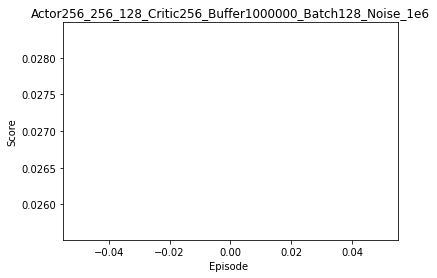

Episode [1/1000]	Average scores: 0.03


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


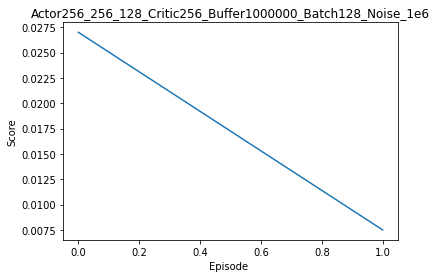

Episode [2/1000]	Average scores: 0.01


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


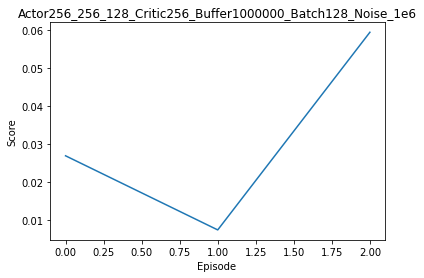

Episode [3/1000]	Average scores: 0.06


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


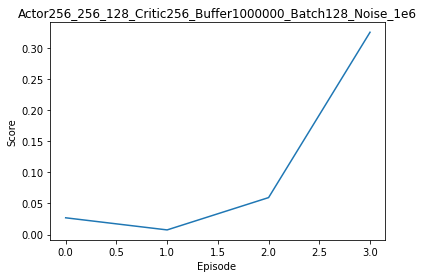

Episode [4/1000]	Average scores: 0.33


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


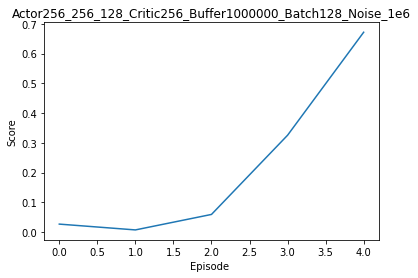

Episode [5/1000]	Average scores: 0.67


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


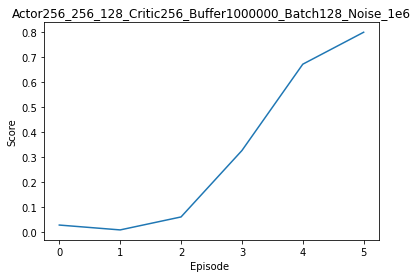

Episode [6/1000]	Average scores: 0.80


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


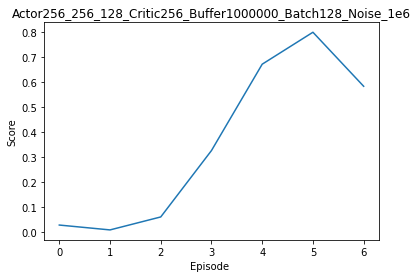

Episode [7/1000]	Average scores: 0.58


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


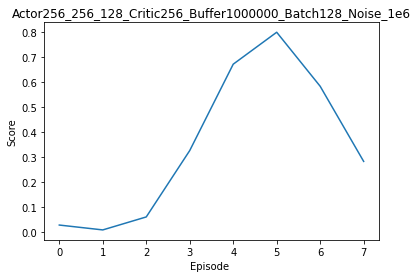

Episode [8/1000]	Average scores: 0.28


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


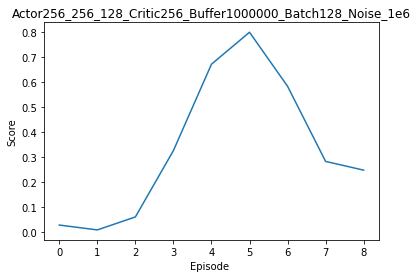

Episode [9/1000]	Average scores: 0.25


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


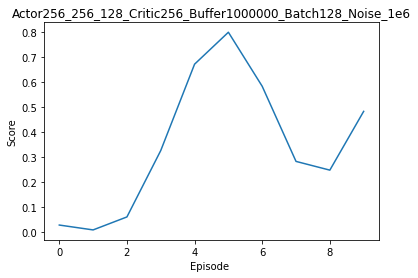

Episode [10/1000]	Average scores: 0.48


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


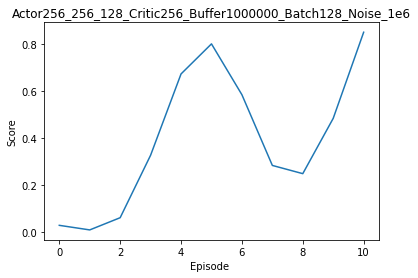

Episode [11/1000]	Average scores: 0.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


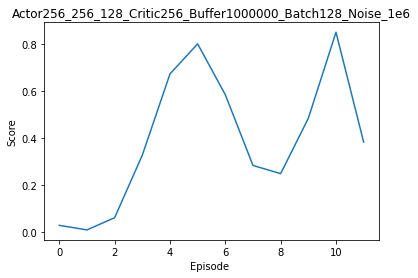

Episode [12/1000]	Average scores: 0.38


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


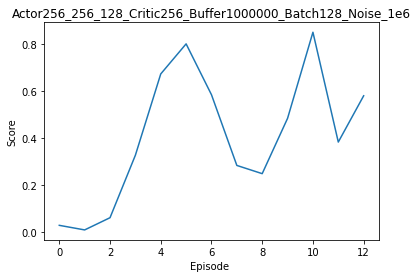

Episode [13/1000]	Average scores: 0.58


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


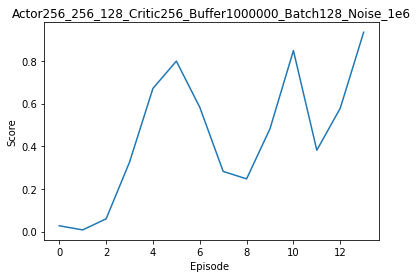

Episode [14/1000]	Average scores: 0.93


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


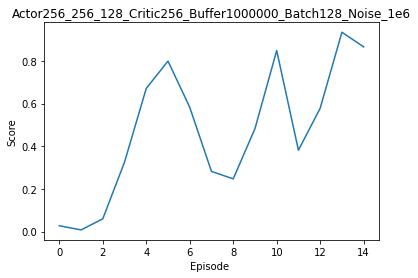

Episode [15/1000]	Average scores: 0.87


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


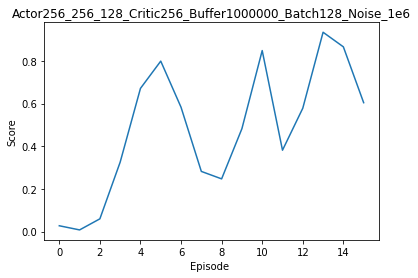

Episode [16/1000]	Average scores: 0.60


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


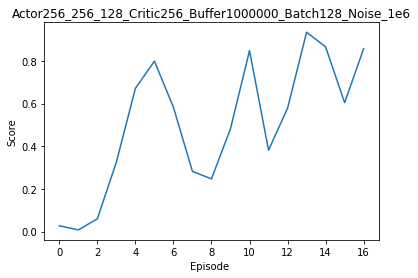

Episode [17/1000]	Average scores: 0.86


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


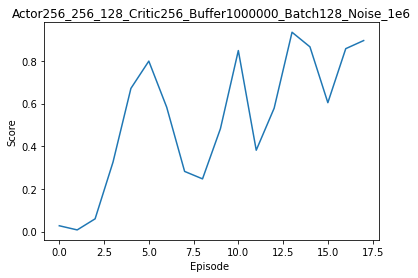

Episode [18/1000]	Average scores: 0.90


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


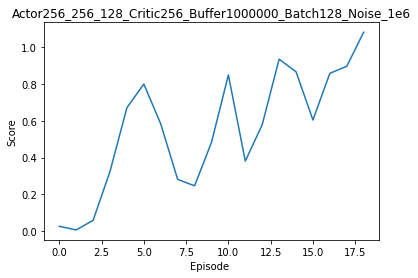

Episode [19/1000]	Average scores: 1.08


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


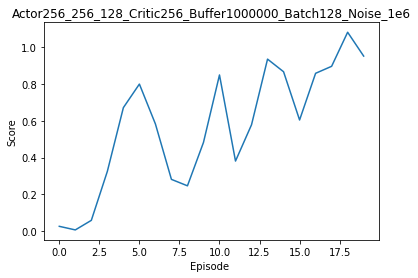

Episode [20/1000]	Average scores: 0.95


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


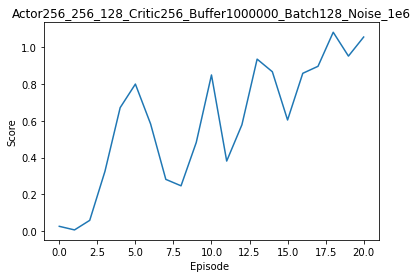

Episode [21/1000]	Average scores: 1.05


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


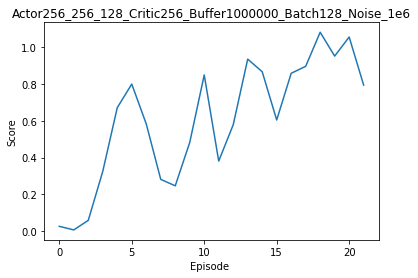

Episode [22/1000]	Average scores: 0.79


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


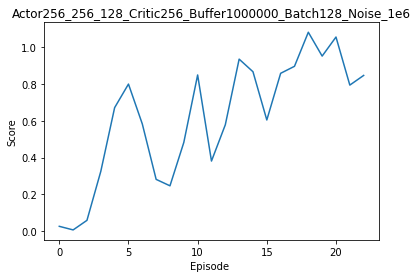

Episode [23/1000]	Average scores: 0.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


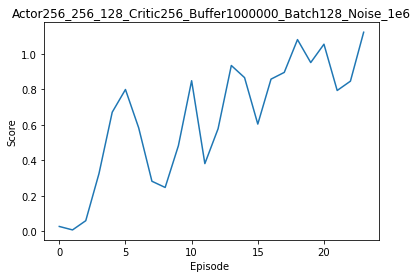

Episode [24/1000]	Average scores: 1.12


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


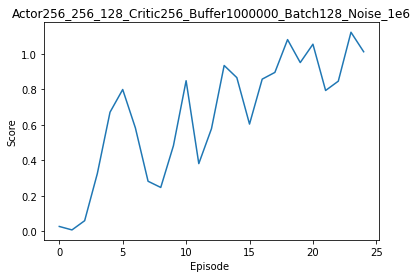

Episode [25/1000]	Average scores: 1.01


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


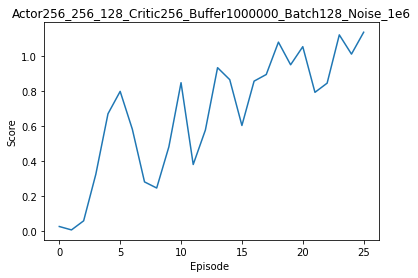

Episode [26/1000]	Average scores: 1.14


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


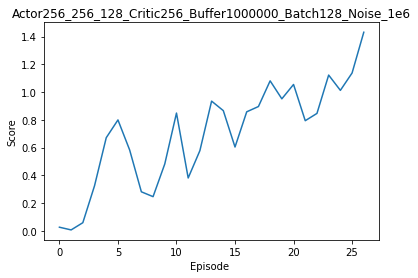

Episode [27/1000]	Average scores: 1.43


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


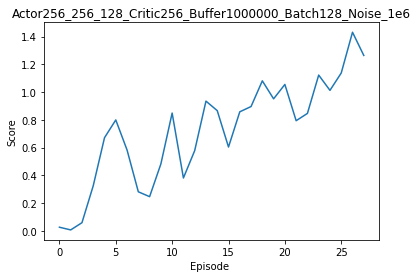

Episode [28/1000]	Average scores: 1.26


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


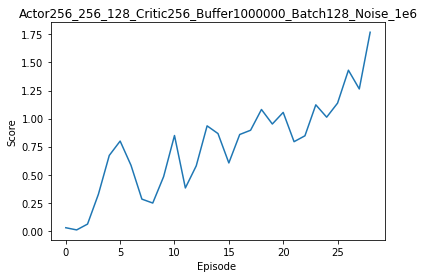

Episode [29/1000]	Average scores: 1.77


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


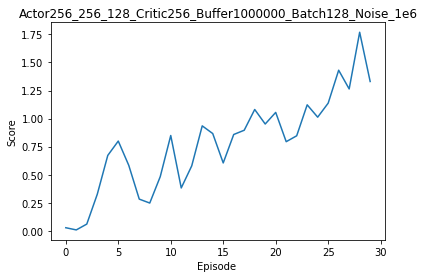

Episode [30/1000]	Average scores: 1.33


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


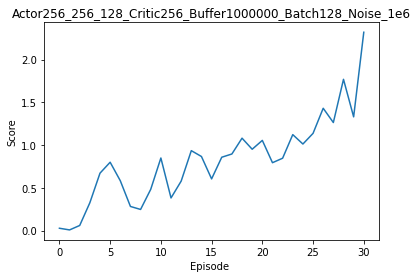

Episode [31/1000]	Average scores: 2.32


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


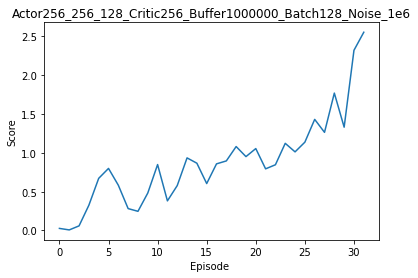

Episode [32/1000]	Average scores: 2.55


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


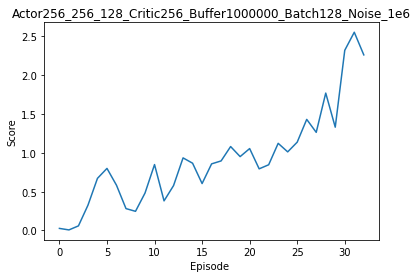

Episode [33/1000]	Average scores: 2.26


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


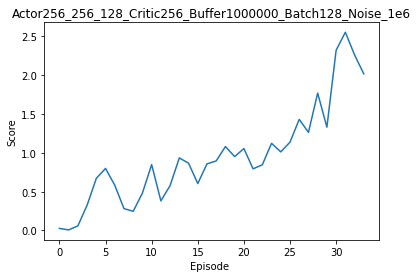

Episode [34/1000]	Average scores: 2.02


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


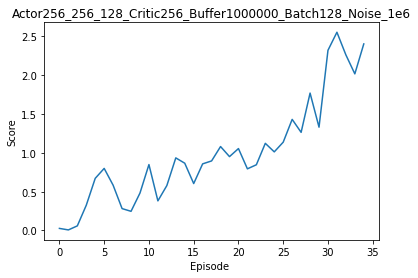

Episode [35/1000]	Average scores: 2.40


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


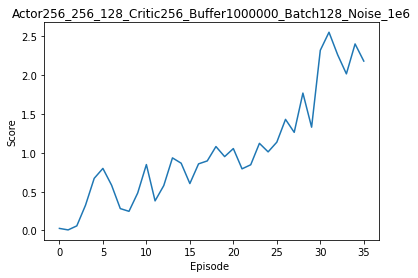

Episode [36/1000]	Average scores: 2.18


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


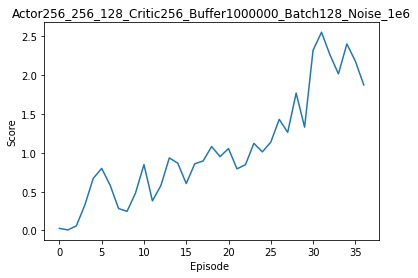

Episode [37/1000]	Average scores: 1.87


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


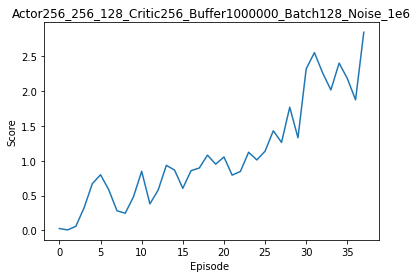

Episode [38/1000]	Average scores: 2.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


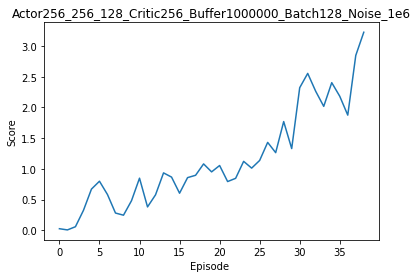

Episode [39/1000]	Average scores: 3.22


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


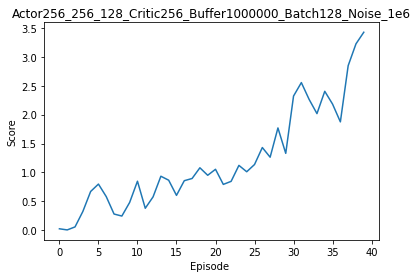

Episode [40/1000]	Average scores: 3.42


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


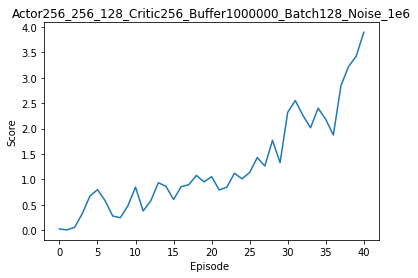

Episode [41/1000]	Average scores: 3.90


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


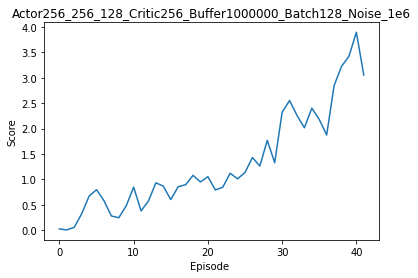

Episode [42/1000]	Average scores: 3.05


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


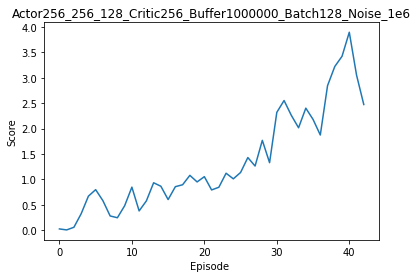

Episode [43/1000]	Average scores: 2.47


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


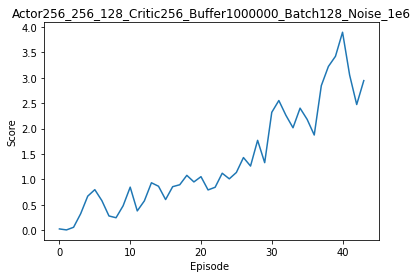

Episode [44/1000]	Average scores: 2.94


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


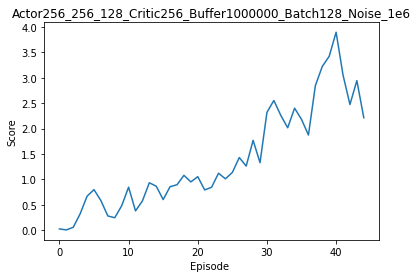

Episode [45/1000]	Average scores: 2.21


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


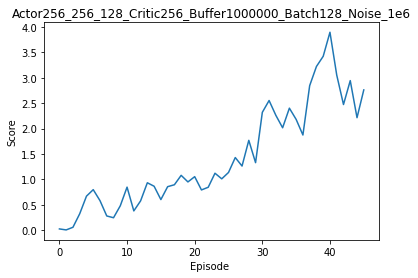

Episode [46/1000]	Average scores: 2.76


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


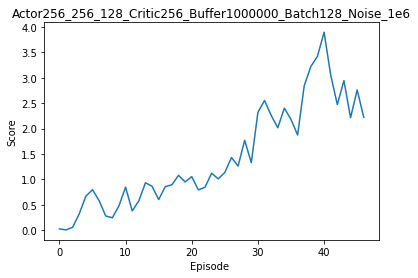

Episode [47/1000]	Average scores: 2.22


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


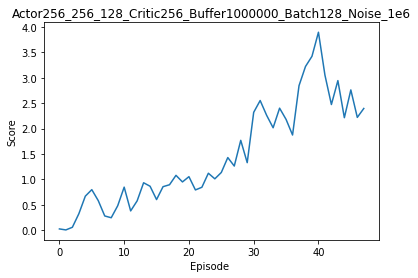

Episode [48/1000]	Average scores: 2.40


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


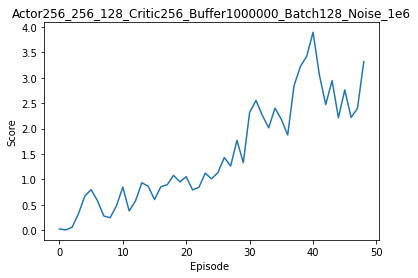

Episode [49/1000]	Average scores: 3.32


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


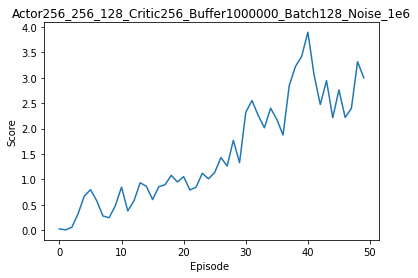

Episode [50/1000]	Average scores: 3.00


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


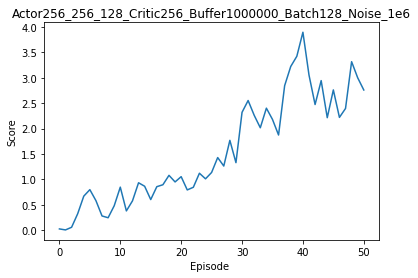

Episode [51/1000]	Average scores: 2.76


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


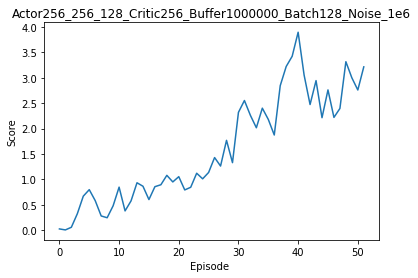

Episode [52/1000]	Average scores: 3.21


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


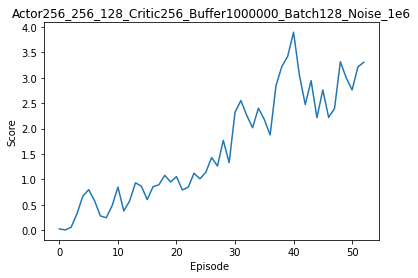

Episode [53/1000]	Average scores: 3.31


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


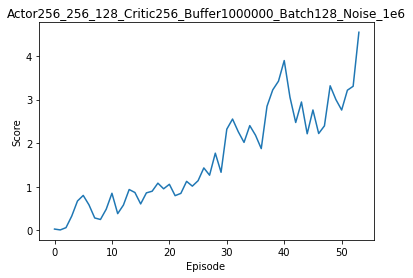

Episode [54/1000]	Average scores: 4.55


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


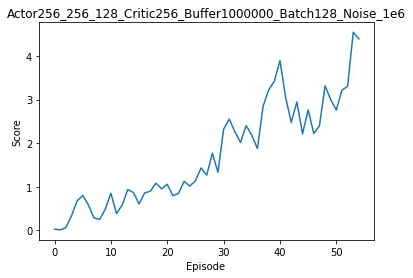

Episode [55/1000]	Average scores: 4.39


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


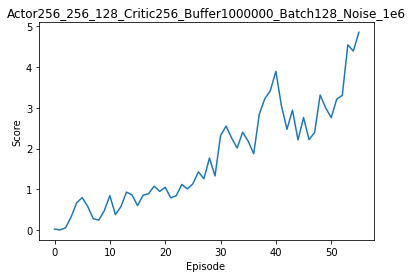

Episode [56/1000]	Average scores: 4.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


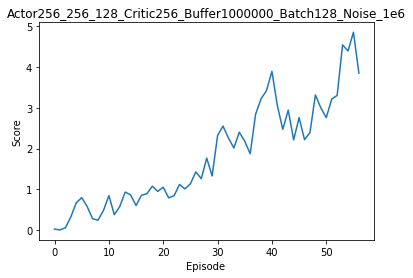

Episode [57/1000]	Average scores: 3.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


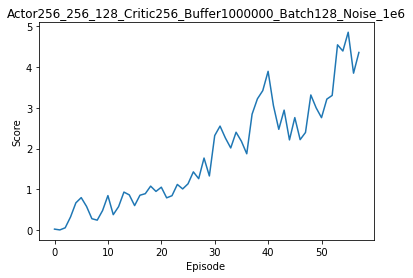

Episode [58/1000]	Average scores: 4.36


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


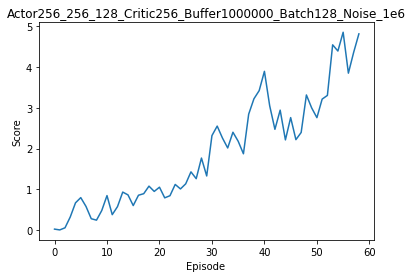

Episode [59/1000]	Average scores: 4.81


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


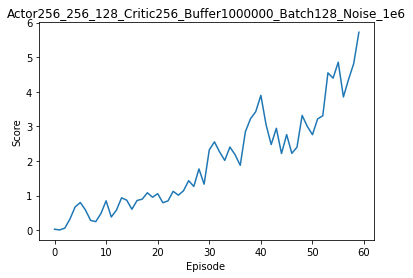

Episode [60/1000]	Average scores: 5.72


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


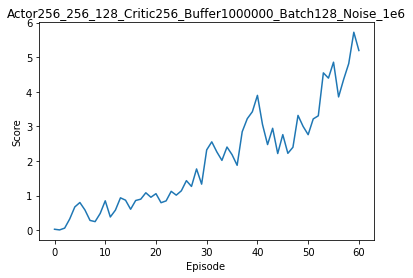

Episode [61/1000]	Average scores: 5.19


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


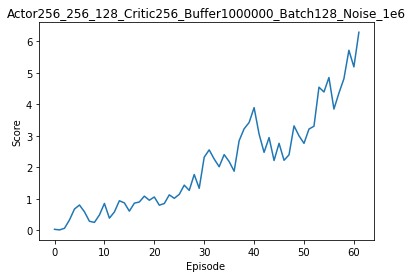

Episode [62/1000]	Average scores: 6.29


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


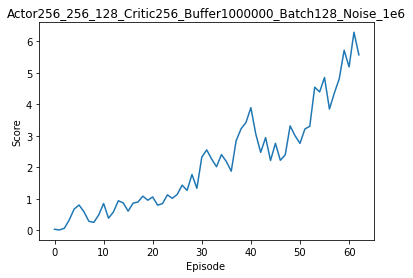

Episode [63/1000]	Average scores: 5.57


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


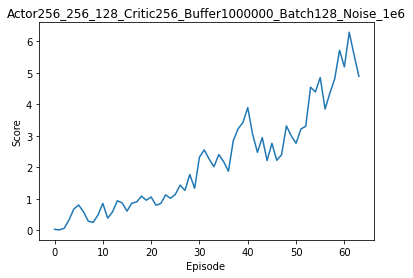

Episode [64/1000]	Average scores: 4.89


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


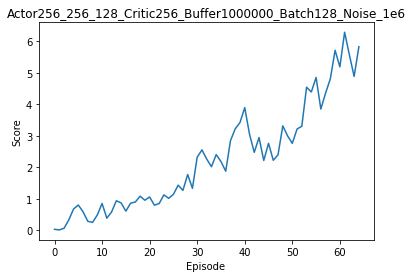

Episode [65/1000]	Average scores: 5.83


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


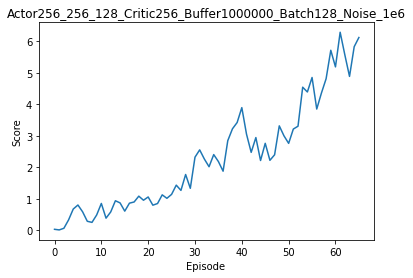

Episode [66/1000]	Average scores: 6.13


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


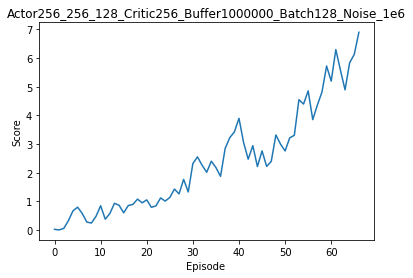

Episode [67/1000]	Average scores: 6.90


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


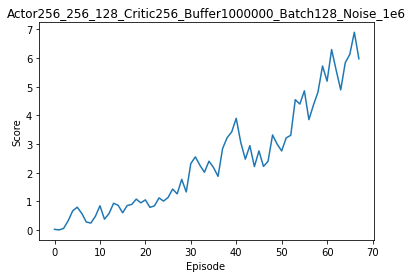

Episode [68/1000]	Average scores: 5.97


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


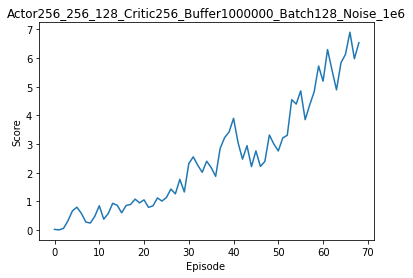

Episode [69/1000]	Average scores: 6.53


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


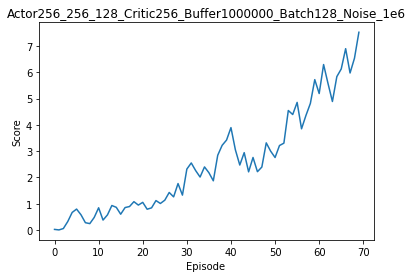

Episode [70/1000]	Average scores: 7.52


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


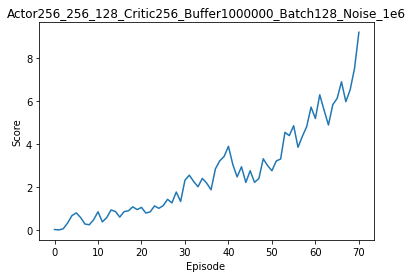

Episode [71/1000]	Average scores: 9.20


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


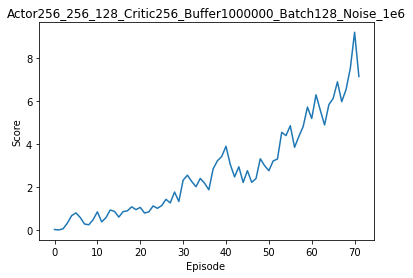

Episode [72/1000]	Average scores: 7.14


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


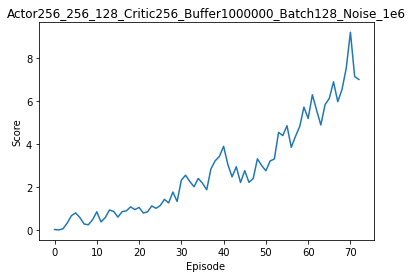

Episode [73/1000]	Average scores: 7.01


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


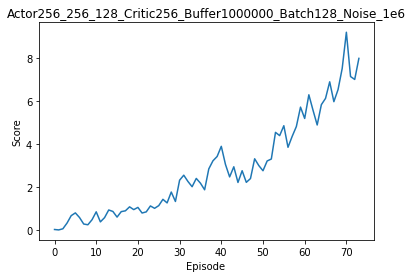

Episode [74/1000]	Average scores: 7.99


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


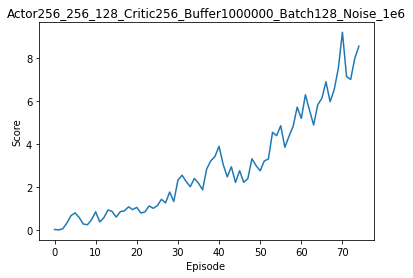

Episode [75/1000]	Average scores: 8.55


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


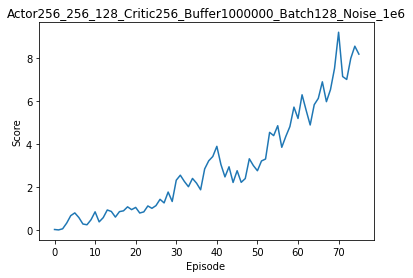

Episode [76/1000]	Average scores: 8.18


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


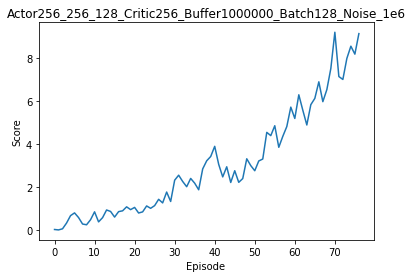

Episode [77/1000]	Average scores: 9.14


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


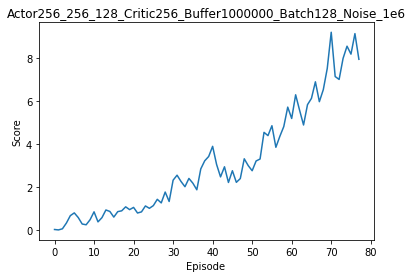

Episode [78/1000]	Average scores: 7.94


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


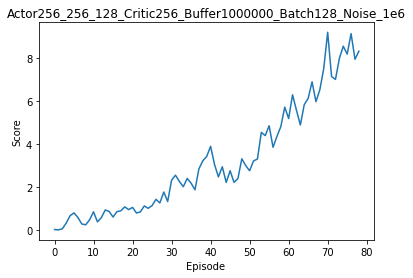

Episode [79/1000]	Average scores: 8.32


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


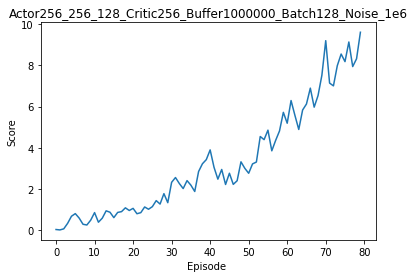

Episode [80/1000]	Average scores: 9.61


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


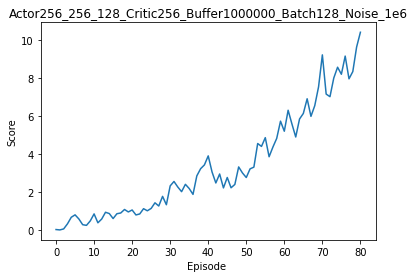

Episode [81/1000]	Average scores: 10.39


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


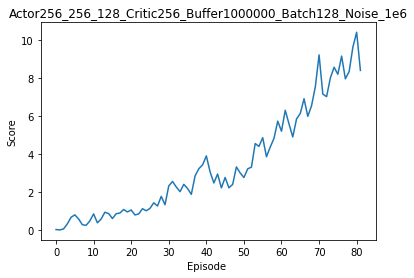

Episode [82/1000]	Average scores: 8.39


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


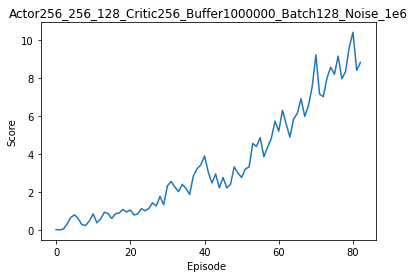

Episode [83/1000]	Average scores: 8.80


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


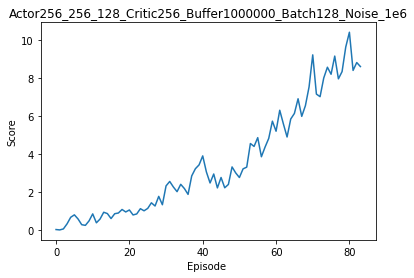

Episode [84/1000]	Average scores: 8.59


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


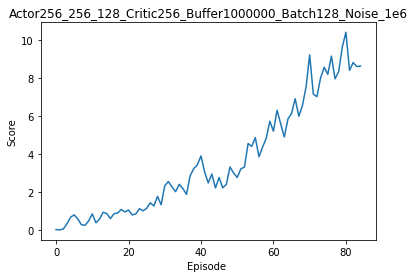

Episode [85/1000]	Average scores: 8.61


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


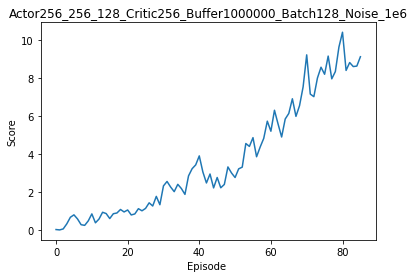

Episode [86/1000]	Average scores: 9.10


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


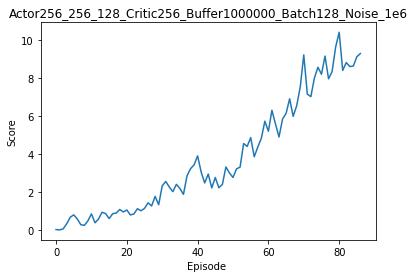

Episode [87/1000]	Average scores: 9.27


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


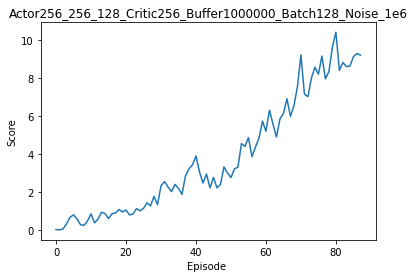

Episode [88/1000]	Average scores: 9.19


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


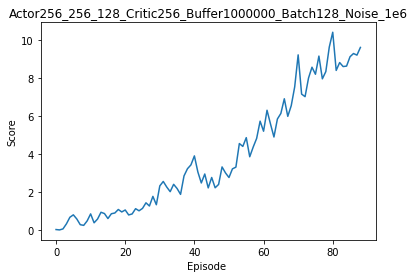

Episode [89/1000]	Average scores: 9.59


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


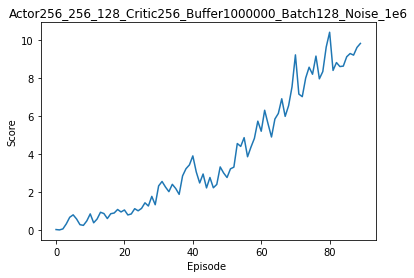

Episode [90/1000]	Average scores: 9.80


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


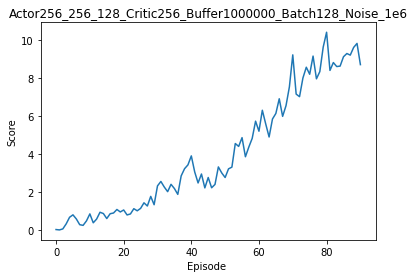

Episode [91/1000]	Average scores: 8.69


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


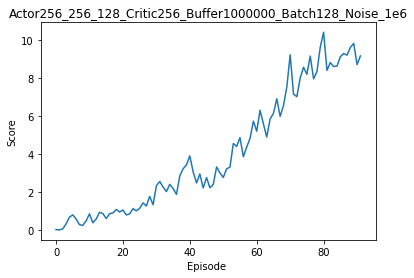

Episode [92/1000]	Average scores: 9.15


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


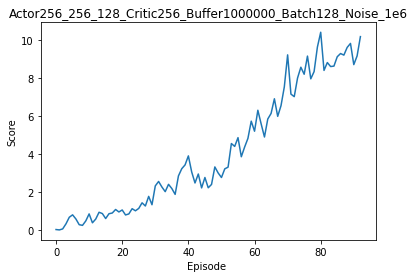

Episode [93/1000]	Average scores: 10.16


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


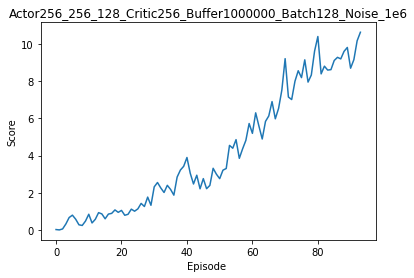

Episode [94/1000]	Average scores: 10.62


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


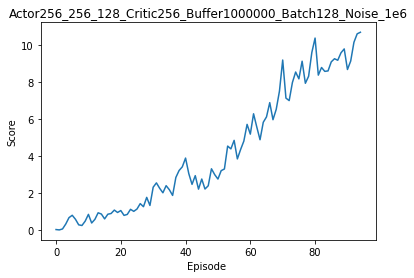

Episode [95/1000]	Average scores: 10.71


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


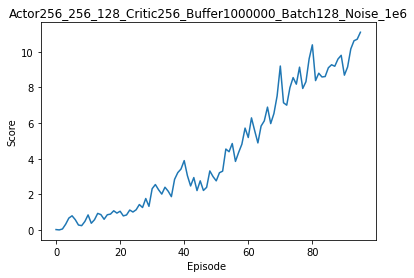

Episode [96/1000]	Average scores: 11.10


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


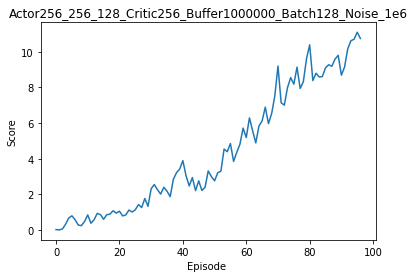

Episode [97/1000]	Average scores: 10.75


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


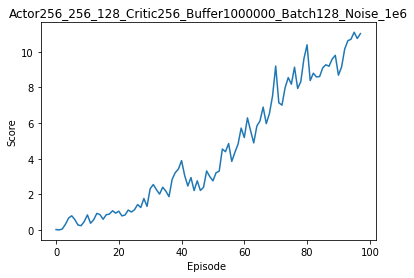

Episode [98/1000]	Average scores: 11.02


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


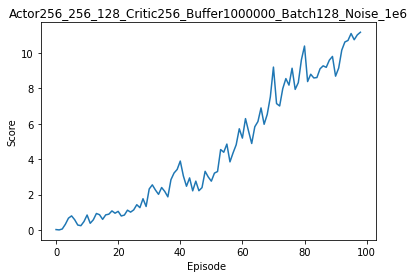

Episode [99/1000]	Average scores: 11.17


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


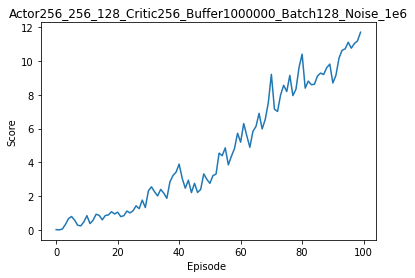

Episode [100/1000]	Average scores: 11.69


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


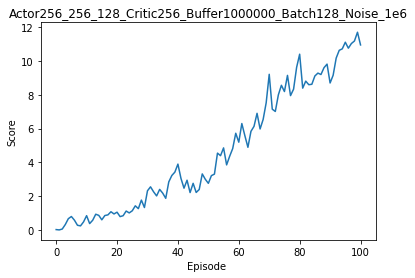

Episode [101/1000]	Average scores: 10.94


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


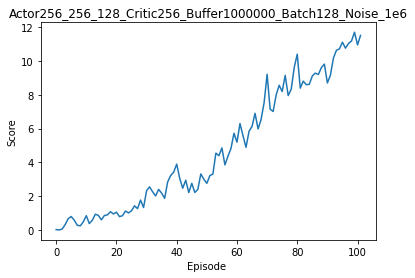

Episode [102/1000]	Average scores: 11.50


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


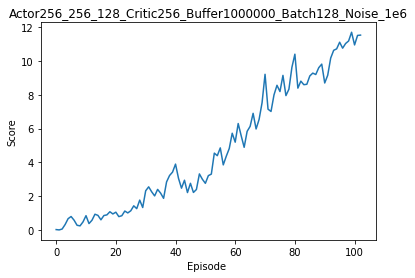

Episode [103/1000]	Average scores: 11.52


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


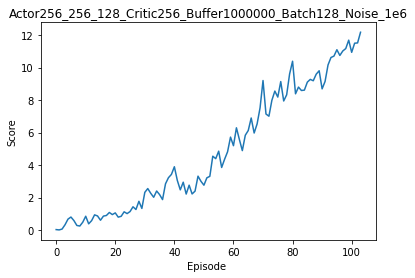

Episode [104/1000]	Average scores: 12.18


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


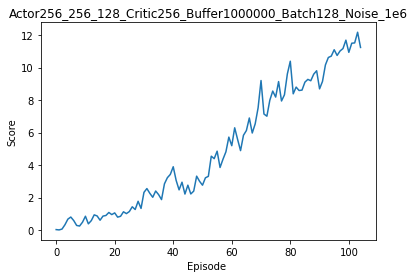

Episode [105/1000]	Average scores: 11.24


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


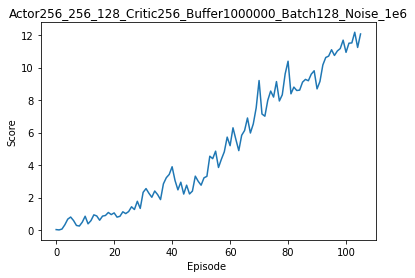

Episode [106/1000]	Average scores: 12.07


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


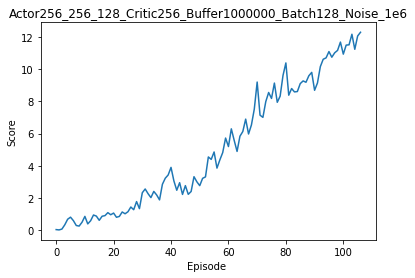

Episode [107/1000]	Average scores: 12.30


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


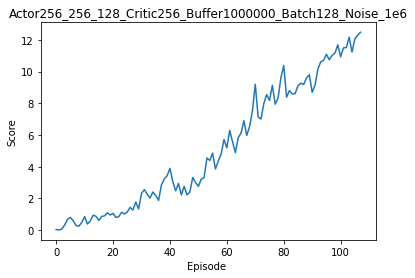

Episode [108/1000]	Average scores: 12.49


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


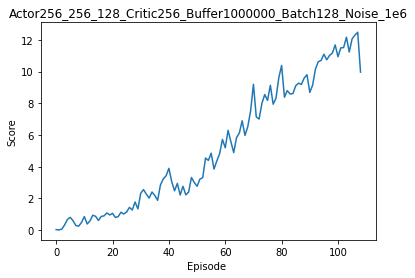

Episode [109/1000]	Average scores: 9.97


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


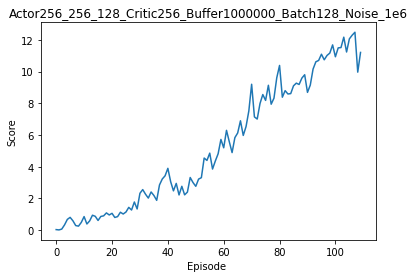

Episode [110/1000]	Average scores: 11.21


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


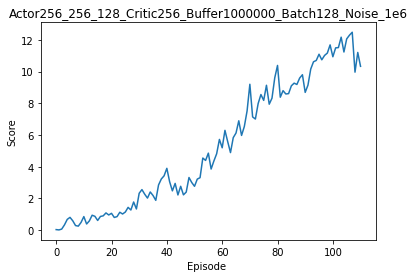

Episode [111/1000]	Average scores: 10.34


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


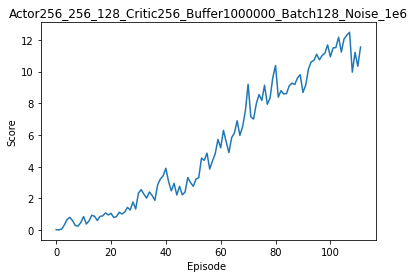

Episode [112/1000]	Average scores: 11.55


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


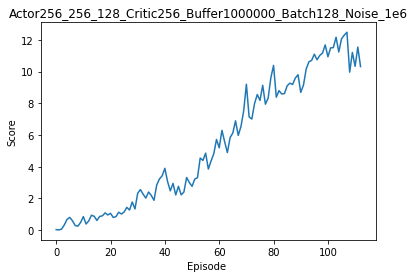

Episode [113/1000]	Average scores: 10.32


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


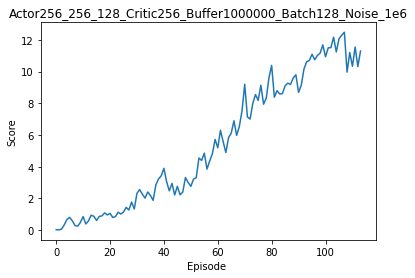

Episode [114/1000]	Average scores: 11.30


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


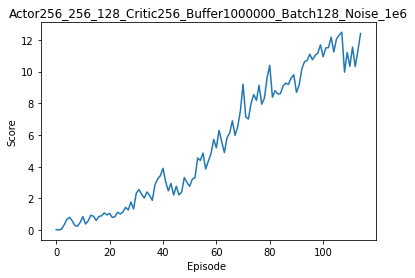

Episode [115/1000]	Average scores: 12.41


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


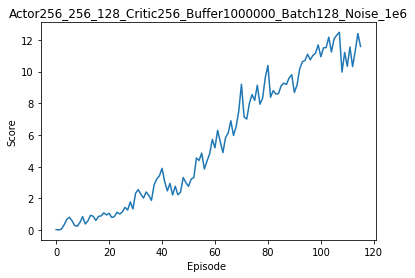

Episode [116/1000]	Average scores: 11.59


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


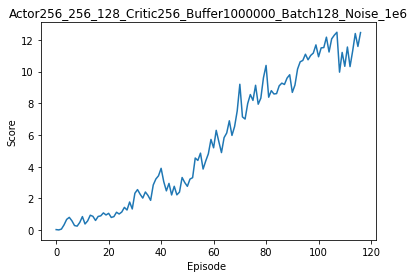

Episode [117/1000]	Average scores: 12.47


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


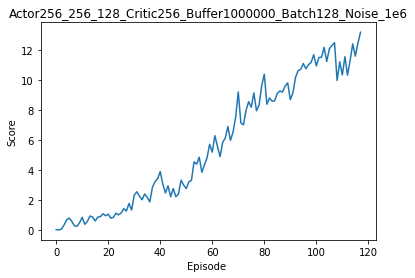

Episode [118/1000]	Average scores: 13.18


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


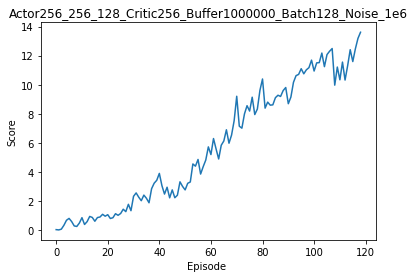

Episode [119/1000]	Average scores: 13.61


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


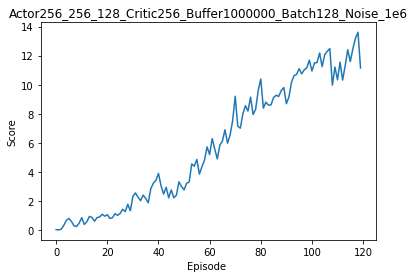

Episode [120/1000]	Average scores: 11.15


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


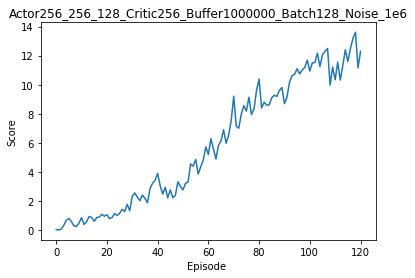

Episode [121/1000]	Average scores: 12.29


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


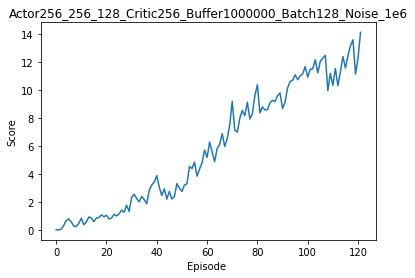

Episode [122/1000]	Average scores: 14.14


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


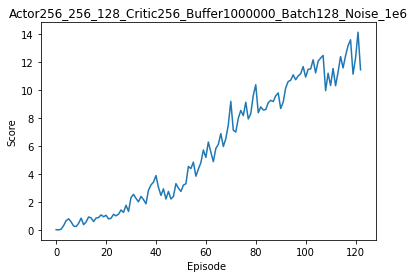

Episode [123/1000]	Average scores: 11.46


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


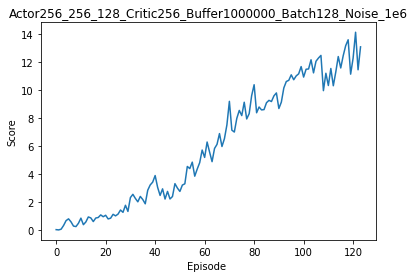

Episode [124/1000]	Average scores: 13.10


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


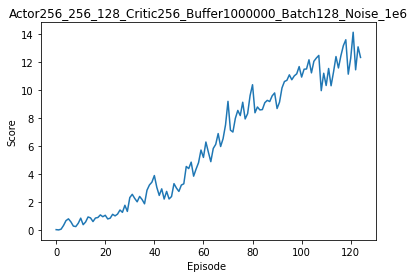

Episode [125/1000]	Average scores: 12.34


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


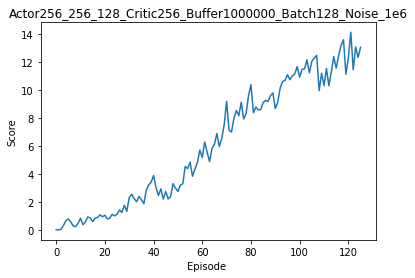

Episode [126/1000]	Average scores: 13.06


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


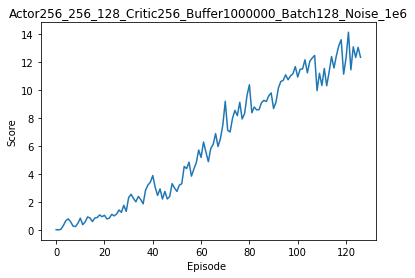

Episode [127/1000]	Average scores: 12.35


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


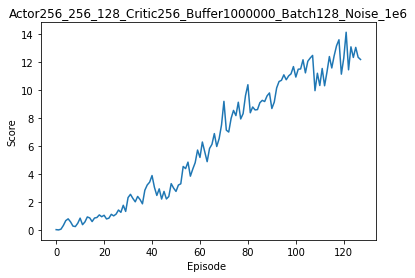

Episode [128/1000]	Average scores: 12.20


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


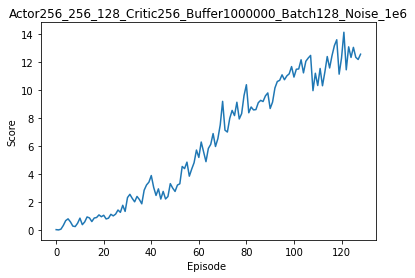

Episode [129/1000]	Average scores: 12.57


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


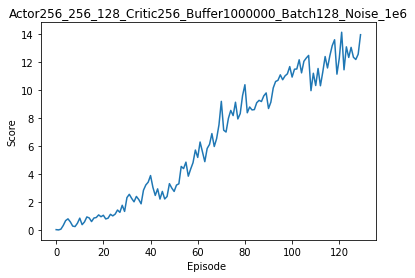

Episode [130/1000]	Average scores: 13.97


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


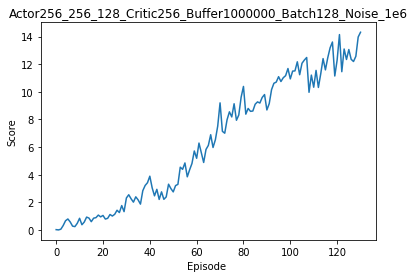

Episode [131/1000]	Average scores: 14.31


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


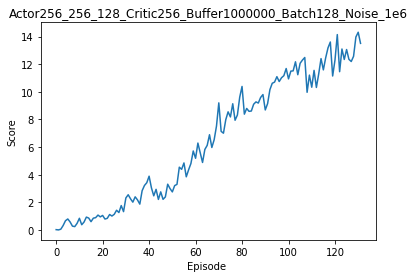

Episode [132/1000]	Average scores: 13.51


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


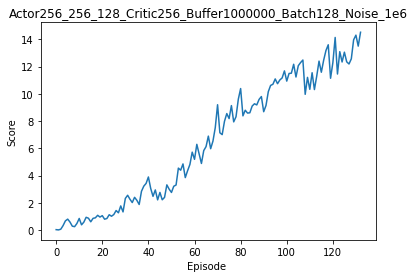

Episode [133/1000]	Average scores: 14.53


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


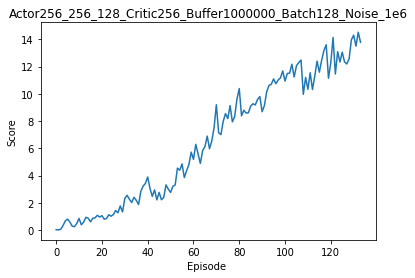

Episode [134/1000]	Average scores: 13.79


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


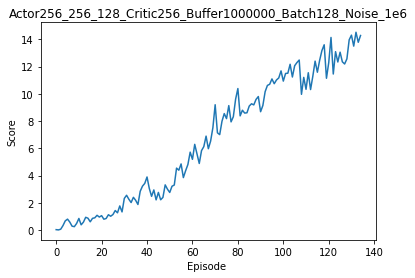

Episode [135/1000]	Average scores: 14.29


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


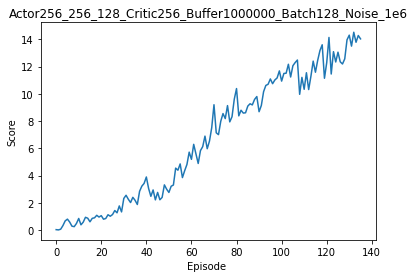

Episode [136/1000]	Average scores: 14.04


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


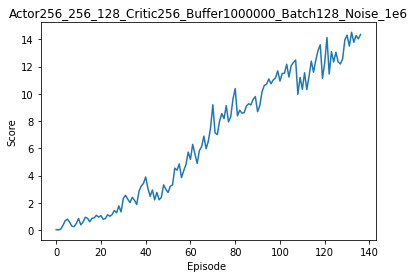

Episode [137/1000]	Average scores: 14.36


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


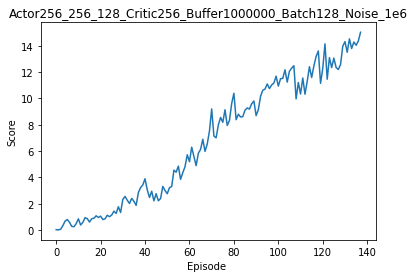

Episode [138/1000]	Average scores: 15.03


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


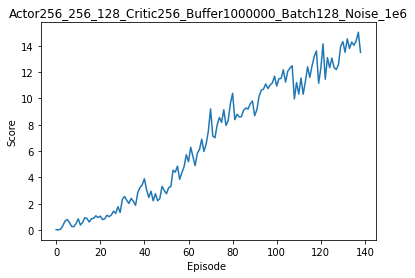

Episode [139/1000]	Average scores: 13.50


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


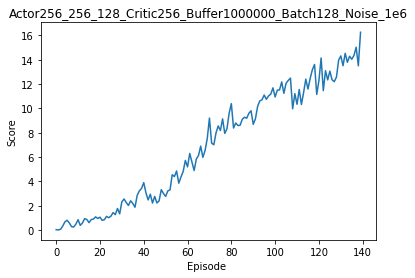

Episode [140/1000]	Average scores: 16.26


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


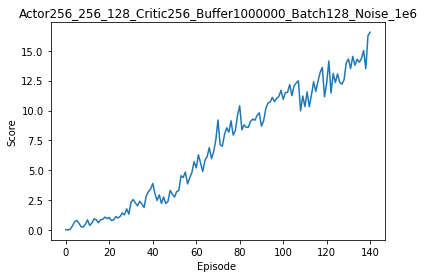

Episode [141/1000]	Average scores: 16.55


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


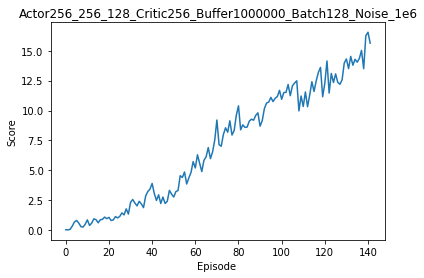

Episode [142/1000]	Average scores: 15.64


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


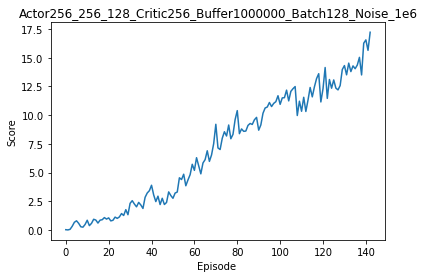

Episode [143/1000]	Average scores: 17.22


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


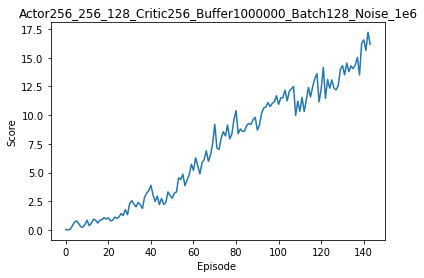

Episode [144/1000]	Average scores: 16.16


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


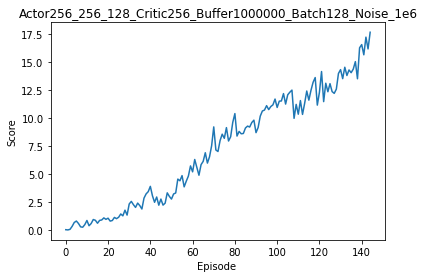

Episode [145/1000]	Average scores: 17.65


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


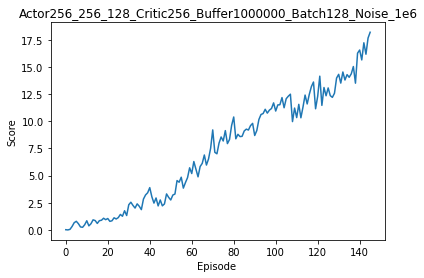

Episode [146/1000]	Average scores: 18.18


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


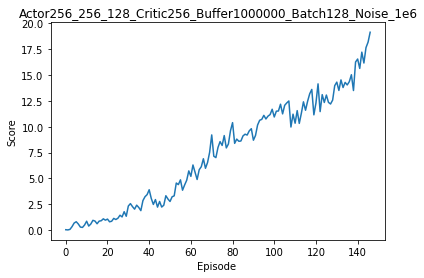

Episode [147/1000]	Average scores: 19.14


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


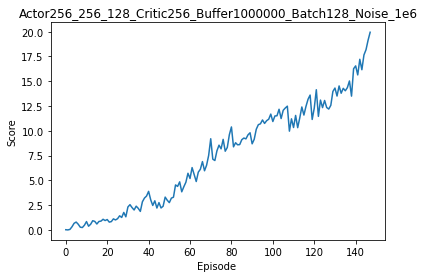

Episode [148/1000]	Average scores: 19.94


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


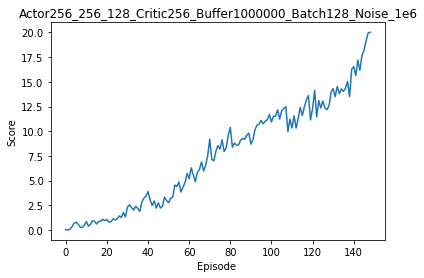

Episode [149/1000]	Average scores: 20.02


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


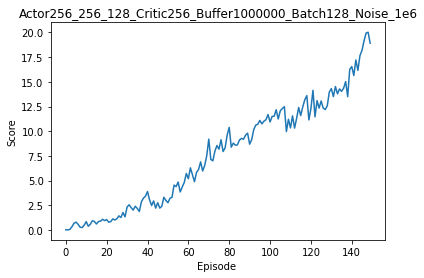

Episode [150/1000]	Average scores: 18.91


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


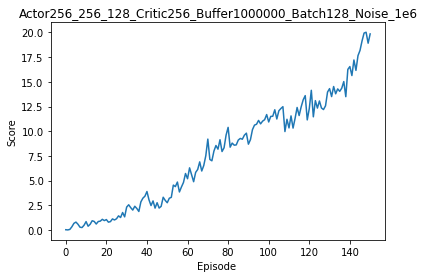

Episode [151/1000]	Average scores: 19.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


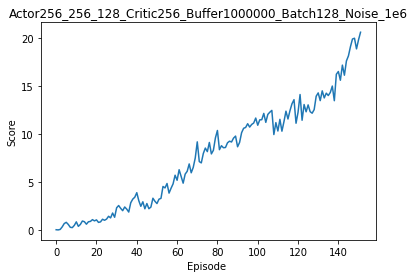

Episode [152/1000]	Average scores: 20.65


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


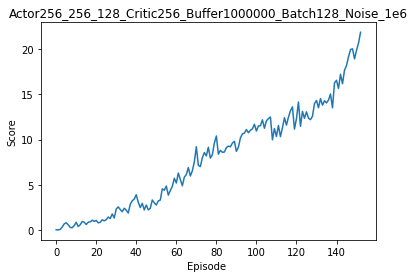

Episode [153/1000]	Average scores: 21.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


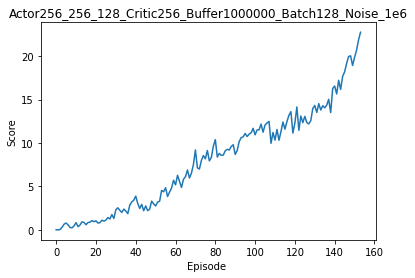

Episode [154/1000]	Average scores: 22.74


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


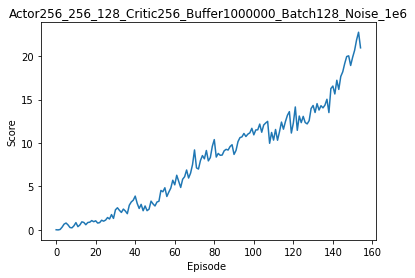

Episode [155/1000]	Average scores: 20.94


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


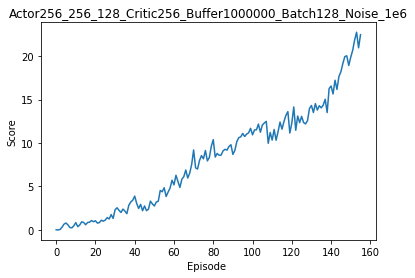

Episode [156/1000]	Average scores: 22.46


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


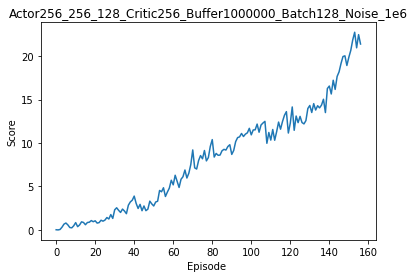

Episode [157/1000]	Average scores: 21.38


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


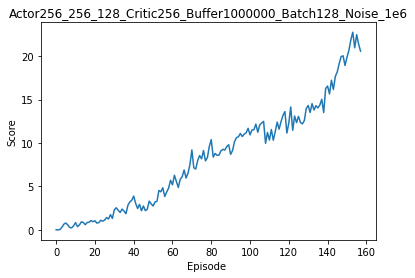

Episode [158/1000]	Average scores: 20.56


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


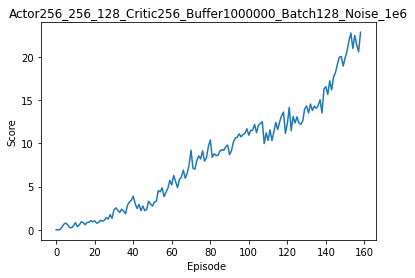

Episode [159/1000]	Average scores: 22.82


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


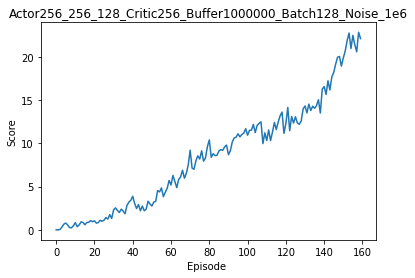

Episode [160/1000]	Average scores: 22.09


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


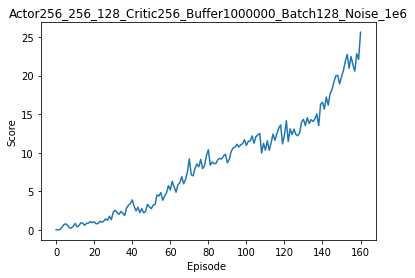

Episode [161/1000]	Average scores: 25.60


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


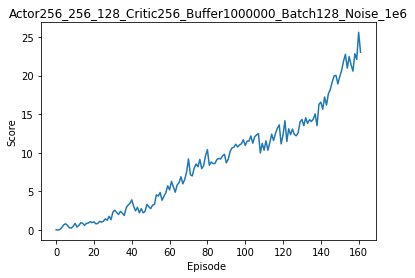

Episode [162/1000]	Average scores: 23.01


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


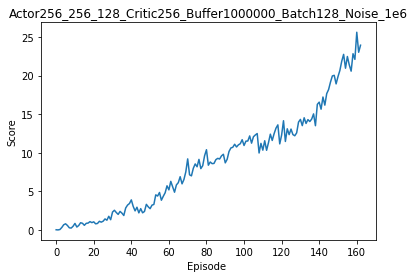

Episode [163/1000]	Average scores: 23.92


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


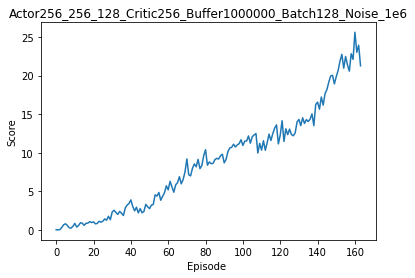

Episode [164/1000]	Average scores: 21.26


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


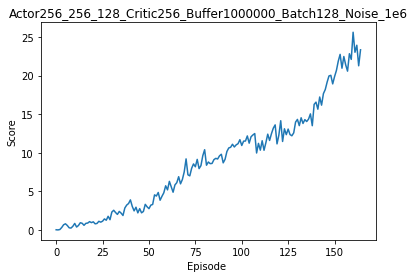

Episode [165/1000]	Average scores: 23.33


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


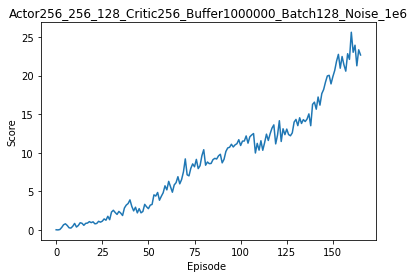

Episode [166/1000]	Average scores: 22.66


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


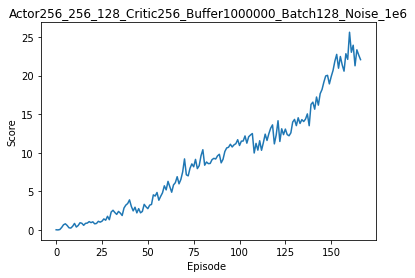

Episode [167/1000]	Average scores: 22.06


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


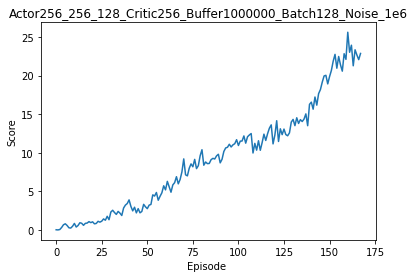

Episode [168/1000]	Average scores: 22.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


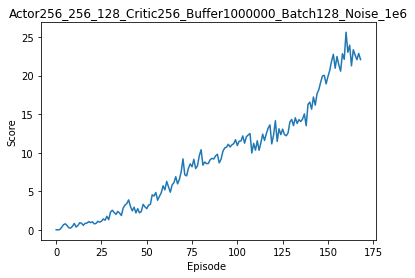

Episode [169/1000]	Average scores: 22.06


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


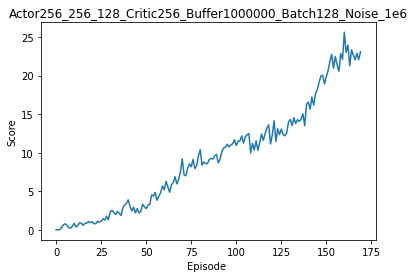

Episode [170/1000]	Average scores: 23.08


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


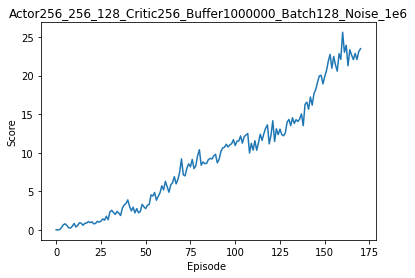

Episode [171/1000]	Average scores: 23.47


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


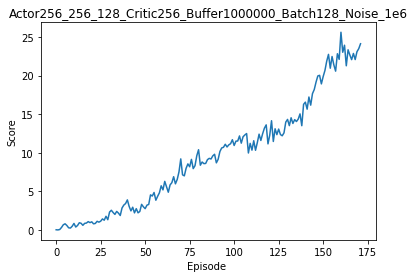

Episode [172/1000]	Average scores: 24.11


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


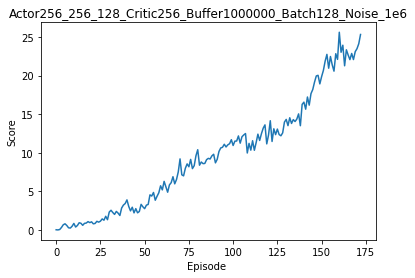

Episode [173/1000]	Average scores: 25.31


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


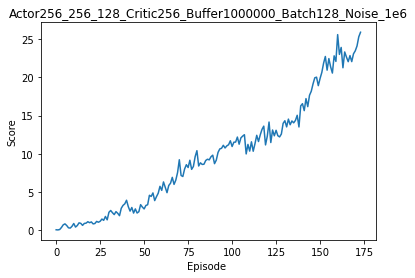

Episode [174/1000]	Average scores: 25.91


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


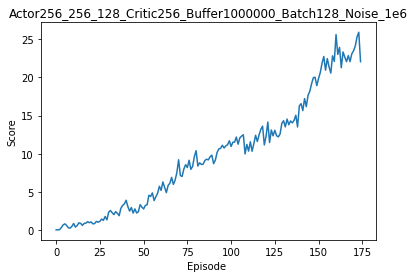

Episode [175/1000]	Average scores: 22.06


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


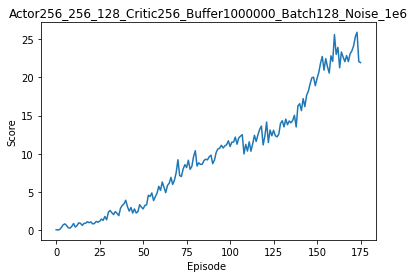

Episode [176/1000]	Average scores: 21.94


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


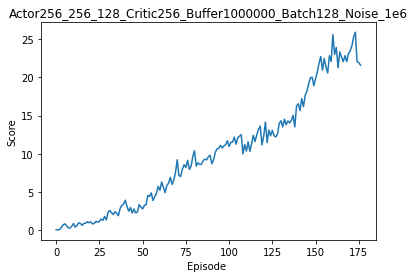

Episode [177/1000]	Average scores: 21.58


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


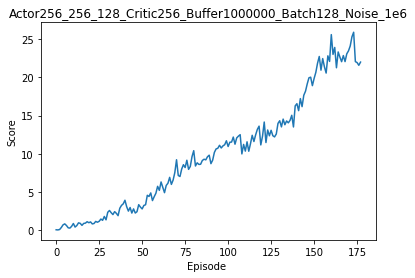

Episode [178/1000]	Average scores: 22.00


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


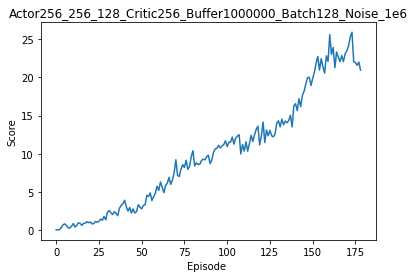

Episode [179/1000]	Average scores: 20.95


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


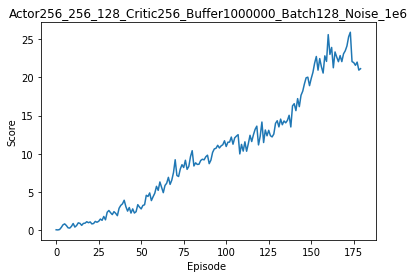

Episode [180/1000]	Average scores: 21.13


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


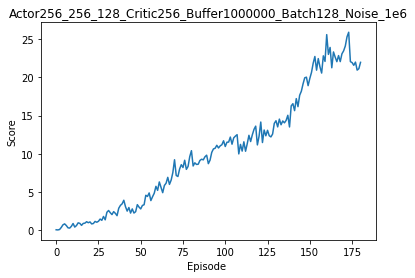

Episode [181/1000]	Average scores: 21.97


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


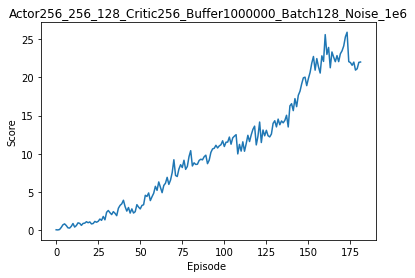

Episode [182/1000]	Average scores: 22.01


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


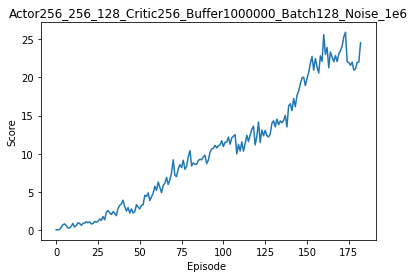

Episode [183/1000]	Average scores: 24.55


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


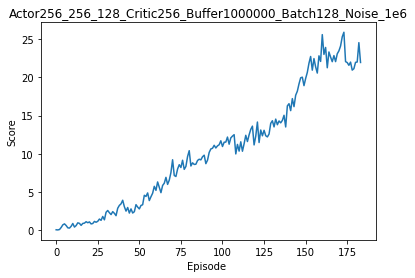

Episode [184/1000]	Average scores: 21.95


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


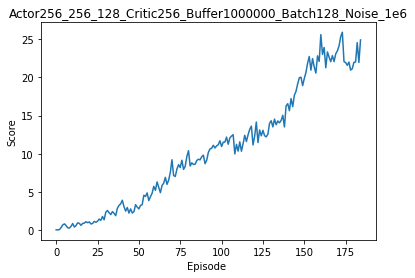

Episode [185/1000]	Average scores: 24.91


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


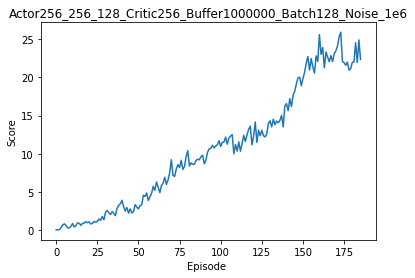

Episode [186/1000]	Average scores: 22.34


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


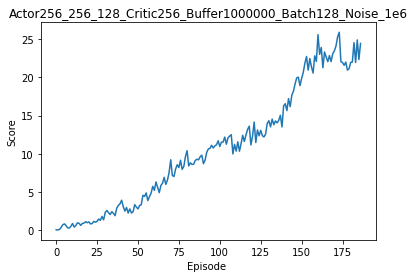

Episode [187/1000]	Average scores: 24.44


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


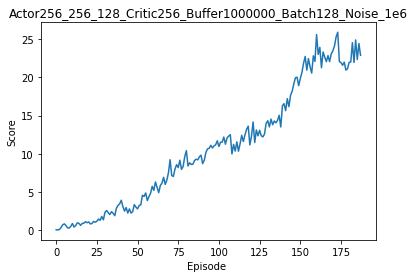

Episode [188/1000]	Average scores: 22.89


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


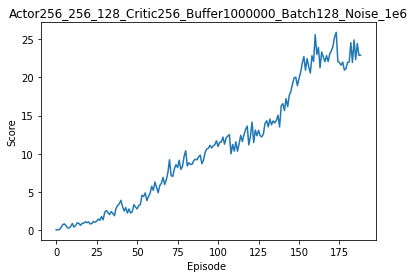

Episode [189/1000]	Average scores: 22.92


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


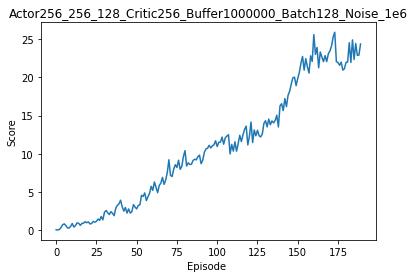

Episode [190/1000]	Average scores: 24.38


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


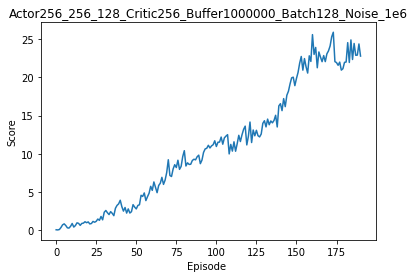

Episode [191/1000]	Average scores: 22.79


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


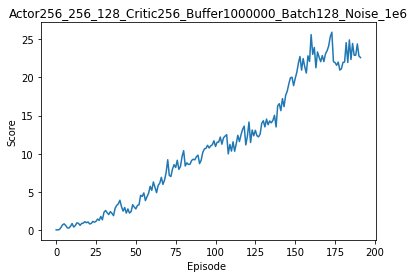

Episode [192/1000]	Average scores: 22.59


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


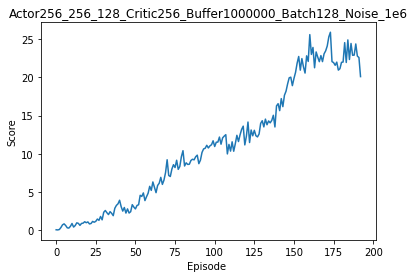

Episode [193/1000]	Average scores: 20.10


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


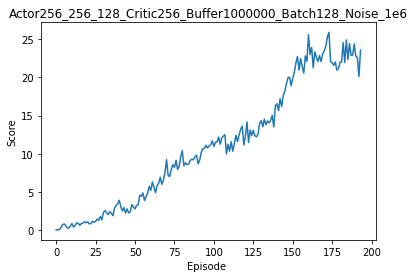

Episode [194/1000]	Average scores: 23.57


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


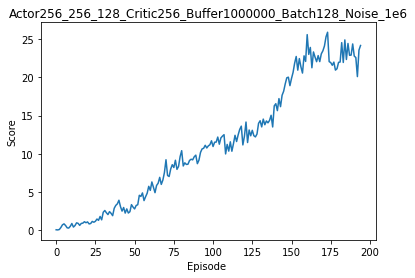

Episode [195/1000]	Average scores: 24.18


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


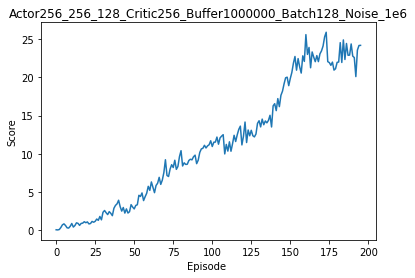

Episode [196/1000]	Average scores: 24.19


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


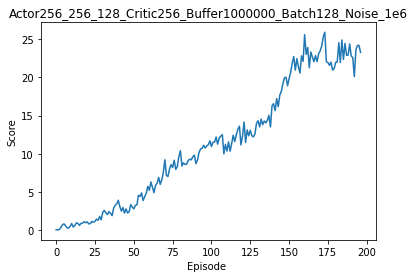

Episode [197/1000]	Average scores: 23.28


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


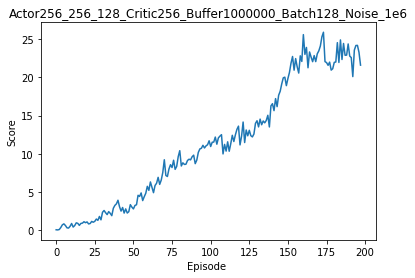

Episode [198/1000]	Average scores: 21.60


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


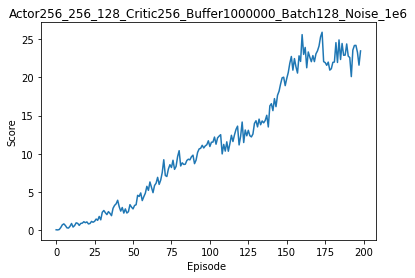

Episode [199/1000]	Average scores: 23.47


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


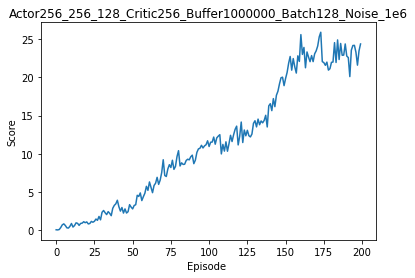

Episode [200/1000]	Average scores: 24.38


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


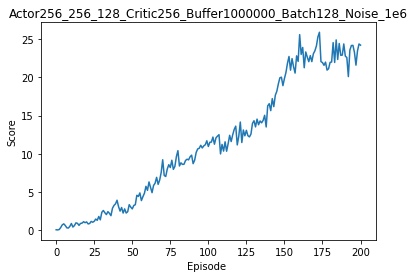

Episode [201/1000]	Average scores: 24.22


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


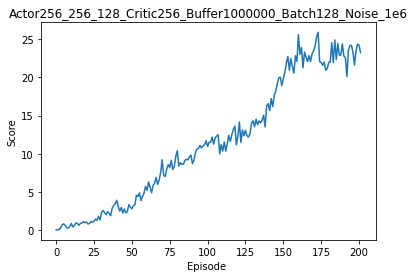

Episode [202/1000]	Average scores: 23.26


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


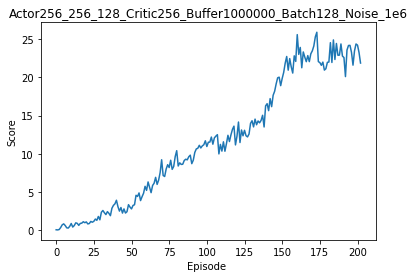

Episode [203/1000]	Average scores: 21.88


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


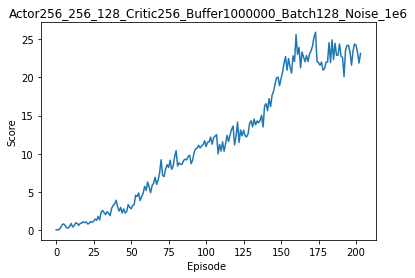

Episode [204/1000]	Average scores: 23.13


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


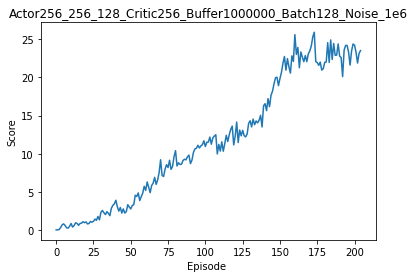

Episode [205/1000]	Average scores: 23.51


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


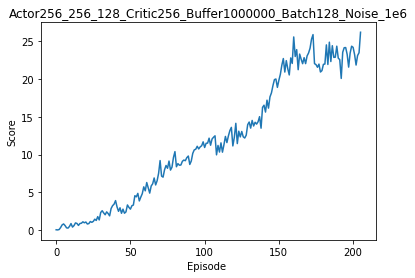

Episode [206/1000]	Average scores: 26.23


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


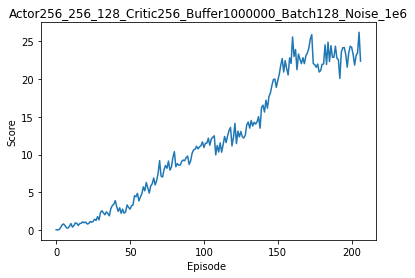

Episode [207/1000]	Average scores: 22.40


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


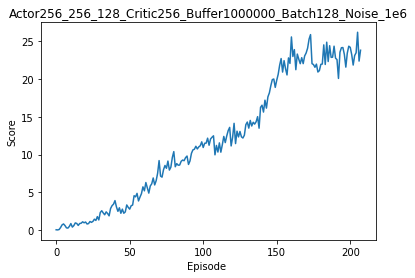

Episode [208/1000]	Average scores: 23.84


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


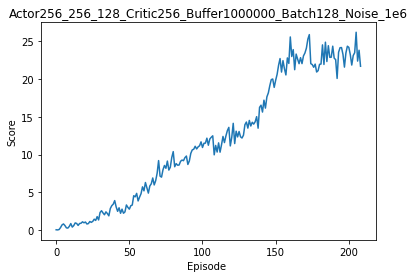

Episode [209/1000]	Average scores: 21.72


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


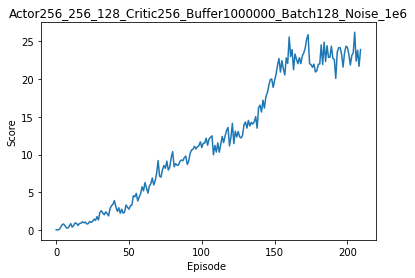

Episode [210/1000]	Average scores: 23.92


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


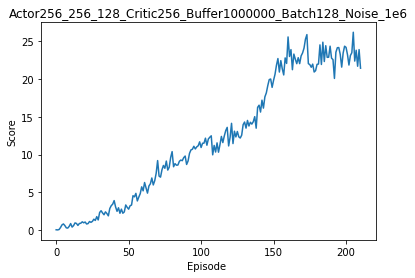

Episode [211/1000]	Average scores: 21.46


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


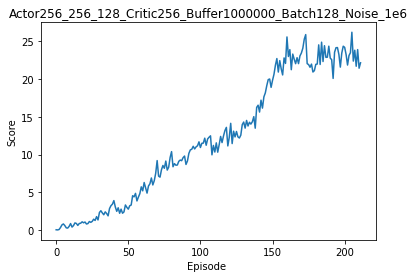

Episode [212/1000]	Average scores: 22.17


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


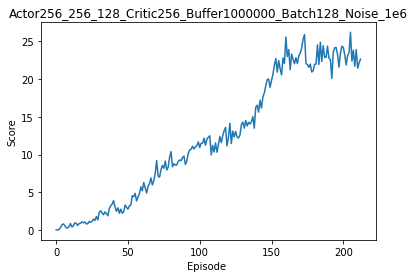

Episode [213/1000]	Average scores: 22.66


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


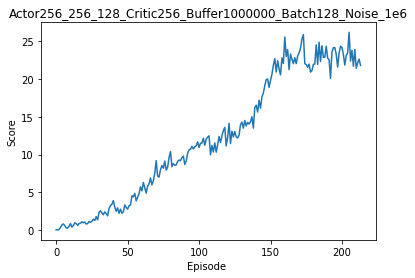

Episode [214/1000]	Average scores: 21.83


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


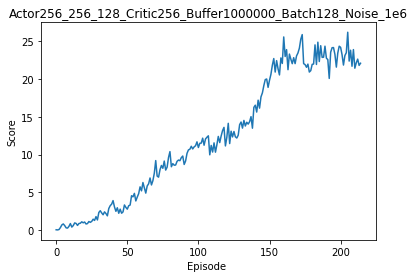

Episode [215/1000]	Average scores: 22.11


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


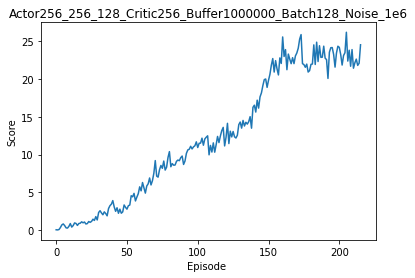

Episode [216/1000]	Average scores: 24.56


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


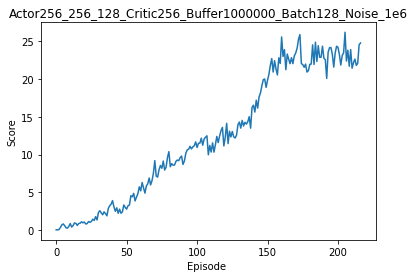

Episode [217/1000]	Average scores: 24.80


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


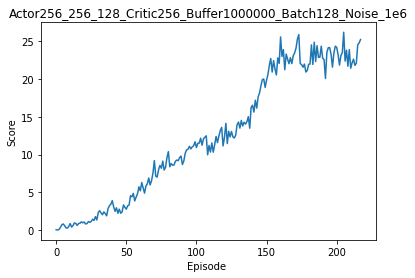

Episode [218/1000]	Average scores: 25.26


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


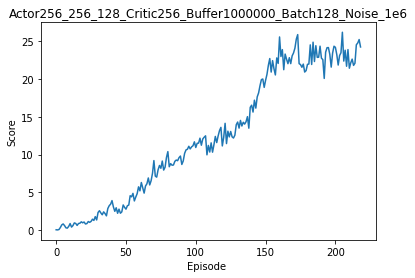

Episode [219/1000]	Average scores: 24.27


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


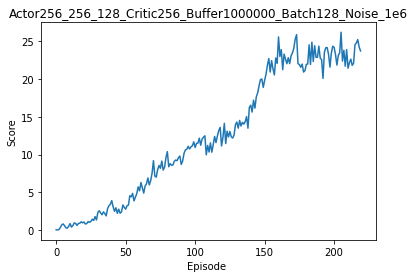

Episode [220/1000]	Average scores: 23.75


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


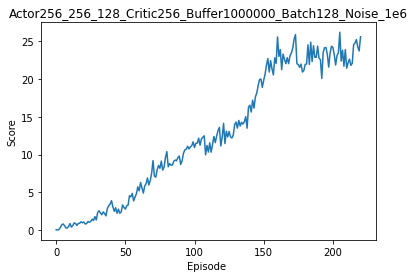

Episode [221/1000]	Average scores: 25.63


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


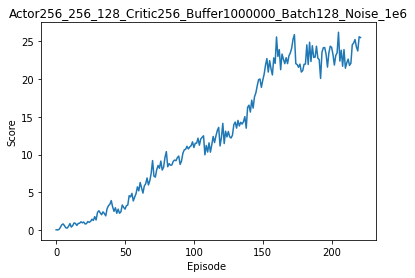

Episode [222/1000]	Average scores: 25.52


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


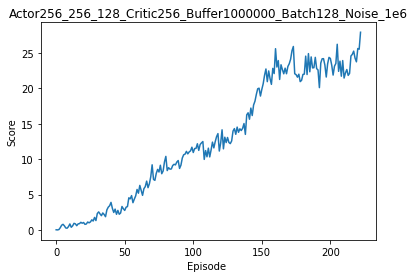

Episode [223/1000]	Average scores: 27.92


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


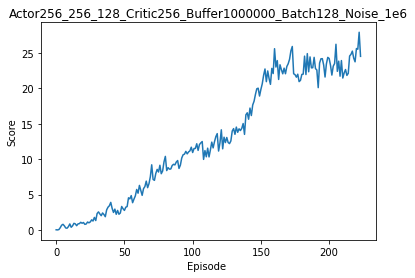

Episode [224/1000]	Average scores: 24.52


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


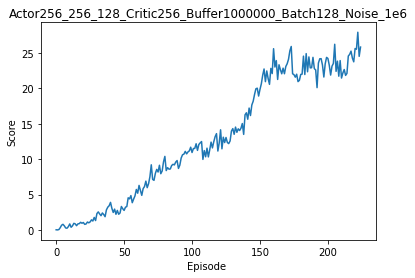

Episode [225/1000]	Average scores: 25.83


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


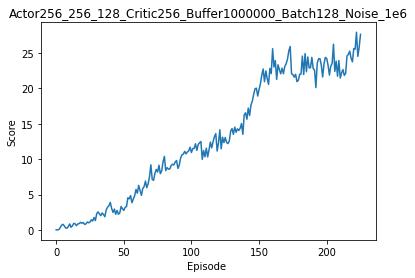

Episode [226/1000]	Average scores: 27.63


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


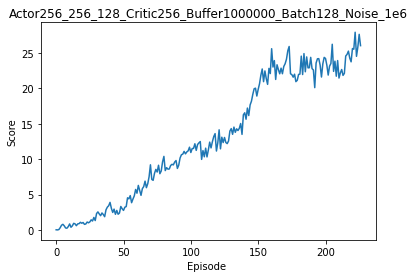

Episode [227/1000]	Average scores: 26.03


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


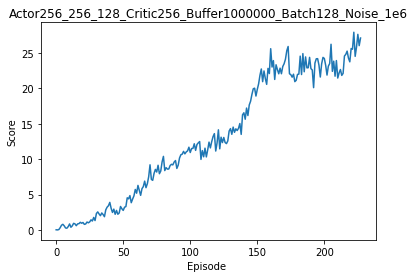

Episode [228/1000]	Average scores: 27.11


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


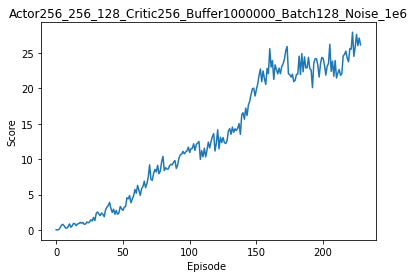

Episode [229/1000]	Average scores: 26.13


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


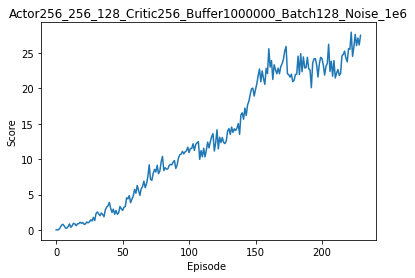

Episode [230/1000]	Average scores: 27.49


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


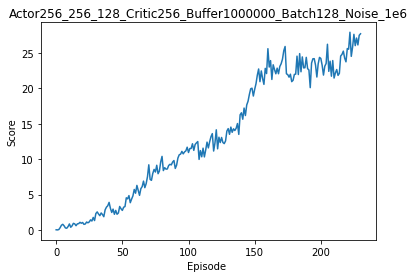

Episode [231/1000]	Average scores: 27.71


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


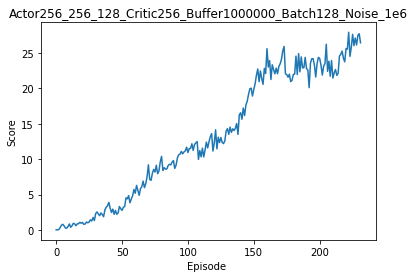

Episode [232/1000]	Average scores: 26.44


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


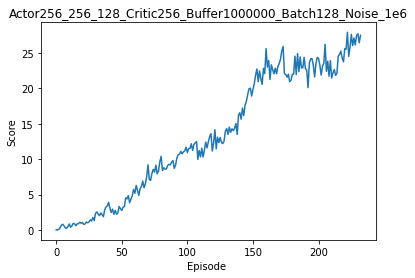

Episode [233/1000]	Average scores: 27.50


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


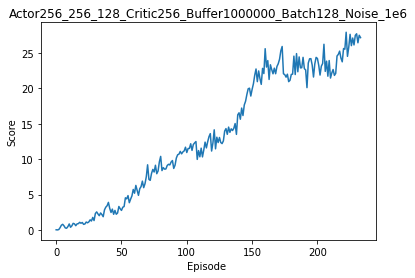

Episode [234/1000]	Average scores: 27.16


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


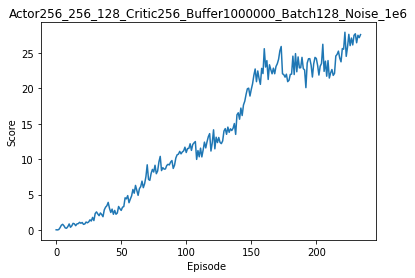

Episode [235/1000]	Average scores: 27.59


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


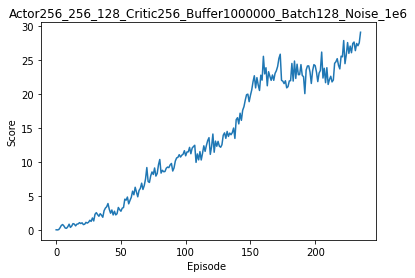

Episode [236/1000]	Average scores: 29.15


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


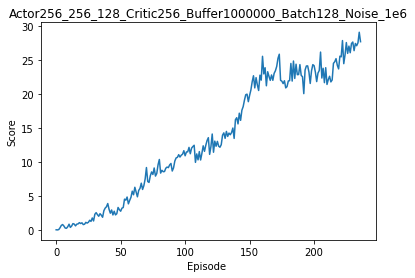

Episode [237/1000]	Average scores: 27.76


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


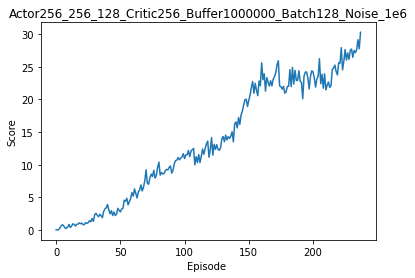

Episode [238/1000]	Average scores: 30.28


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


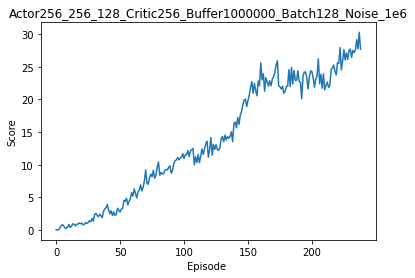

Episode [239/1000]	Average scores: 27.68


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


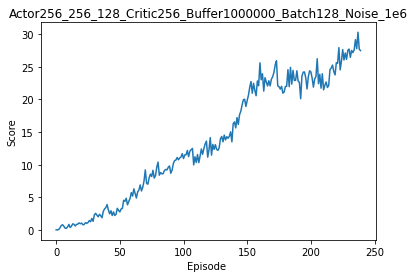

Episode [240/1000]	Average scores: 27.47


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


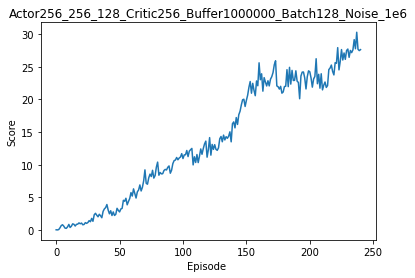

Episode [241/1000]	Average scores: 27.62


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


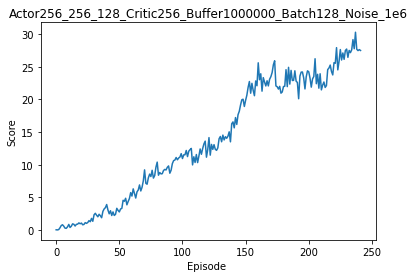

Episode [242/1000]	Average scores: 27.49


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


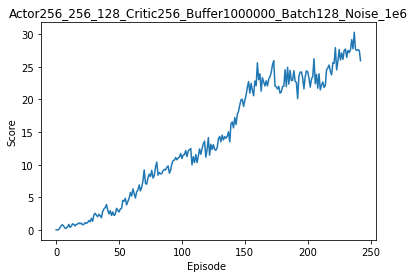

Episode [243/1000]	Average scores: 25.92


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


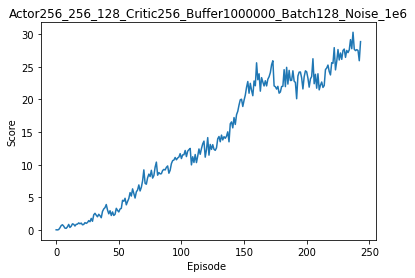

Episode [244/1000]	Average scores: 28.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


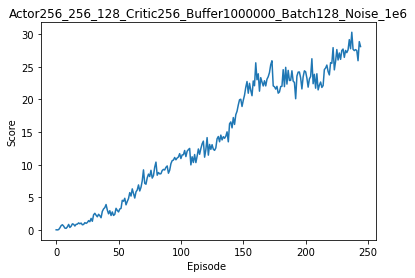

Episode [245/1000]	Average scores: 28.09


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


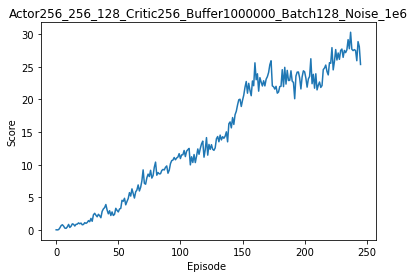

Episode [246/1000]	Average scores: 25.35


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


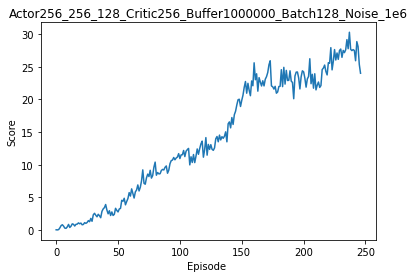

Episode [247/1000]	Average scores: 24.01


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


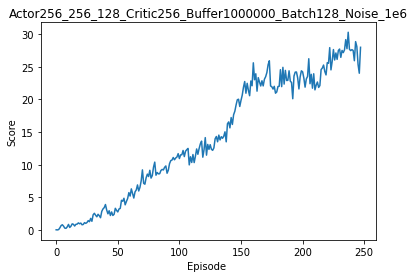

Episode [248/1000]	Average scores: 27.98


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


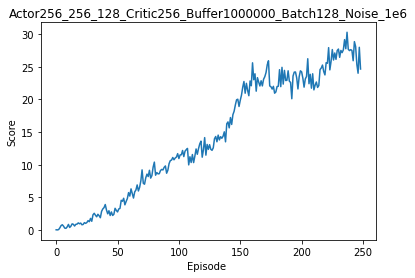

Episode [249/1000]	Average scores: 24.65


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


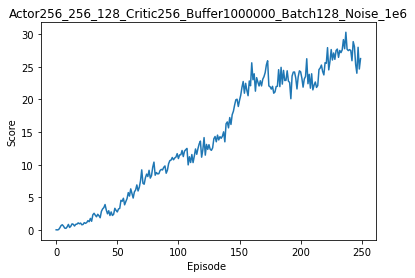

Episode [250/1000]	Average scores: 26.24


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


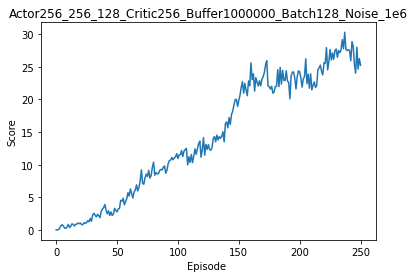

Episode [251/1000]	Average scores: 25.22


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


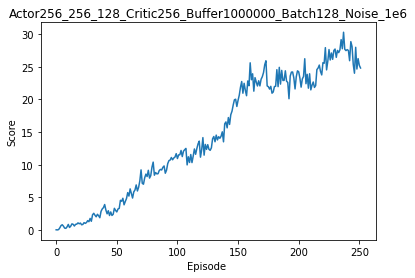

Episode [252/1000]	Average scores: 24.81


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


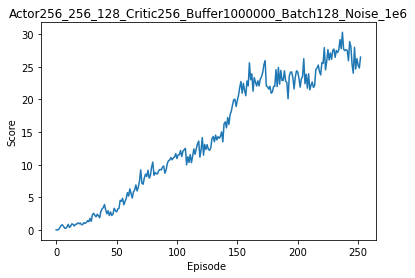

Episode [253/1000]	Average scores: 26.48


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


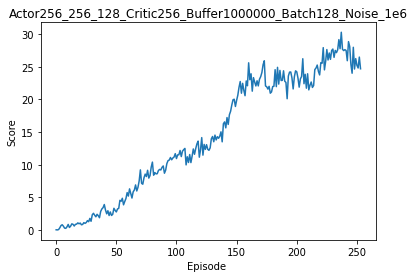

Episode [254/1000]	Average scores: 24.69


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


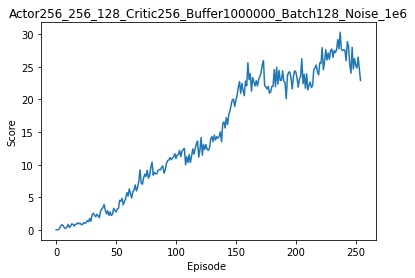

Episode [255/1000]	Average scores: 22.89


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


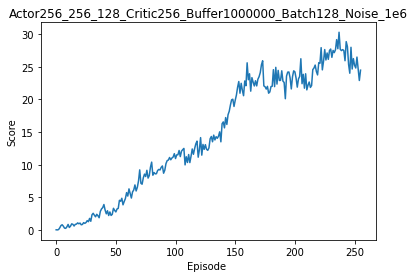

Episode [256/1000]	Average scores: 24.48


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


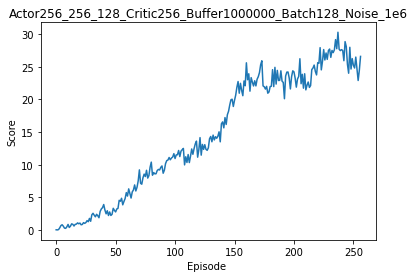

Episode [257/1000]	Average scores: 26.58


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


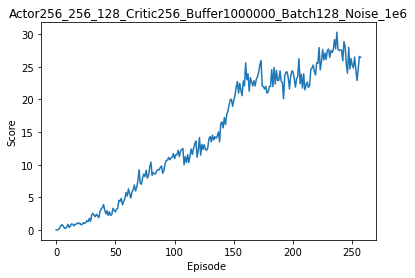

Episode [258/1000]	Average scores: 26.45


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


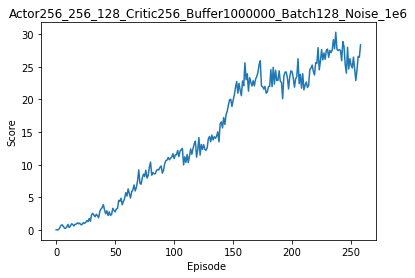

Episode [259/1000]	Average scores: 28.36


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


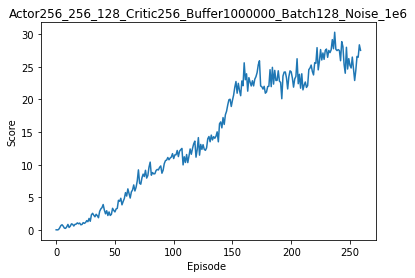

Episode [260/1000]	Average scores: 27.51


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


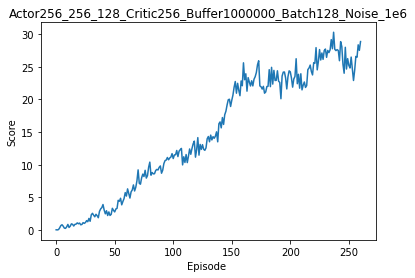

Episode [261/1000]	Average scores: 28.86


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


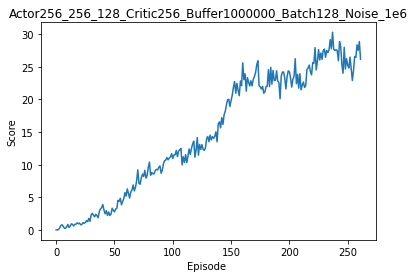

Episode [262/1000]	Average scores: 26.15


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


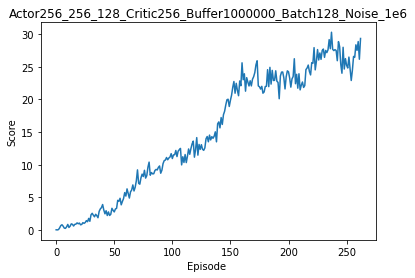

Episode [263/1000]	Average scores: 29.33


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


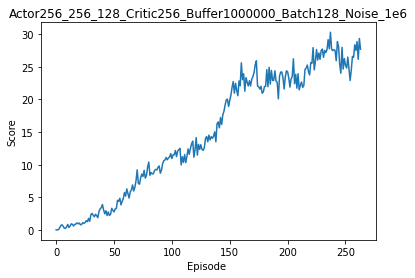

Episode [264/1000]	Average scores: 27.68


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


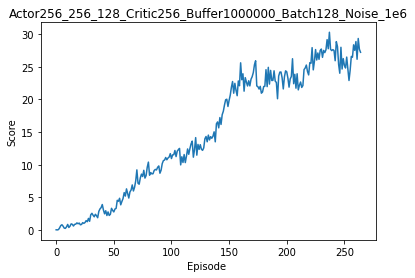

Episode [265/1000]	Average scores: 27.22


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


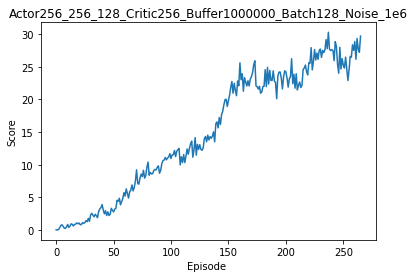

Episode [266/1000]	Average scores: 29.70


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


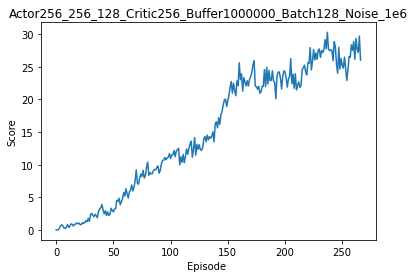

Episode [267/1000]	Average scores: 26.01


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


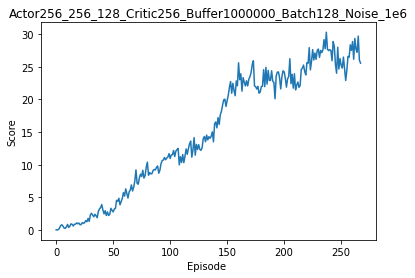

Episode [268/1000]	Average scores: 25.55


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


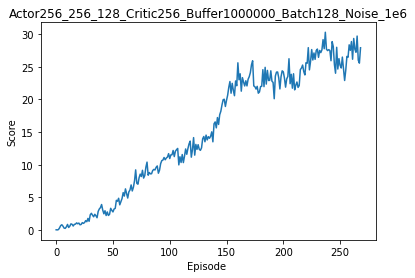

Episode [269/1000]	Average scores: 27.91


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


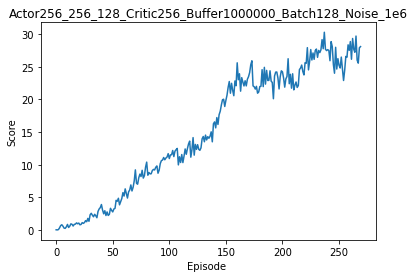

Episode [270/1000]	Average scores: 28.08


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


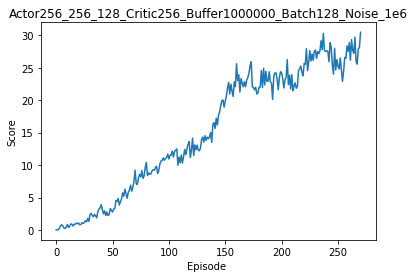

Episode [271/1000]	Average scores: 30.46


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


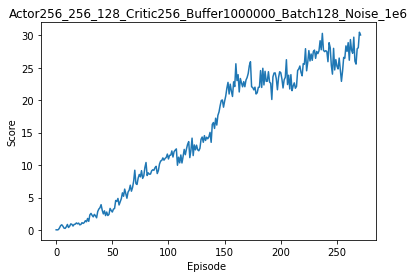

Episode [272/1000]	Average scores: 30.04


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


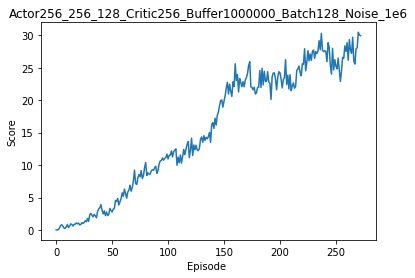

Episode [273/1000]	Average scores: 29.93


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


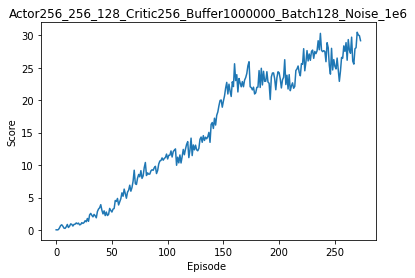

Episode [274/1000]	Average scores: 29.16


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


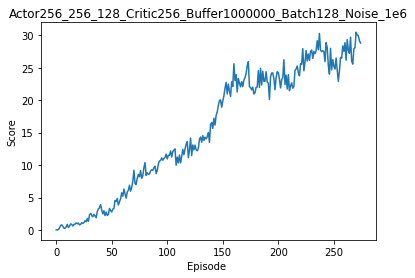

Episode [275/1000]	Average scores: 28.80


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


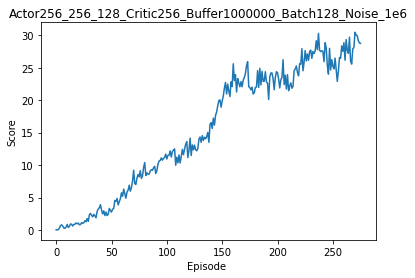

Episode [276/1000]	Average scores: 28.74


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


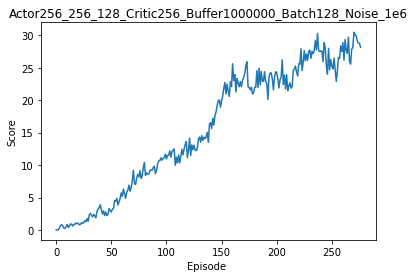

Episode [277/1000]	Average scores: 28.15


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


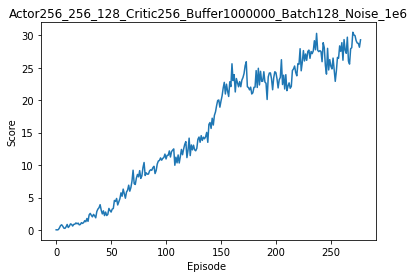

Episode [278/1000]	Average scores: 29.29


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


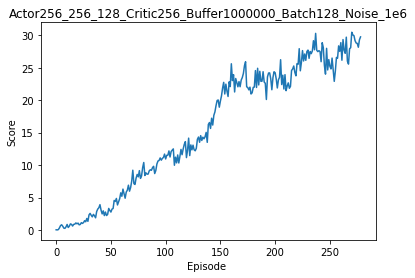

Episode [279/1000]	Average scores: 29.74


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


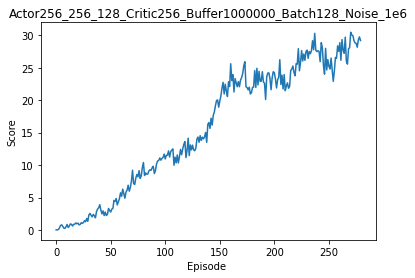

Episode [280/1000]	Average scores: 29.18


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


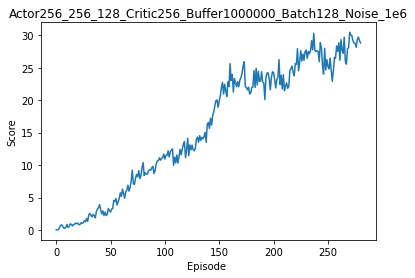

Episode [281/1000]	Average scores: 28.81


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


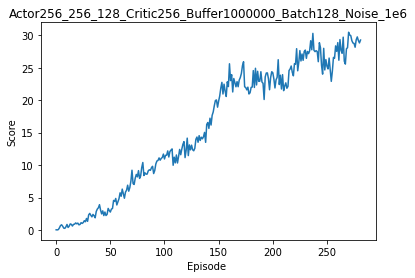

Episode [282/1000]	Average scores: 29.25


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


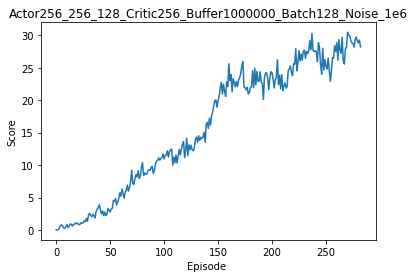

Episode [283/1000]	Average scores: 28.21


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


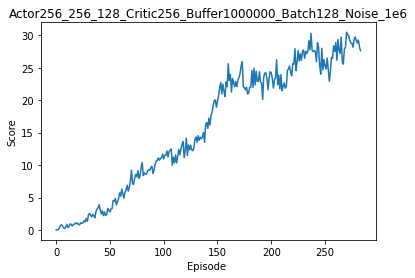

Episode [284/1000]	Average scores: 27.63


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


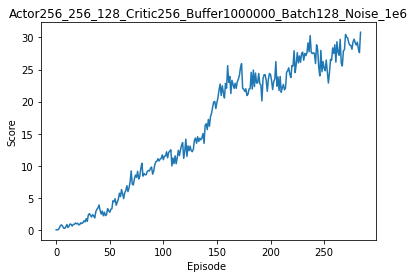

Episode [285/1000]	Average scores: 30.81


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


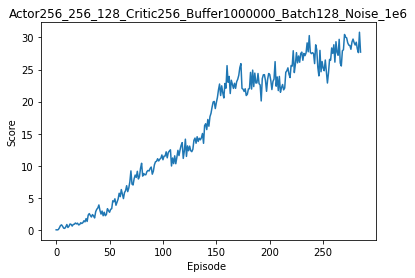

Episode [286/1000]	Average scores: 27.71


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


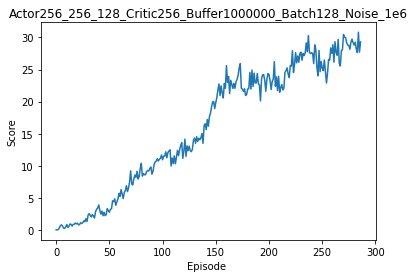

Episode [287/1000]	Average scores: 29.30


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


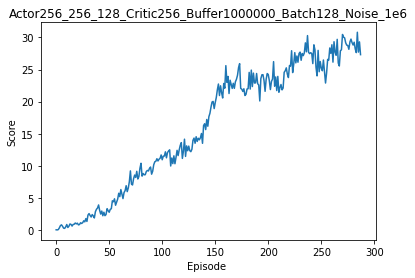

Episode [288/1000]	Average scores: 27.31


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


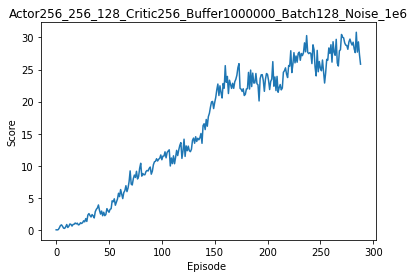

Episode [289/1000]	Average scores: 25.83


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


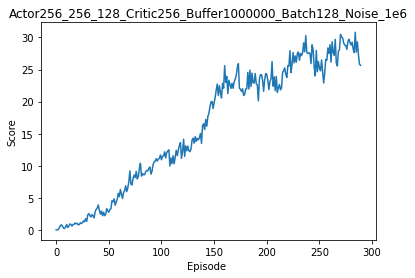

Episode [290/1000]	Average scores: 25.66


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


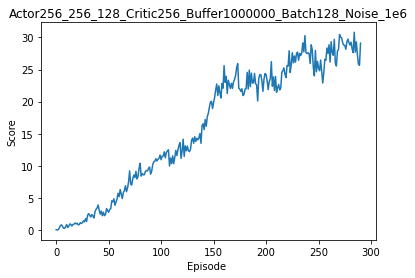

Episode [291/1000]	Average scores: 29.11


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


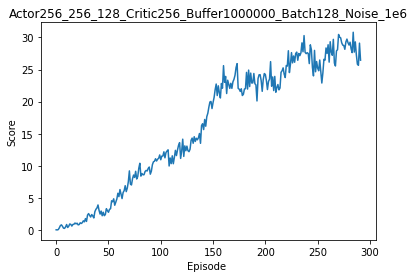

Episode [292/1000]	Average scores: 26.45


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


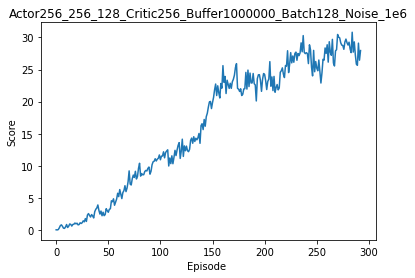

Episode [293/1000]	Average scores: 27.95


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


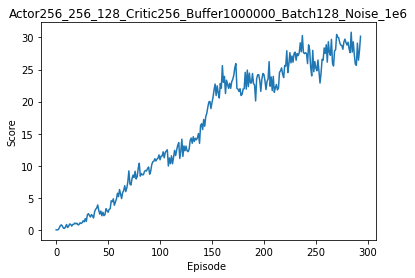

Episode [294/1000]	Average scores: 30.18


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


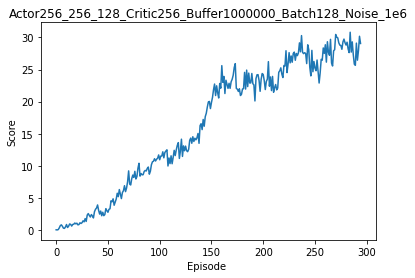

Episode [295/1000]	Average scores: 29.06


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


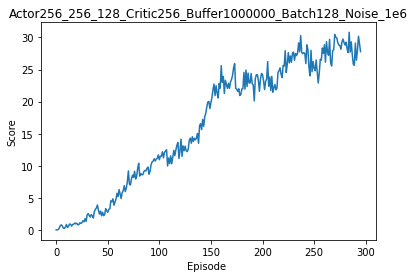

Episode [296/1000]	Average scores: 27.77


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


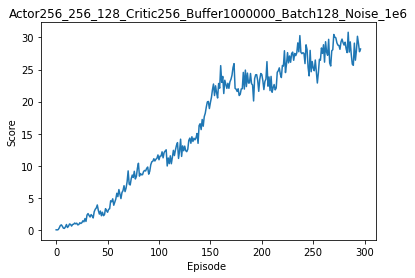

Episode [297/1000]	Average scores: 28.19


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


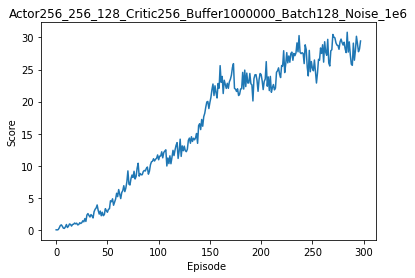

Episode [298/1000]	Average scores: 29.44


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


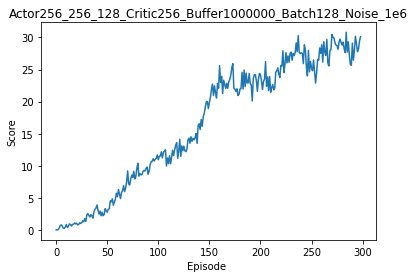

Episode [299/1000]	Average scores: 30.11


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


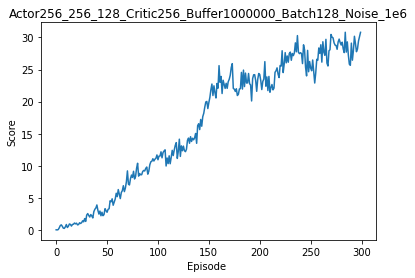

Episode [300/1000]	Average scores: 30.79


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


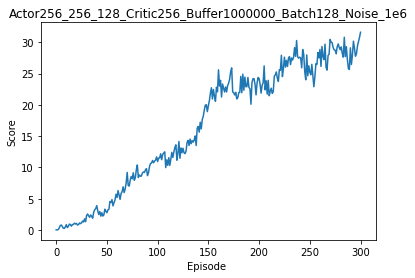

Episode [301/1000]	Average scores: 31.61


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


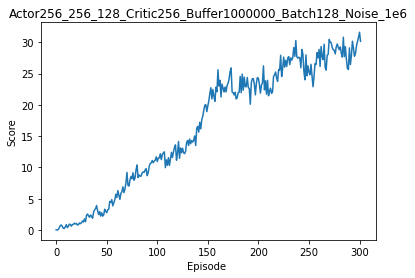

Episode [302/1000]	Average scores: 30.15


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


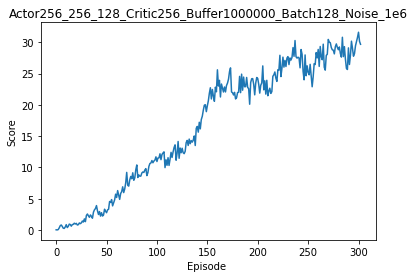

Episode [303/1000]	Average scores: 29.68


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


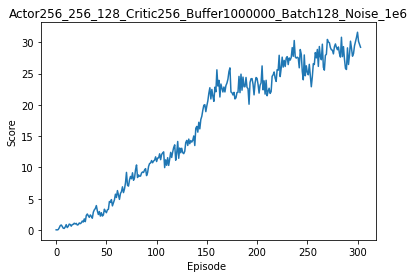

Episode [304/1000]	Average scores: 29.21


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


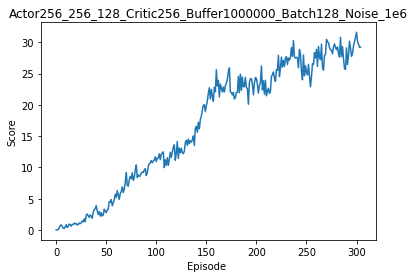

Episode [305/1000]	Average scores: 29.23


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


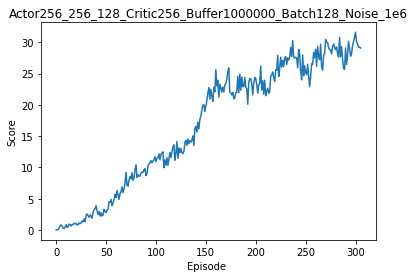

Episode [306/1000]	Average scores: 29.09


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


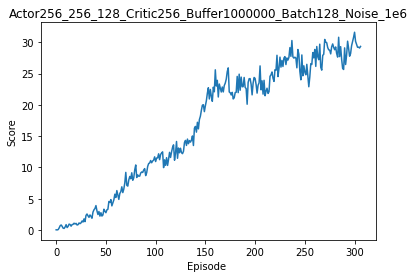

Episode [307/1000]	Average scores: 29.34


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


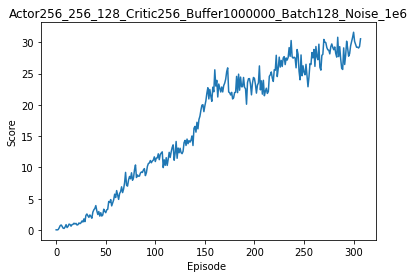

Episode [308/1000]	Average scores: 30.56


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


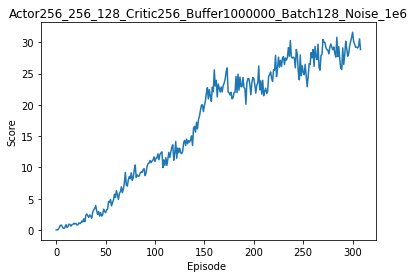

Episode [309/1000]	Average scores: 28.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


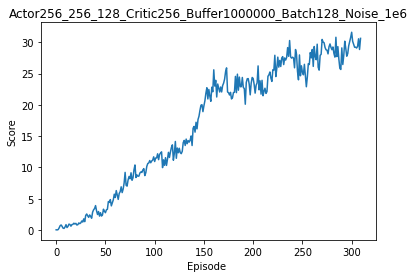

Episode [310/1000]	Average scores: 30.63


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


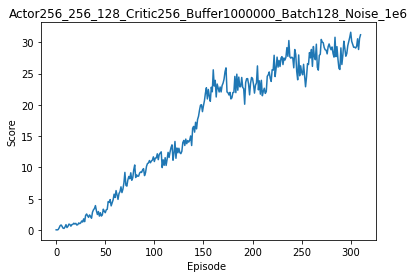

Episode [311/1000]	Average scores: 31.20


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


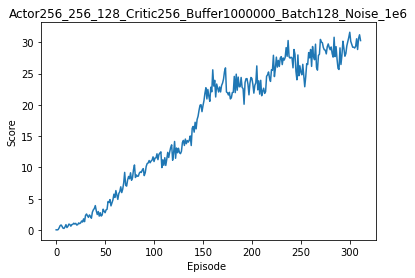

Episode [312/1000]	Average scores: 30.28


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


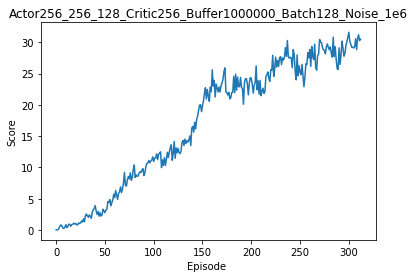

Episode [313/1000]	Average scores: 30.50


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


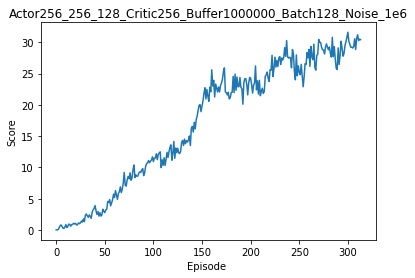

Episode [314/1000]	Average scores: 30.42


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


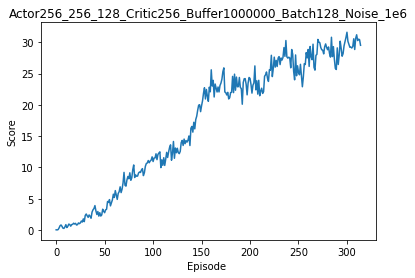

Episode [315/1000]	Average scores: 29.52


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


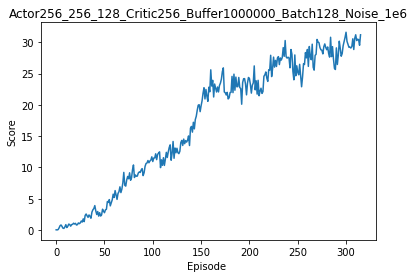

Episode [316/1000]	Average scores: 31.20


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


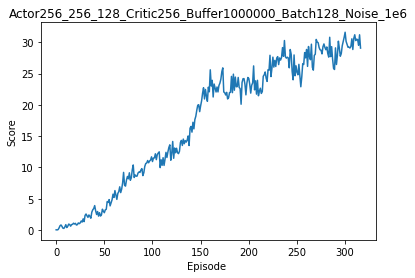

Episode [317/1000]	Average scores: 29.07


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


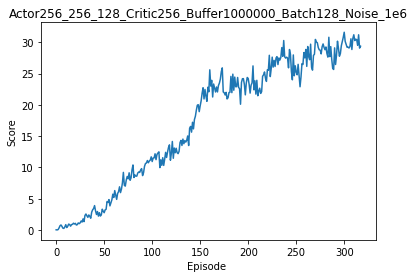

Episode [318/1000]	Average scores: 29.37


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


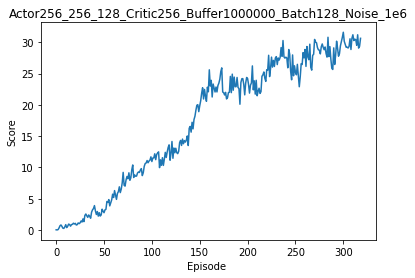

Episode [319/1000]	Average scores: 30.64


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


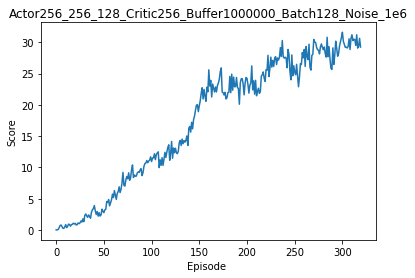

Episode [320/1000]	Average scores: 29.24


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


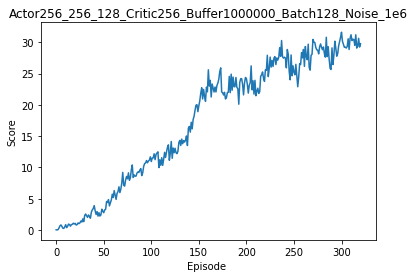

Episode [321/1000]	Average scores: 29.78


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


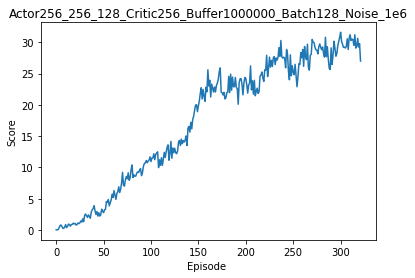

Episode [322/1000]	Average scores: 27.00


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


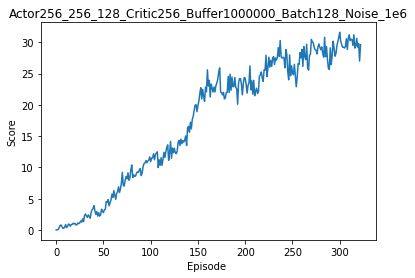

Episode [323/1000]	Average scores: 29.61


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


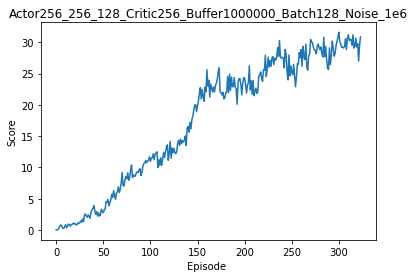

Episode [324/1000]	Average scores: 30.86


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


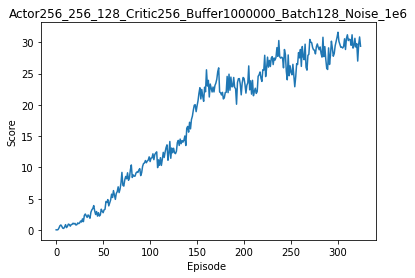

Episode [325/1000]	Average scores: 29.37


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


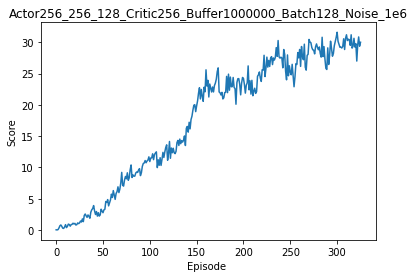

Episode [326/1000]	Average scores: 30.00


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


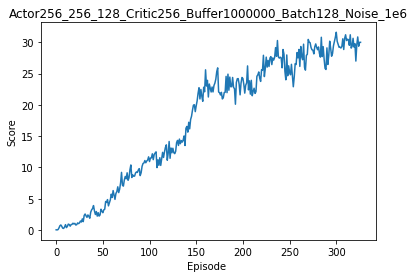

Episode [327/1000]	Average scores: 30.00


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


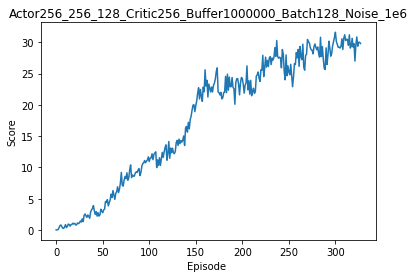

Episode [328/1000]	Average scores: 29.81


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


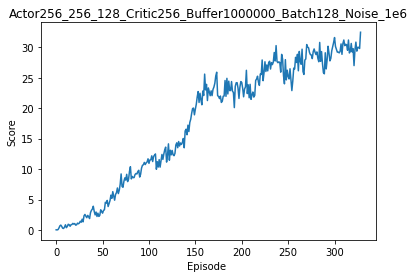

Episode [329/1000]	Average scores: 32.48


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


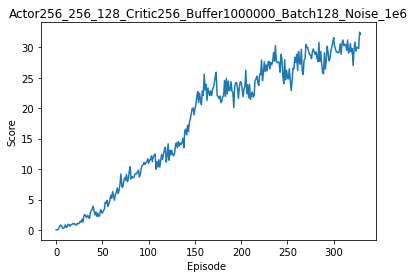

Episode [330/1000]	Average scores: 32.19


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


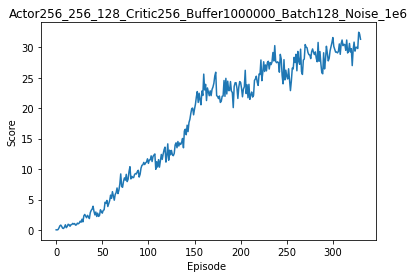

Episode [331/1000]	Average scores: 31.33


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


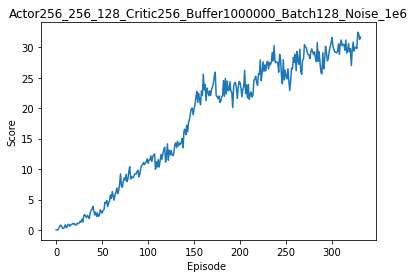

Episode [332/1000]	Average scores: 31.67


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


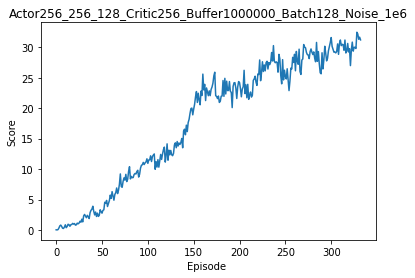

Episode [333/1000]	Average scores: 31.23


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


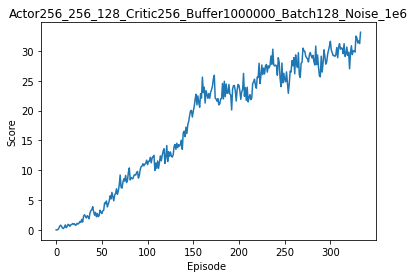

Episode [334/1000]	Average scores: 33.12


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


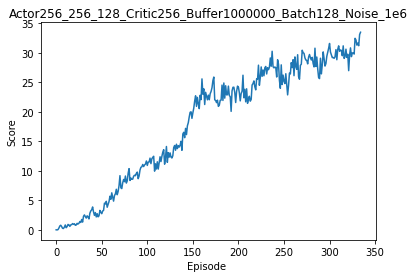

Episode [335/1000]	Average scores: 33.51


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


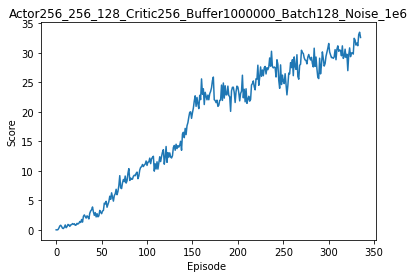

Episode [336/1000]	Average scores: 32.62


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


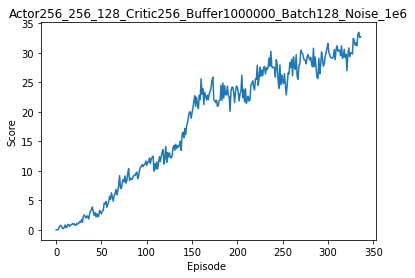

Episode [337/1000]	Average scores: 32.71


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


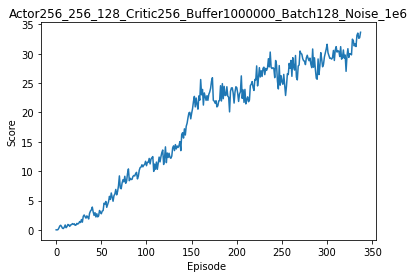

Episode [338/1000]	Average scores: 33.65


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


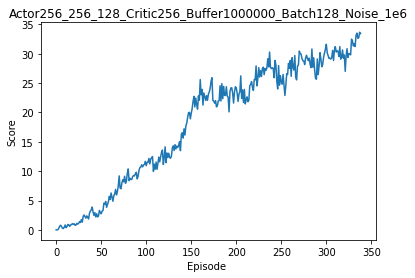

Episode [339/1000]	Average scores: 33.42


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


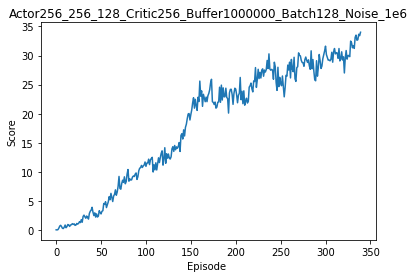

Episode [340/1000]	Average scores: 34.00


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


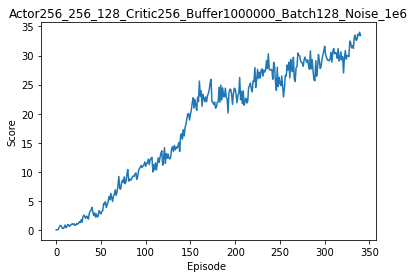

Episode [341/1000]	Average scores: 33.44


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


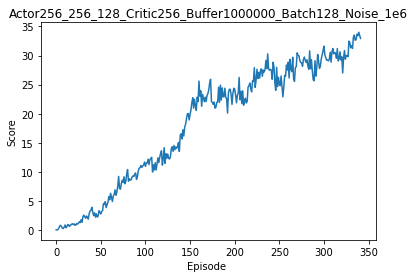

Episode [342/1000]	Average scores: 32.93


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


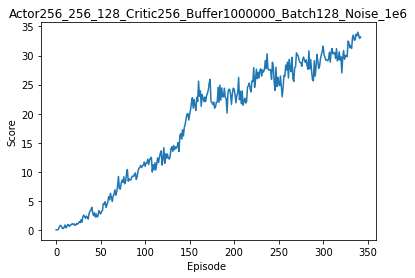

Episode [343/1000]	Average scores: 33.19


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


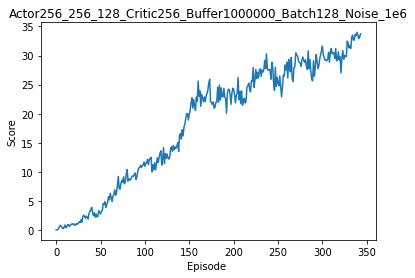

Episode [344/1000]	Average scores: 33.74


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


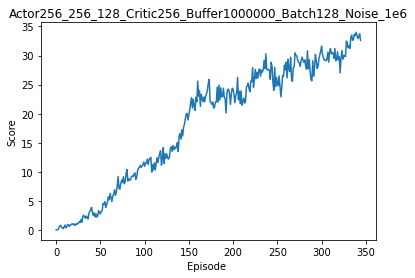

Episode [345/1000]	Average scores: 32.60


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


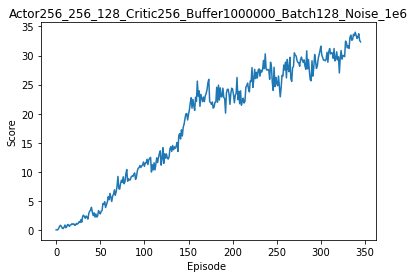

Episode [346/1000]	Average scores: 32.35


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


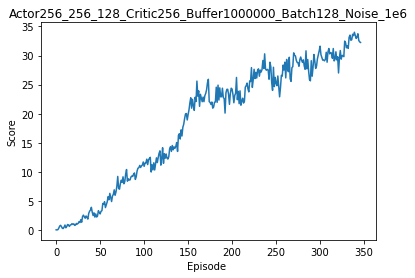

Episode [347/1000]	Average scores: 32.25


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


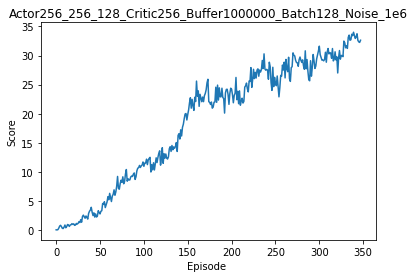

Episode [348/1000]	Average scores: 32.63


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


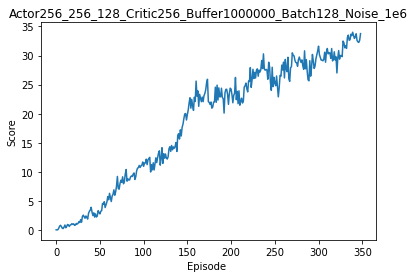

Episode [349/1000]	Average scores: 33.77


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


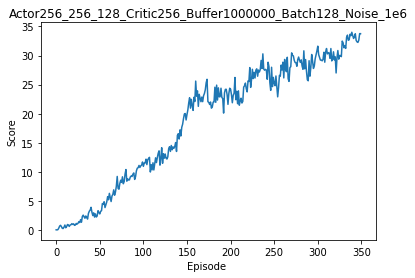

Episode [350/1000]	Average scores: 33.76


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


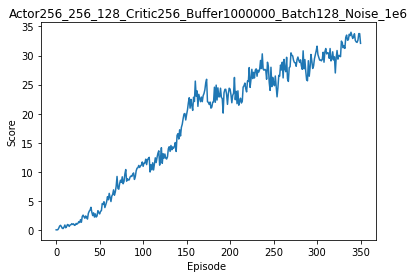

Episode [351/1000]	Average scores: 32.10


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


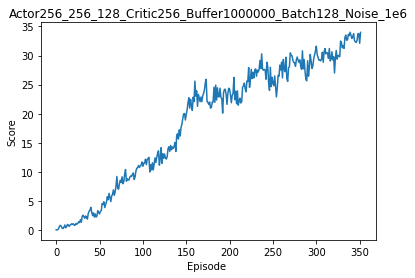

Episode [352/1000]	Average scores: 33.98


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


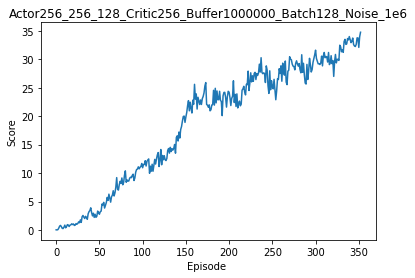

Episode [353/1000]	Average scores: 34.76


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


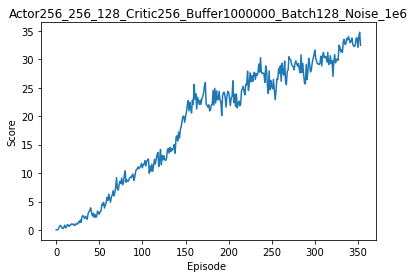

Episode [354/1000]	Average scores: 32.47


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


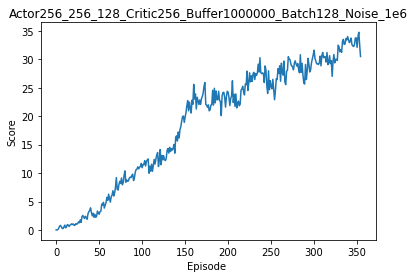

Episode [355/1000]	Average scores: 30.49


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


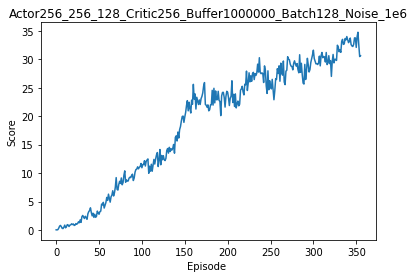

Episode [356/1000]	Average scores: 30.63


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


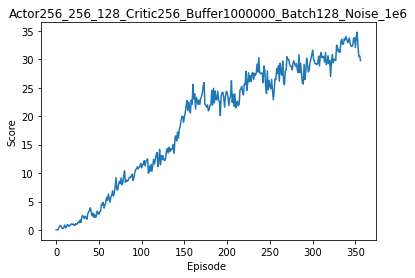

Episode [357/1000]	Average scores: 29.79


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


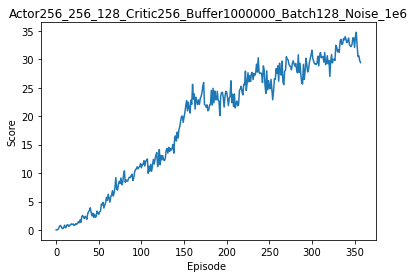

Episode [358/1000]	Average scores: 29.42


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


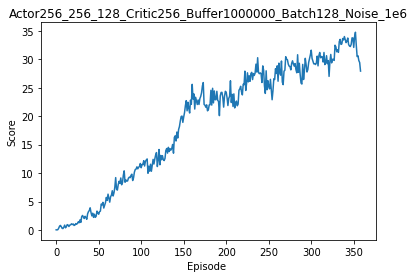

Episode [359/1000]	Average scores: 27.93


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


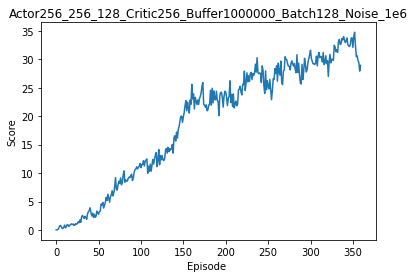

Episode [360/1000]	Average scores: 28.93


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


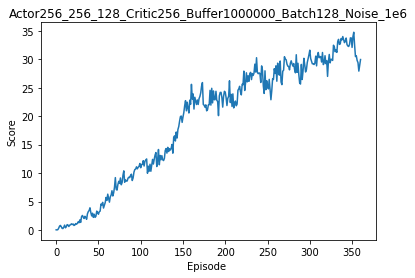

Episode [361/1000]	Average scores: 29.96


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


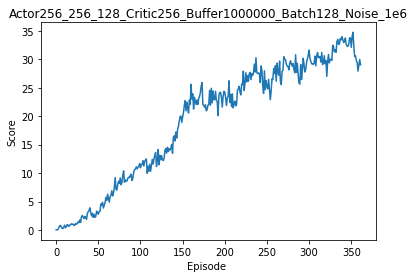

Episode [362/1000]	Average scores: 29.04


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


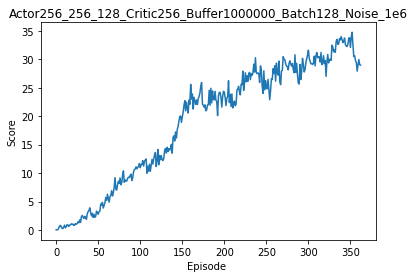

Episode [363/1000]	Average scores: 28.98


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


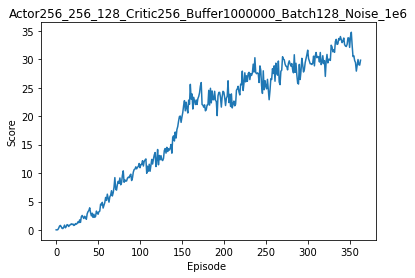

Episode [364/1000]	Average scores: 29.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


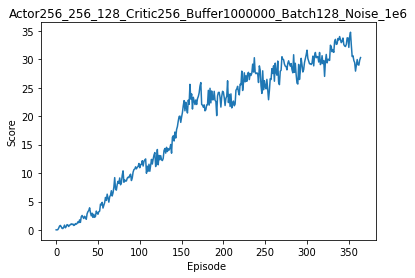

Episode [365/1000]	Average scores: 30.31


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


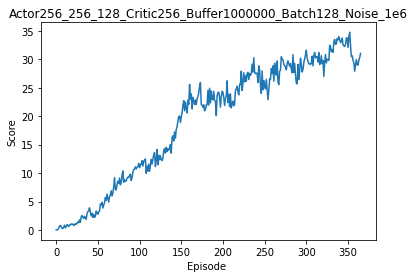

Episode [366/1000]	Average scores: 31.04


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


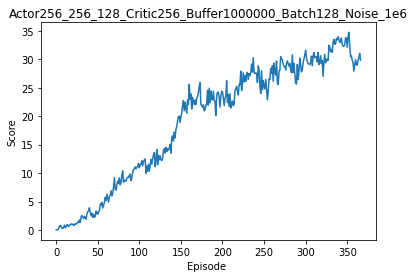

Episode [367/1000]	Average scores: 29.84


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


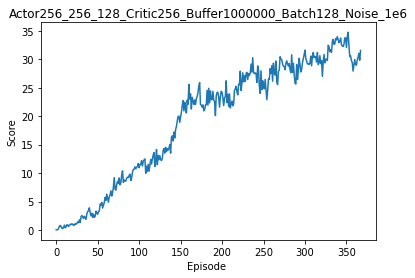

Episode [368/1000]	Average scores: 31.55


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


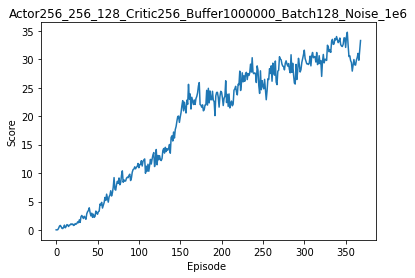

Episode [369/1000]	Average scores: 33.30


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


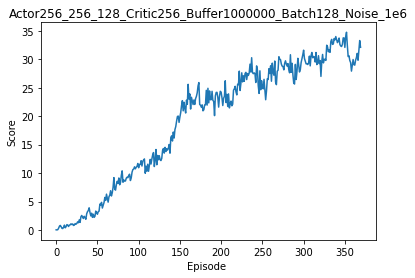

Episode [370/1000]	Average scores: 32.12


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


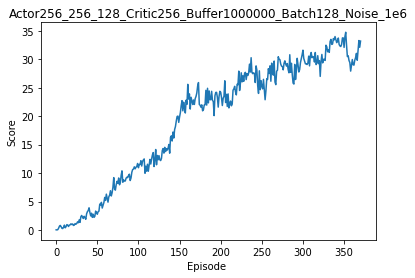

Episode [371/1000]	Average scores: 33.21


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


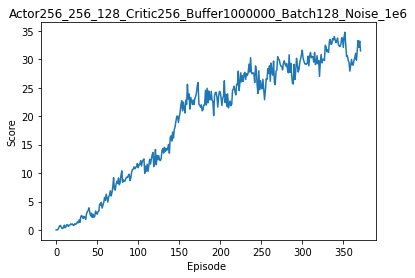

Episode [372/1000]	Average scores: 31.49


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


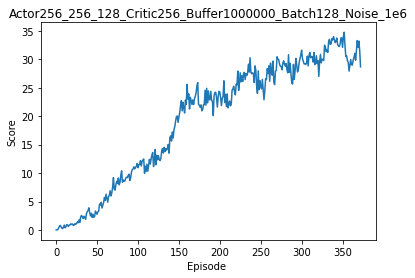

Episode [373/1000]	Average scores: 28.68


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


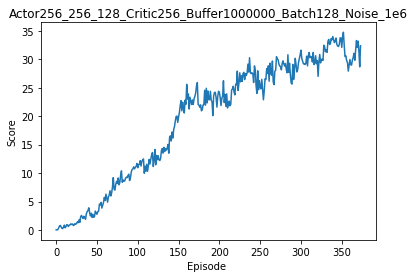

Episode [374/1000]	Average scores: 32.38


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


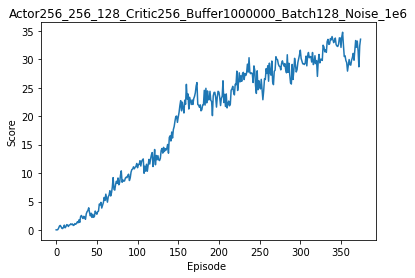

Episode [375/1000]	Average scores: 33.54


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


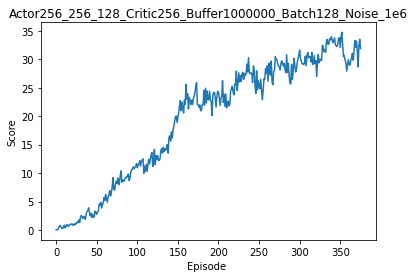

Episode [376/1000]	Average scores: 31.89


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


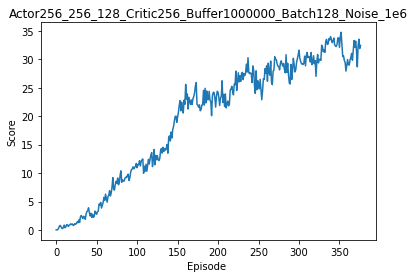

Episode [377/1000]	Average scores: 32.44


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


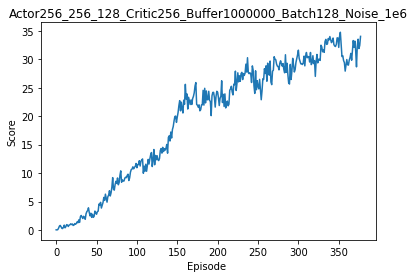

Episode [378/1000]	Average scores: 34.03


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


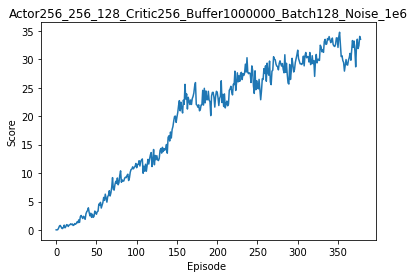

Episode [379/1000]	Average scores: 33.54


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


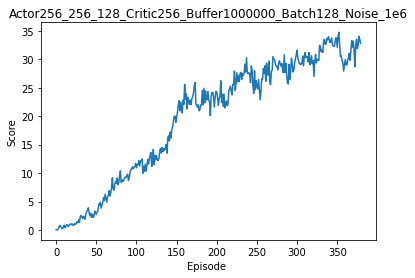

Episode [380/1000]	Average scores: 32.84


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


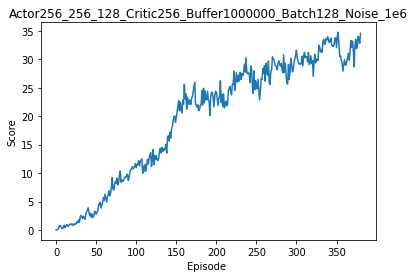

Episode [381/1000]	Average scores: 34.60


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


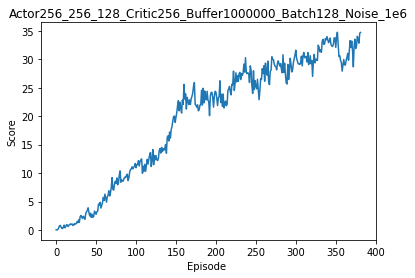

Episode [382/1000]	Average scores: 34.72


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


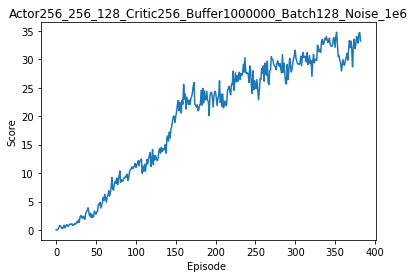

Episode [383/1000]	Average scores: 33.20


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


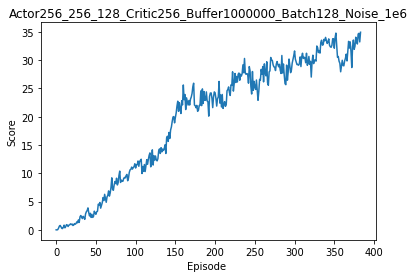

Episode [384/1000]	Average scores: 34.91


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


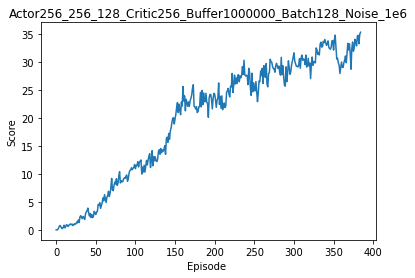

Episode [385/1000]	Average scores: 35.28


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


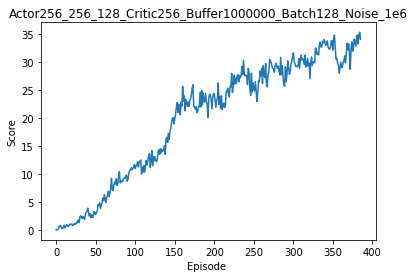

Episode [386/1000]	Average scores: 34.03


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


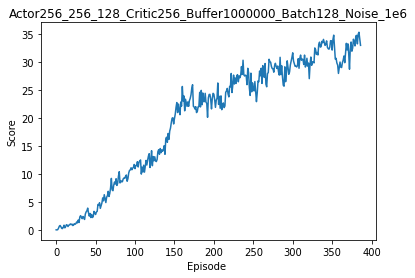

Episode [387/1000]	Average scores: 32.94


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


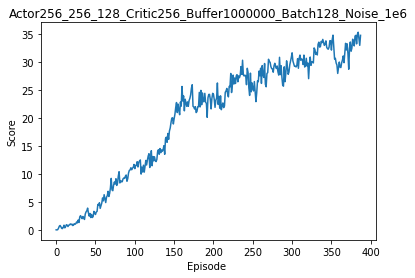

Episode [388/1000]	Average scores: 34.72


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


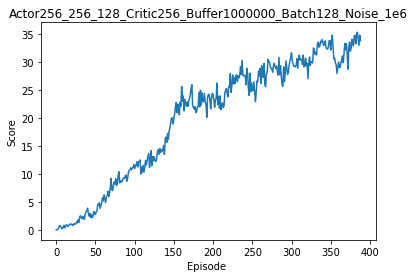

Episode [389/1000]	Average scores: 33.79


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


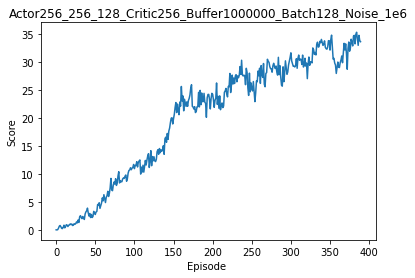

Episode [390/1000]	Average scores: 33.59


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


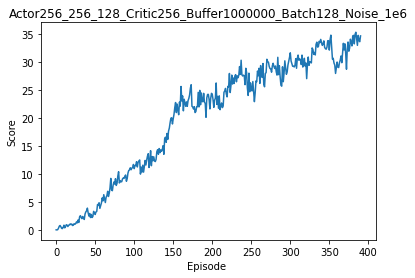

Episode [391/1000]	Average scores: 34.63


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


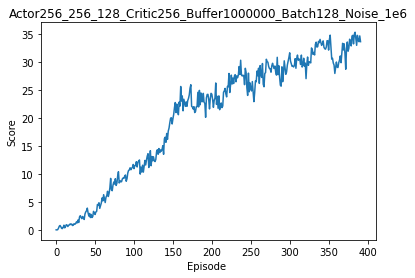

Episode [392/1000]	Average scores: 33.60


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


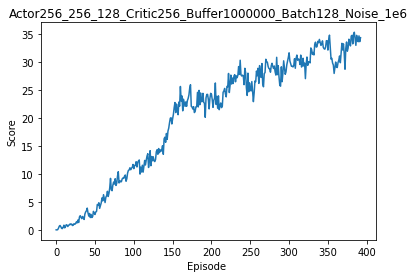

Episode [393/1000]	Average scores: 34.31


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


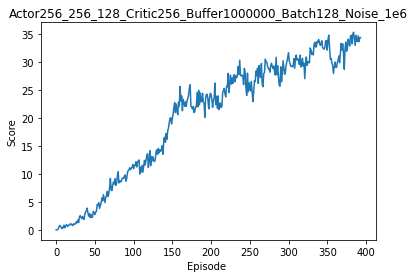

Episode [394/1000]	Average scores: 34.32


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


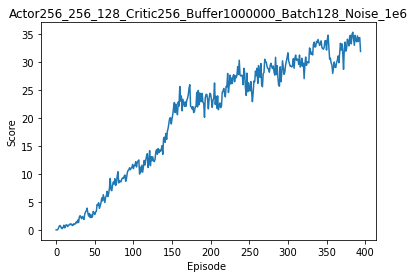

Episode [395/1000]	Average scores: 31.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


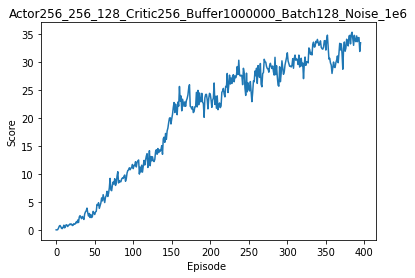

Episode [396/1000]	Average scores: 33.40


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


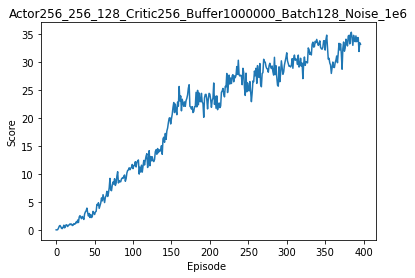

Episode [397/1000]	Average scores: 33.14


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


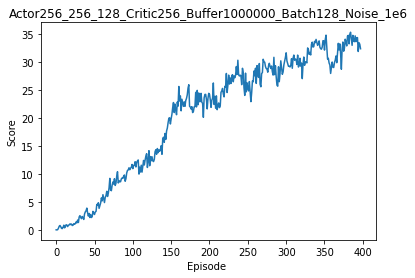

Episode [398/1000]	Average scores: 32.34


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


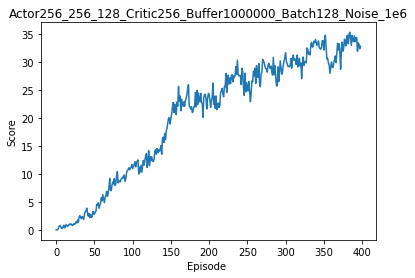

Episode [399/1000]	Average scores: 32.78


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


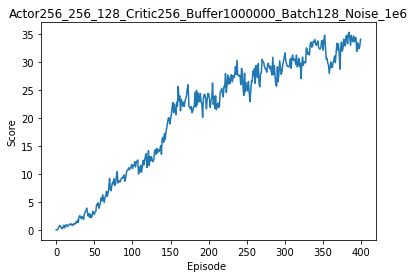

Episode [400/1000]	Average scores: 34.05


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


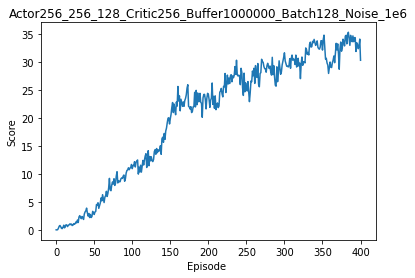

Episode [401/1000]	Average scores: 30.28


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


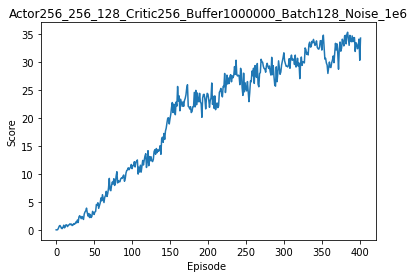

Episode [402/1000]	Average scores: 34.23


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


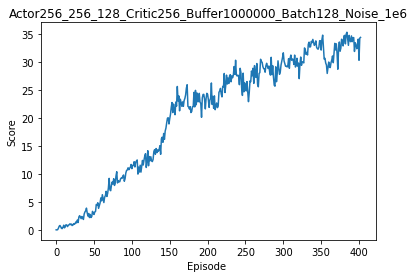

Episode [403/1000]	Average scores: 34.36


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


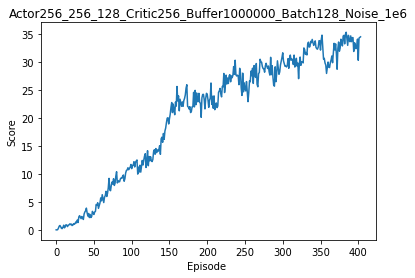

Episode [404/1000]	Average scores: 34.46


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


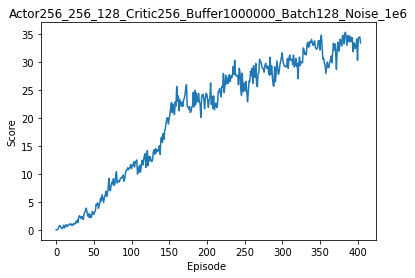

Episode [405/1000]	Average scores: 33.38


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


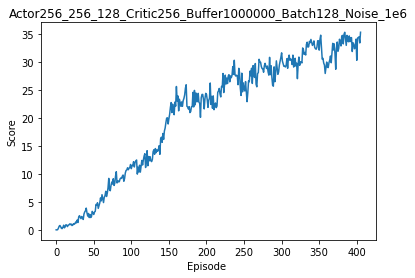

Episode [406/1000]	Average scores: 35.28


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


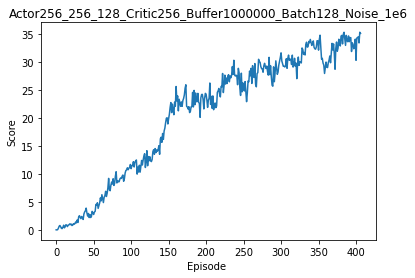

Episode [407/1000]	Average scores: 35.09


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


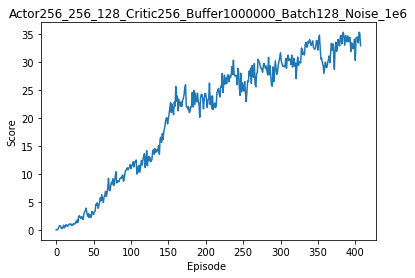

Episode [408/1000]	Average scores: 32.86


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


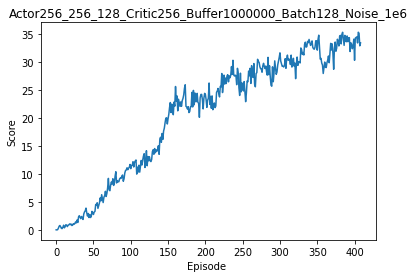

Episode [409/1000]	Average scores: 33.38


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


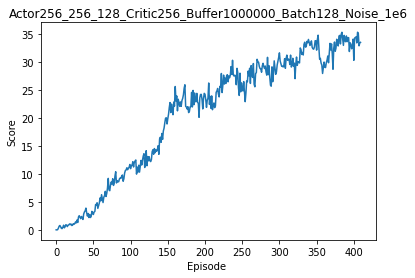

Episode [410/1000]	Average scores: 33.48


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


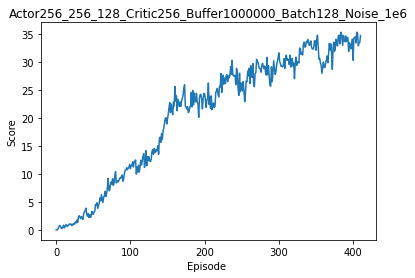

Episode [411/1000]	Average scores: 34.70


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


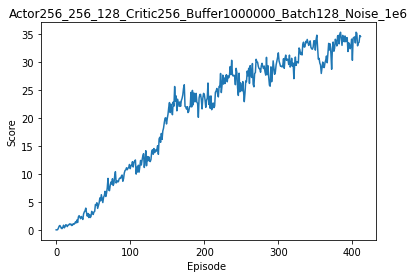

Episode [412/1000]	Average scores: 34.53


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


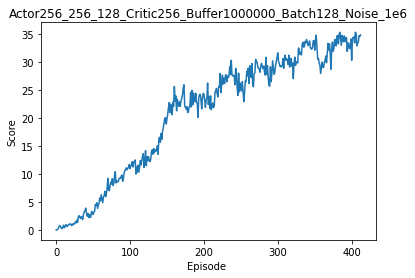

Episode [413/1000]	Average scores: 34.81


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


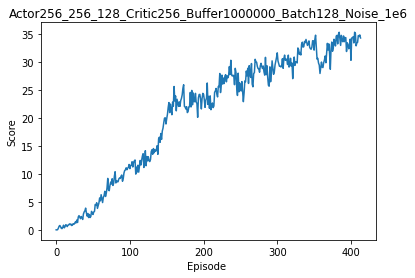

Episode [414/1000]	Average scores: 34.26


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


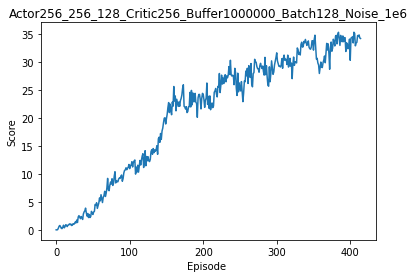

Episode [415/1000]	Average scores: 34.17


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


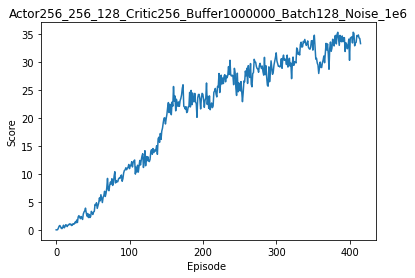

Episode [416/1000]	Average scores: 33.26


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


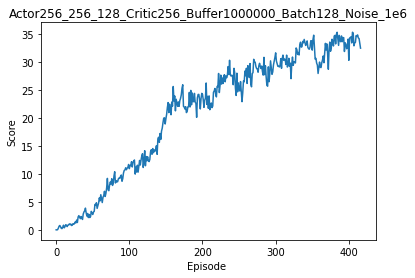

Episode [417/1000]	Average scores: 32.45


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


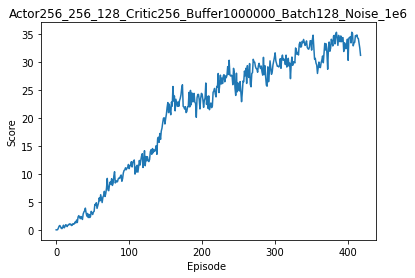

Episode [418/1000]	Average scores: 31.17


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


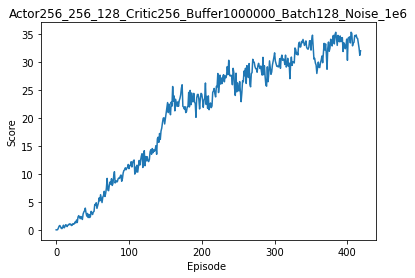

Episode [419/1000]	Average scores: 31.97


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


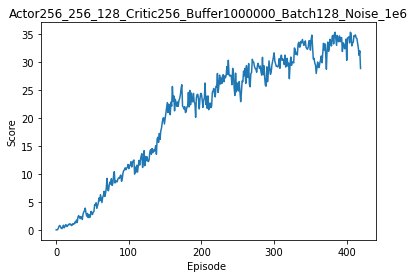

Episode [420/1000]	Average scores: 28.82


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


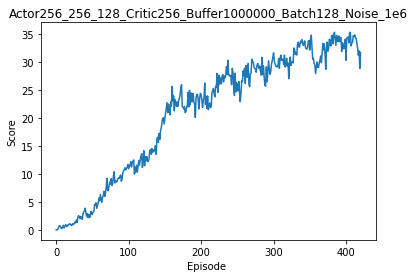

Episode [421/1000]	Average scores: 31.70


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


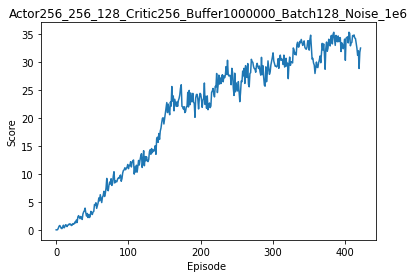

Episode [422/1000]	Average scores: 32.46


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


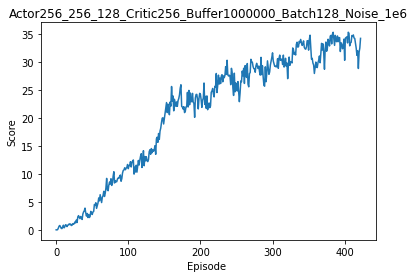

Episode [423/1000]	Average scores: 34.19


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


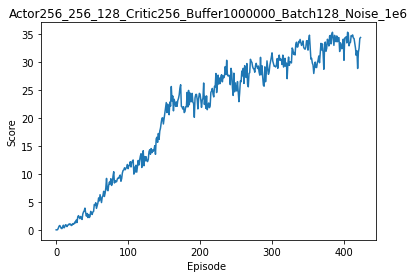

Episode [424/1000]	Average scores: 34.34


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


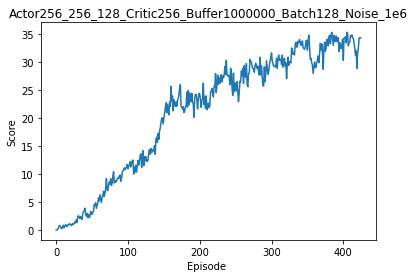

Episode [425/1000]	Average scores: 34.27


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


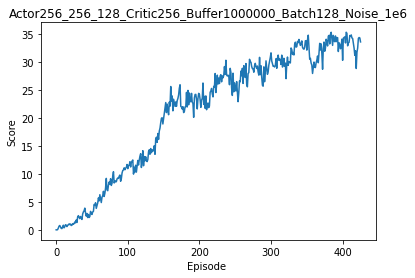

Episode [426/1000]	Average scores: 33.56


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


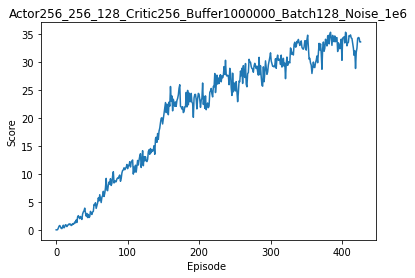

Episode [427/1000]	Average scores: 33.55


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


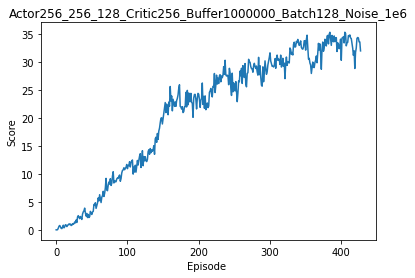

Episode [428/1000]	Average scores: 31.96


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


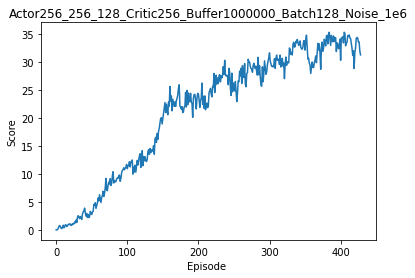

Episode [429/1000]	Average scores: 31.24


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


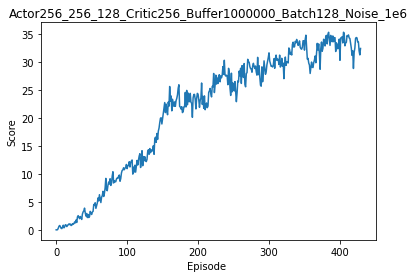

Episode [430/1000]	Average scores: 32.39


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


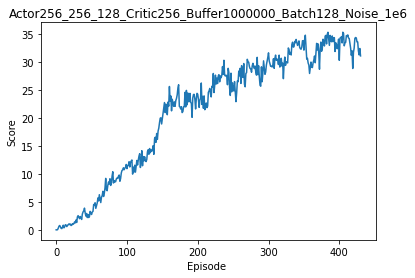

Episode [431/1000]	Average scores: 31.07


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


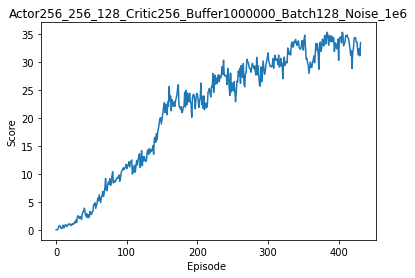

Episode [432/1000]	Average scores: 33.44


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


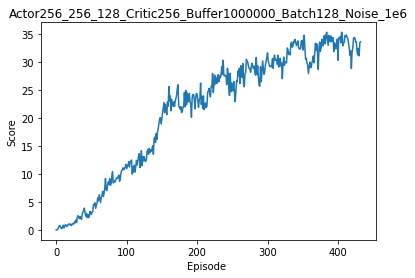

Episode [433/1000]	Average scores: 33.57


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


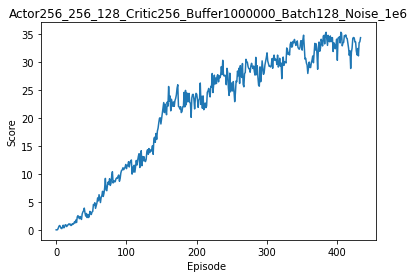

Episode [434/1000]	Average scores: 34.32


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


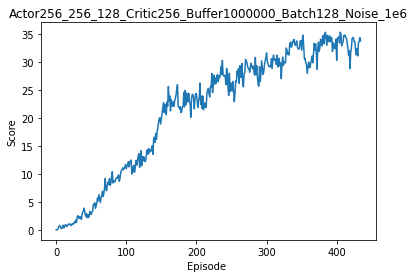

Episode [435/1000]	Average scores: 33.74


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


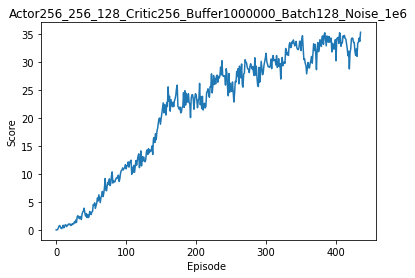

Episode [436/1000]	Average scores: 35.38


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


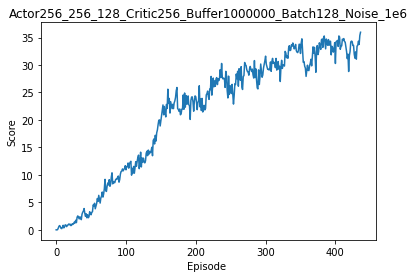

Episode [437/1000]	Average scores: 35.96


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


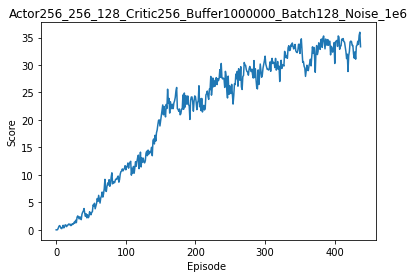

Episode [438/1000]	Average scores: 33.32


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


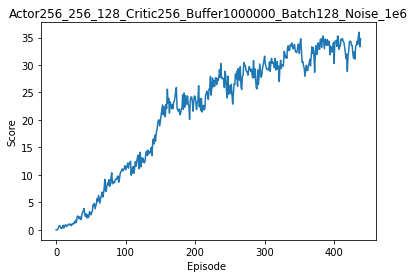

Episode [439/1000]	Average scores: 34.75


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


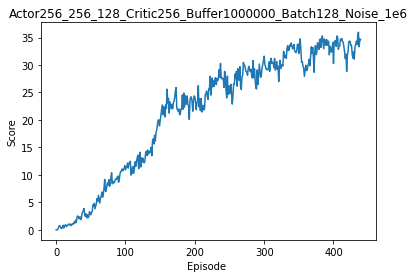

Episode [440/1000]	Average scores: 34.61


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


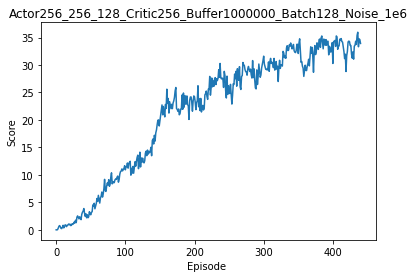

Episode [441/1000]	Average scores: 33.92


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


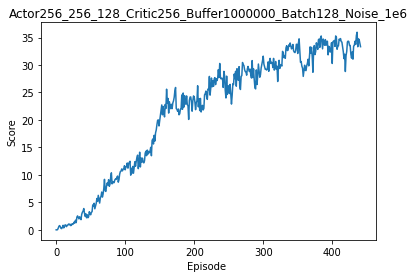

Episode [442/1000]	Average scores: 33.33


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


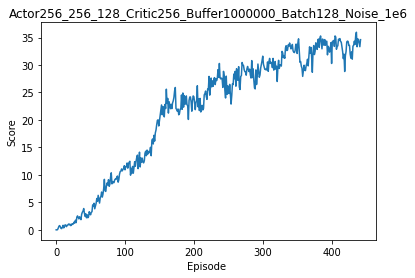

Episode [443/1000]	Average scores: 34.61


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


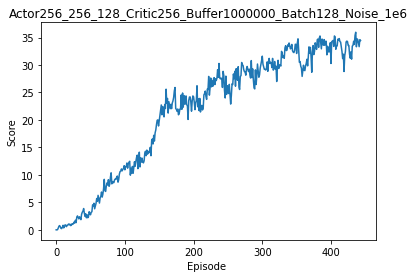

Episode [444/1000]	Average scores: 34.45


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


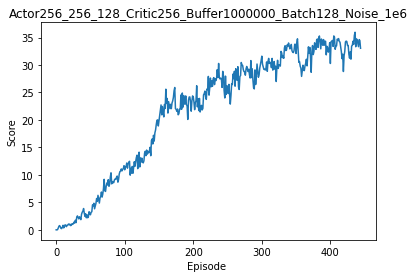

Episode [445/1000]	Average scores: 33.05


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


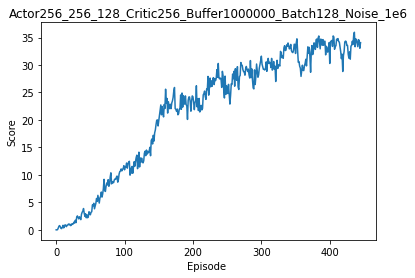

Episode [446/1000]	Average scores: 34.07


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


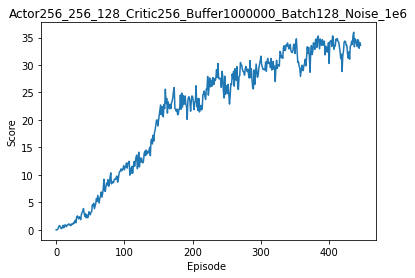

Episode [447/1000]	Average scores: 33.59


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


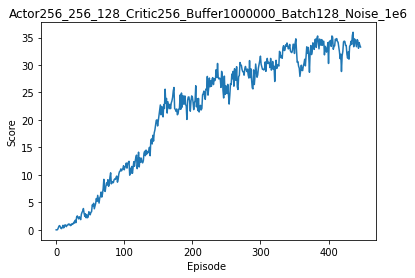

Episode [448/1000]	Average scores: 33.27


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


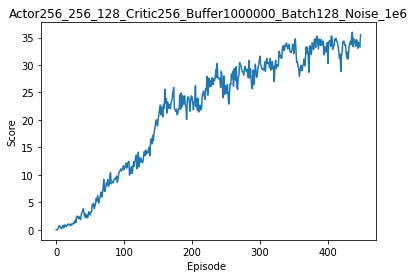

Episode [449/1000]	Average scores: 35.51


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


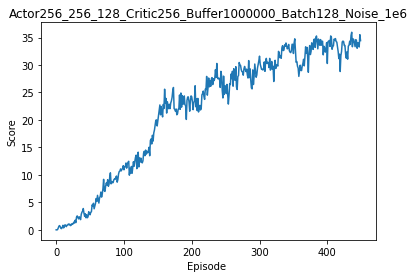

Episode [450/1000]	Average scores: 34.44


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


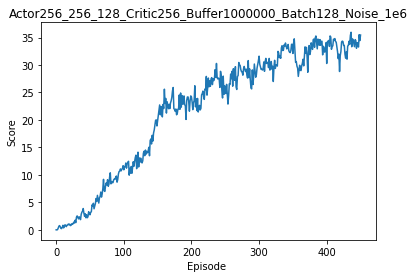

Episode [451/1000]	Average scores: 35.45


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


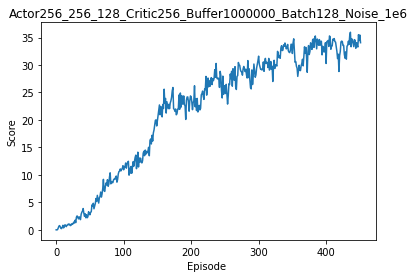

Episode [452/1000]	Average scores: 34.06


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


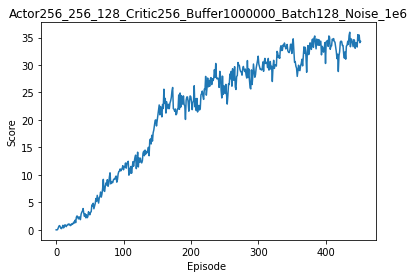

Episode [453/1000]	Average scores: 34.30


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


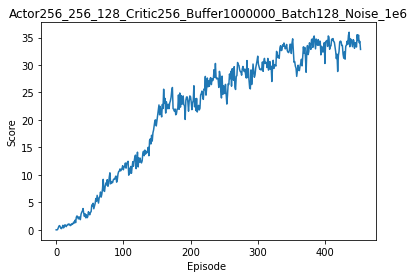

Episode [454/1000]	Average scores: 32.83


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


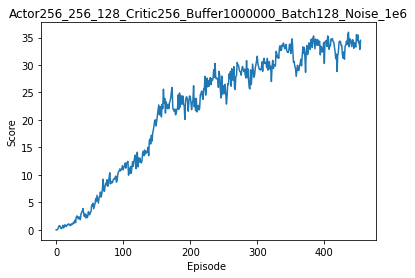

Episode [455/1000]	Average scores: 34.48


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


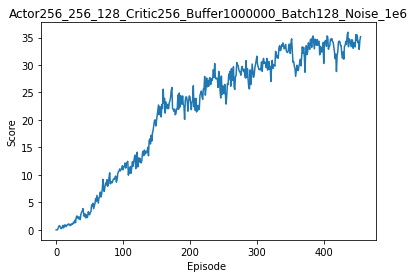

Episode [456/1000]	Average scores: 35.15


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


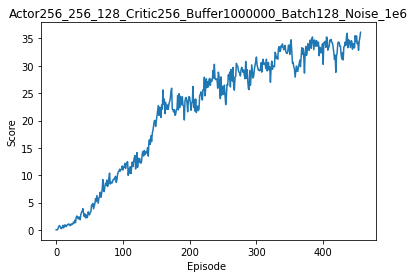

Episode [457/1000]	Average scores: 36.14


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


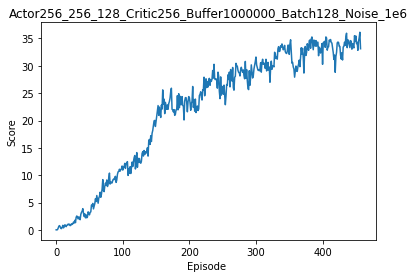

Episode [458/1000]	Average scores: 33.12


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


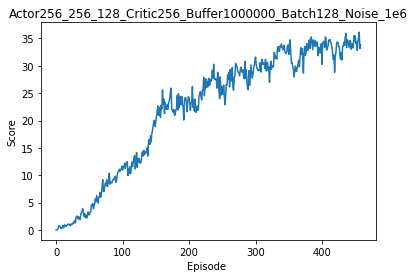

Episode [459/1000]	Average scores: 33.83


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


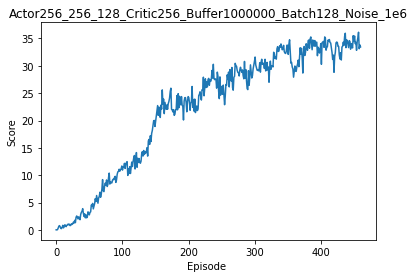

Episode [460/1000]	Average scores: 33.46


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


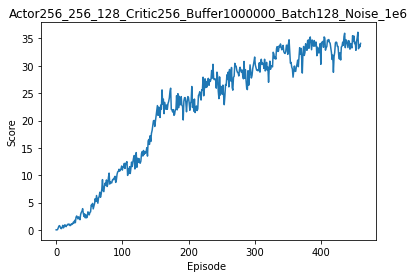

Episode [461/1000]	Average scores: 34.10


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


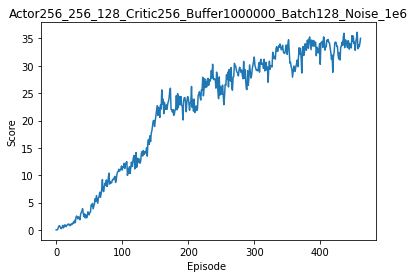

Episode [462/1000]	Average scores: 35.03


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


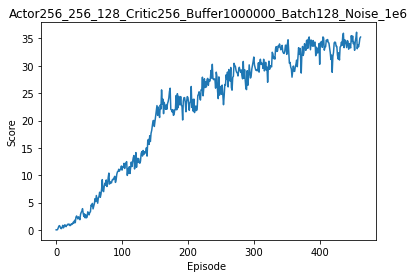

Episode [463/1000]	Average scores: 35.25


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


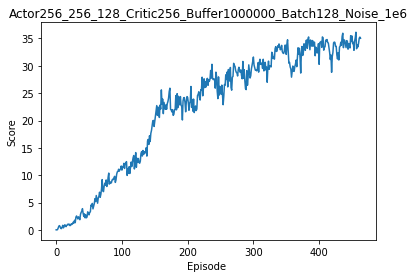

Episode [464/1000]	Average scores: 35.05


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


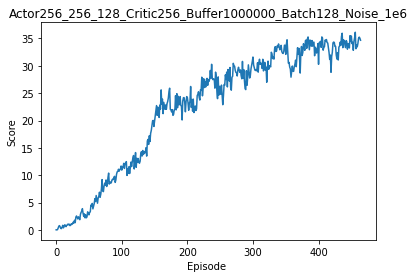

Episode [465/1000]	Average scores: 34.68


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


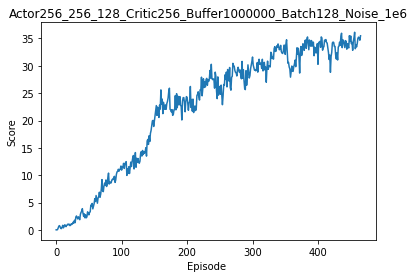

Episode [466/1000]	Average scores: 35.49


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


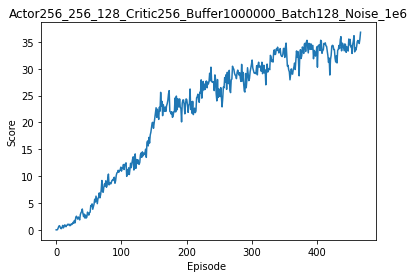

Episode [467/1000]	Average scores: 36.78


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


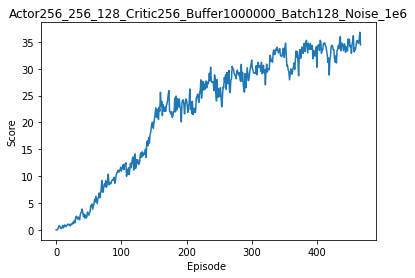

Episode [468/1000]	Average scores: 34.44


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


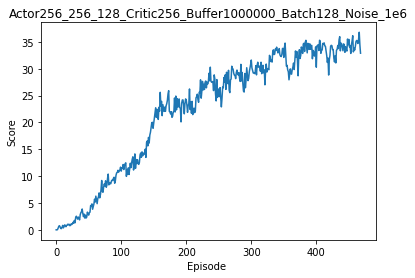

Episode [469/1000]	Average scores: 32.88


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


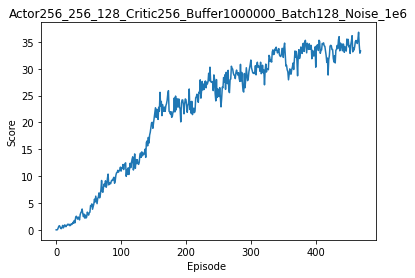

Episode [470/1000]	Average scores: 33.28


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


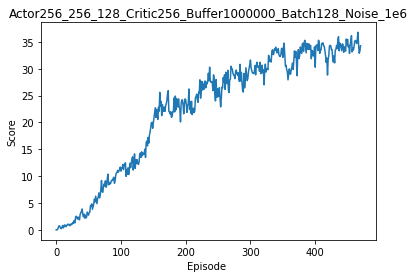

Episode [471/1000]	Average scores: 34.26


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


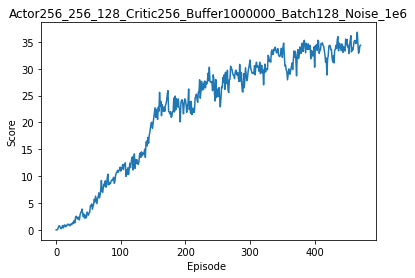

Episode [472/1000]	Average scores: 34.36


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


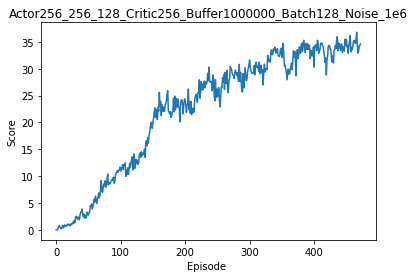

Episode [473/1000]	Average scores: 34.58


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


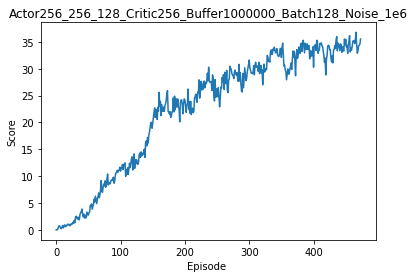

Episode [474/1000]	Average scores: 35.53


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


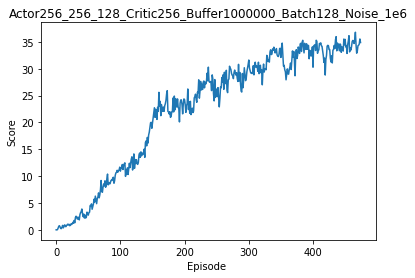

Episode [475/1000]	Average scores: 34.87


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


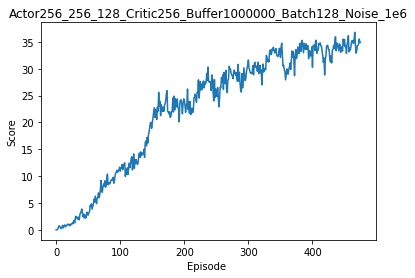

Episode [476/1000]	Average scores: 34.88


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


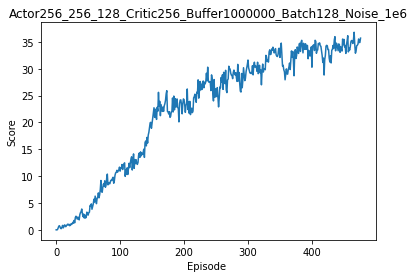

Episode [477/1000]	Average scores: 35.68


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


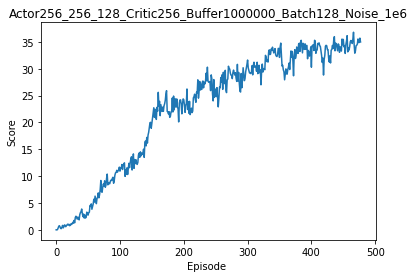

Episode [478/1000]	Average scores: 34.97


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


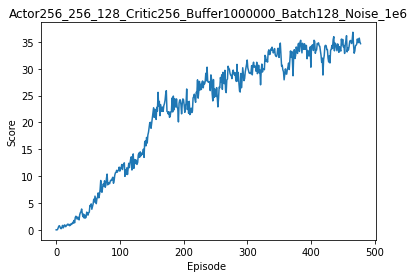

Episode [479/1000]	Average scores: 34.65


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


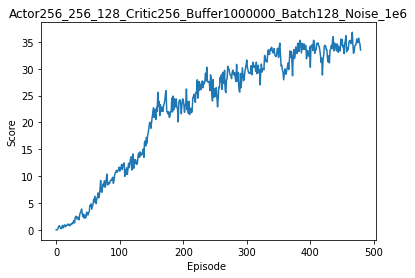

Episode [480/1000]	Average scores: 33.48


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


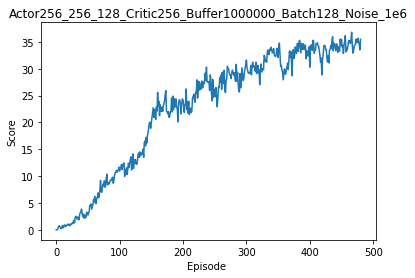

Episode [481/1000]	Average scores: 35.46


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


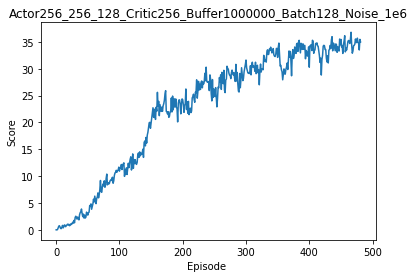

Episode [482/1000]	Average scores: 34.99


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


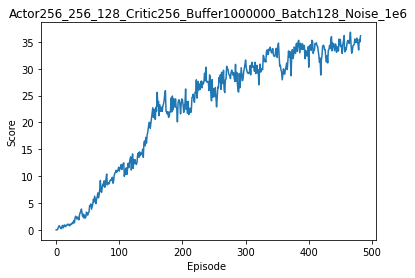

Episode [483/1000]	Average scores: 36.12


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


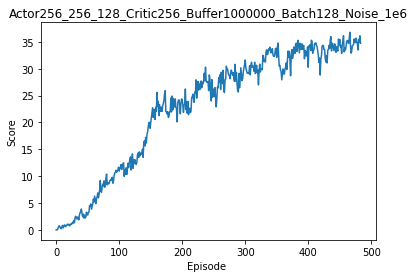

Episode [484/1000]	Average scores: 34.72


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


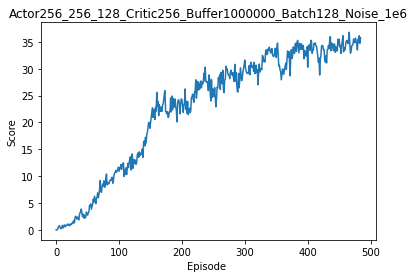

Episode [485/1000]	Average scores: 35.77


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


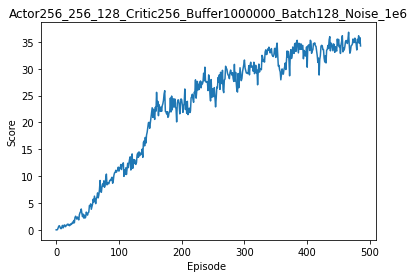

Episode [486/1000]	Average scores: 34.23


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


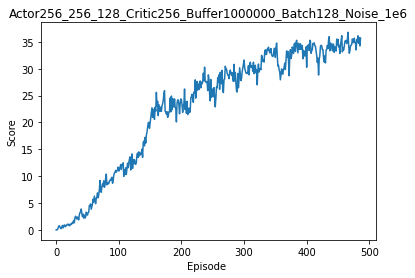

Episode [487/1000]	Average scores: 35.71


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


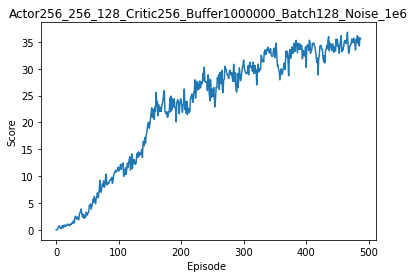

Episode [488/1000]	Average scores: 35.63


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


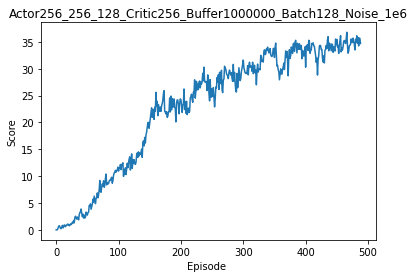

Episode [489/1000]	Average scores: 34.68


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


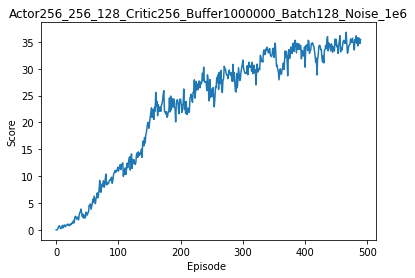

Episode [490/1000]	Average scores: 35.43


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


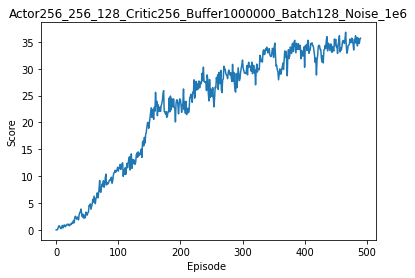

Episode [491/1000]	Average scores: 35.66


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


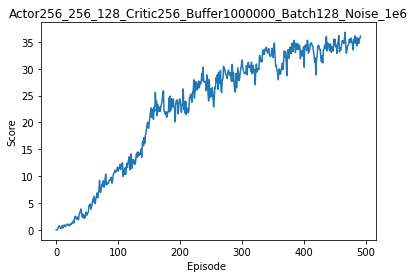

Episode [492/1000]	Average scores: 36.06


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


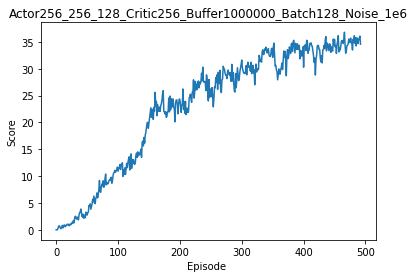

Episode [493/1000]	Average scores: 34.56


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


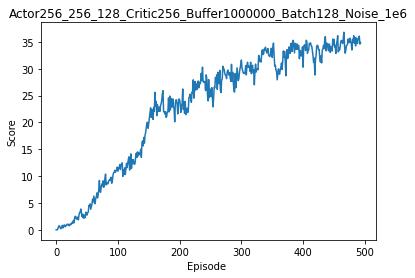

Episode [494/1000]	Average scores: 34.85


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


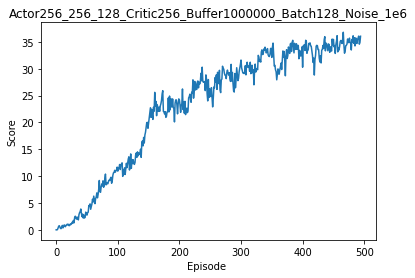

Episode [495/1000]	Average scores: 36.03


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


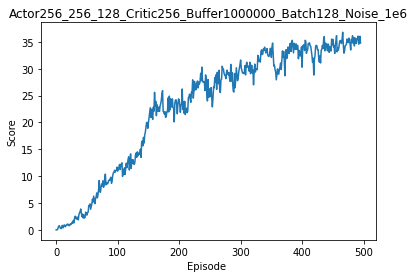

Episode [496/1000]	Average scores: 34.77


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


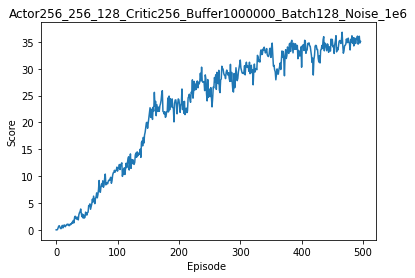

Episode [497/1000]	Average scores: 35.07


/usr/local/Caskroom/miniconda/base/envs/drlnd/lib/python3.6/site-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/Users/DanielD/Documents/99_Studium/03_LebenslangesLernen/DeepReinforcementLearning/deep-reinforcement-learning/p2_continuous-control/DDPG/ddpg_agent.py:118: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(self.critic_local.parameters(), 1)


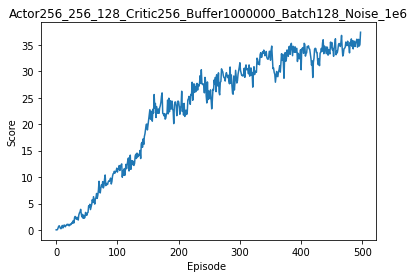

Episode [498/1000]	Average scores: 37.38


In [8]:
import numpy as np
from DDPG.model import *
from DDPG.ddpg_agent import Agent
from collections import deque
import csv
import matplotlib.pyplot as plt

# Variables for saving
critic ='256'
actor ='256_256_128'
buffer =int(1e6)
batch = 128
addinfo ='Noise_1e6'


# Initialize Feed-forward DNNs for Actor and Critic models. 
agent = Agent(state_size=env_info.vector_observations.shape[1], action_size=brain.vector_action_space_size, random_seed=0)



# Set the number of episodes to run the simulation
episodes = 1000
max_t    = 1000

env_info = env.reset(train_mode=True)[brain_name]     # reset the environment    
states = env_info.vector_observations                  # get the current state (for each agent)
scores = np.zeros(num_agents)                          # initialize the score (for each agent)
score_list = []                                      # score list for plotting the result
for episode in range(episodes):
    
    env_info = env.reset(train_mode=True)[brain_name]     # reset the environment    
    states = env_info.vector_observations                  # get the current state (for each agent)
    scores = np.zeros(num_agents)                          # initialize the score (for each agent
    
    agent.reset()                                         # Clears noise parameter
    
    for t in range(max_t):
        
        # Predict the best action for the current state. 
        actions = agent.act( states )
        # Action is performed and new state, reward, info are received. 
        env_info = env.step(actions)[brain_name]           # send all actions to tne environment
        next_states = env_info.vector_observations         # get next state (for each agent)
        rewards = env_info.rewards                         # get reward (for each agent)
        dones = env_info.local_done                        # see if episode finished

        # current state, action, reward, new state are stored in the experience replay
        # Every N Timesteps and just a few of them 
        agent.step(states, actions, rewards, next_states, dones,t) 

        scores += env_info.rewards                         # update the score (for each agent)
        states = next_states                               # roll over states to next time step
            #if (episode + 1) % 1000 == 0: # print average scores over last 1000 episodes
            #    print('\rEpisode [{}/{}]\tAverage scores: {:,.2f}'.format(episode + 1, episodes, np.mean(scores)))  
        if np.any(dones):                                  # exit loop if episode finished
            print('\rEpisode [{}/{}]\tAverage scores: {:,.2f}'.format(episode + 1, episodes, np.mean(scores)))
            break
    score_list.append(np.mean(scores))                     # saves results in list
    plot_score(score_list, actor,critic,buffer,batch,addinfo)
    print('\rEpisode [{}/{}]\tAverage scores: {:,.2f}'.format(episode + 1, episodes, np.mean(scores)))
    # If the goal is over delivered.
    if np.mean(scores) > 37:
        break     


In [9]:
import pickle

# Saving the objects:
torch.save(agent.actor_local.state_dict(), 'saved_models/checkpoint_actor'+'_Actor'+str(actor)+'_Critic'+str(critic)+'_Buffer' + str(int(buffer))+'_Batch'+str(int(batch))+'_'+str(addinfo)+'.pth')
torch.save(agent.critic_local.state_dict(), 'saved_models/checkpoint_critic'+'_Actor'+str(actor)+'_Critic'+str(critic)+'_Buffer'+str(int(buffer))+'_Batch'+str(int(batch))+'_'+str(addinfo)+'.pth')
with open('saved_models/score''_Actor'+str(actor)+'_Critic'+str(critic)+'_Buffer'+str(int(buffer))+'_Batch'+str(int(batch))+'_'+str(addinfo)+'.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump([score_list], f)

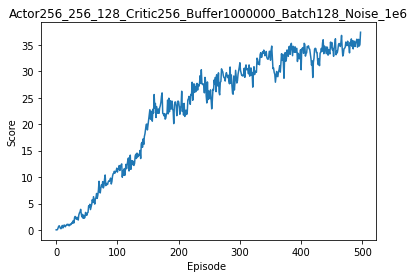

<Figure size 432x288 with 0 Axes>

In [10]:
# plot the scores
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(np.arange(len(score_list)), score_list)
plt.ylabel('Score')
plt.xlabel('Episode ')
plt.title('Actor'+str(actor)+'_Critic'+str(critic)+'_Buffer' + str(int(buffer))+'_Batch'+str(int(batch))+'_'+str(addinfo))
plt.show()
plt.savefig('./img/Scores_Actor'+str(actor)+'_Critic'+str(critic)+'_Buffer' + str(int(buffer))+'_Batch'+str(int(batch))+'_'+str(addinfo)+'.png', dpi=400)